In [1]:
import os
import random
import collections
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision.transforms.v2 as v2
import torchvision.transforms.functional as F
from torchvision.tv_tensors import Image, Mask

import torchvision.transforms.v2.functional as F
from torchvision.utils import draw_segmentation_masks
from tqdm import tqdm


In [2]:
!pip install torchinfo 
from torchinfo import summary

In [3]:
!pip install segmentation-models-pytorch -q
import segmentation_models_pytorch as smp

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 7.7 MB/s eta 0:00:00


In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [5]:
class config:
    num_epochs = 100
    lr = 0.001

# 1.Preprocessing

In [6]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("sadhliroomyprime/football-semantic-segmentation")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/football-semantic-segmentation


In [7]:
import os
import collections

image_folder = os.path.join(path, "images")
file_list = os.listdir(image_folder)

print(f"file_list: {len(file_list)}")
print(file_list)

file_list: 300
['Frame 1  (68).jpg___fuse.png', 'Frame 1  (96).jpg', 'Frame 1  (41).jpg', 'Frame 1  (85).jpg___fuse.png', 'Frame 1  (41).jpg___save.png', 'Frame 1  (48).jpg', 'Frame 1  (14).jpg___save.png', 'Frame 1  (83).jpg', 'Frame 1  (39).jpg___fuse.png', 'Frame 1  (47).jpg___fuse.png', 'Frame 1  (74).jpg', 'Frame 1  (24).jpg___fuse.png', 'Frame 1  (52).jpg', 'Frame 1  (63).jpg___fuse.png', 'Frame 1  (18).jpg___fuse.png', 'Frame 1  (72).jpg___save.png', 'Frame 1  (50).jpg___save.png', 'Frame 1  (16).jpg___fuse.png', 'Frame 1  (84).jpg___fuse.png', 'Frame 1  (57).jpg___save.png', 'Frame 1  (13).jpg___fuse.png', 'Frame 1  (37).jpg', 'Frame 1  (37).jpg___fuse.png', 'Frame 1  (80).jpg___fuse.png', 'Frame 1  (9).jpg___save.png', 'Frame 1  (100).jpg', 'Frame 1  (64).jpg', 'Frame 1  (70).jpg', 'Frame 1  (88).jpg___save.png', 'Frame 1  (7).jpg___save.png', 'Frame 1  (69).jpg', 'Frame 1  (1).jpg', 'Frame 1  (4).jpg', 'Frame 1  (19).jpg___save.png', 'Frame 1  (56).jpg', 'Frame 1  (24).jpg', 

In [8]:
# fuse , save
original_images = sorted([f for f in file_list if f.endswith(".jpg")])
fuse_images = sorted([f for f in file_list if "fuse" in f])
save_images = sorted([f for f in file_list if "save" in f])

print(original_images)
print(fuse_images)
print(save_images)

['Frame 1  (1).jpg', 'Frame 1  (10).jpg', 'Frame 1  (100).jpg', 'Frame 1  (11).jpg', 'Frame 1  (12).jpg', 'Frame 1  (13).jpg', 'Frame 1  (14).jpg', 'Frame 1  (15).jpg', 'Frame 1  (16).jpg', 'Frame 1  (17).jpg', 'Frame 1  (18).jpg', 'Frame 1  (19).jpg', 'Frame 1  (2).jpg', 'Frame 1  (20).jpg', 'Frame 1  (21).jpg', 'Frame 1  (22).jpg', 'Frame 1  (23).jpg', 'Frame 1  (24).jpg', 'Frame 1  (25).jpg', 'Frame 1  (26).jpg', 'Frame 1  (27).jpg', 'Frame 1  (28).jpg', 'Frame 1  (29).jpg', 'Frame 1  (3).jpg', 'Frame 1  (30).jpg', 'Frame 1  (31).jpg', 'Frame 1  (32).jpg', 'Frame 1  (33).jpg', 'Frame 1  (34).jpg', 'Frame 1  (35).jpg', 'Frame 1  (36).jpg', 'Frame 1  (37).jpg', 'Frame 1  (38).jpg', 'Frame 1  (39).jpg', 'Frame 1  (4).jpg', 'Frame 1  (40).jpg', 'Frame 1  (41).jpg', 'Frame 1  (42).jpg', 'Frame 1  (43).jpg', 'Frame 1  (44).jpg', 'Frame 1  (45).jpg', 'Frame 1  (46).jpg', 'Frame 1  (47).jpg', 'Frame 1  (48).jpg', 'Frame 1  (49).jpg', 'Frame 1  (5).jpg', 'Frame 1  (50).jpg', 'Frame 1  (51).j

In [9]:
# check size(H, W, C)

def unique_sizes(image_files, image_folder):
    unique_sizes = set()

    for image in image_files:
        img_path = os.path.join(image_folder, image)
        img = cv2.imread(img_path)
        height, width, channels = img.shape
        img_size = (height, width, channels)
        
        if img_size in unique_sizes:
            continue
        print(f"Image Size (H, W, C): {height}, {width}, {channels}")
        unique_sizes.add(img_size)

print("Unique sizes of Original Image")
unique_sizes(original_images, image_folder)
print("Unique sizes of Fuse Image")
unique_sizes(fuse_images, image_folder)
print("Unique sizes of Save Image")
unique_sizes(save_images, image_folder)

Unique sizes of Original Image
Image Size (H, W, C): 1080, 1920, 3
Unique sizes of Fuse Image
Image Size (H, W, C): 1080, 1920, 3
Unique sizes of Save Image
Image Size (H, W, C): 1080, 1920, 3


## 1.1. Dataset Sample Visualization

In [10]:
image_pairs = []
for original_image in original_images:
  
    base_name = original_image.replace(".jpg", "")
    fuse_image = next((f for f in fuse_images if base_name in f), None)
    save_image = next((f for f in save_images if base_name in f), None)

    if fuse_image and save_image:
         
        original_path = os.path.join(image_folder, original_image)
        fuse_path = os.path.join(image_folder, fuse_image)
        save_path = os.path.join(image_folder, save_image)

        orig = cv2.imread(original_path)
        fuse = cv2.imread(fuse_path)
        save = cv2.imread(save_path)

        if orig is not None and fuse is not None and save is not None:
            image_pairs.append((orig, fuse, save))


print(f"{len(image_pairs)} pairs")

100 pairs


5 samples


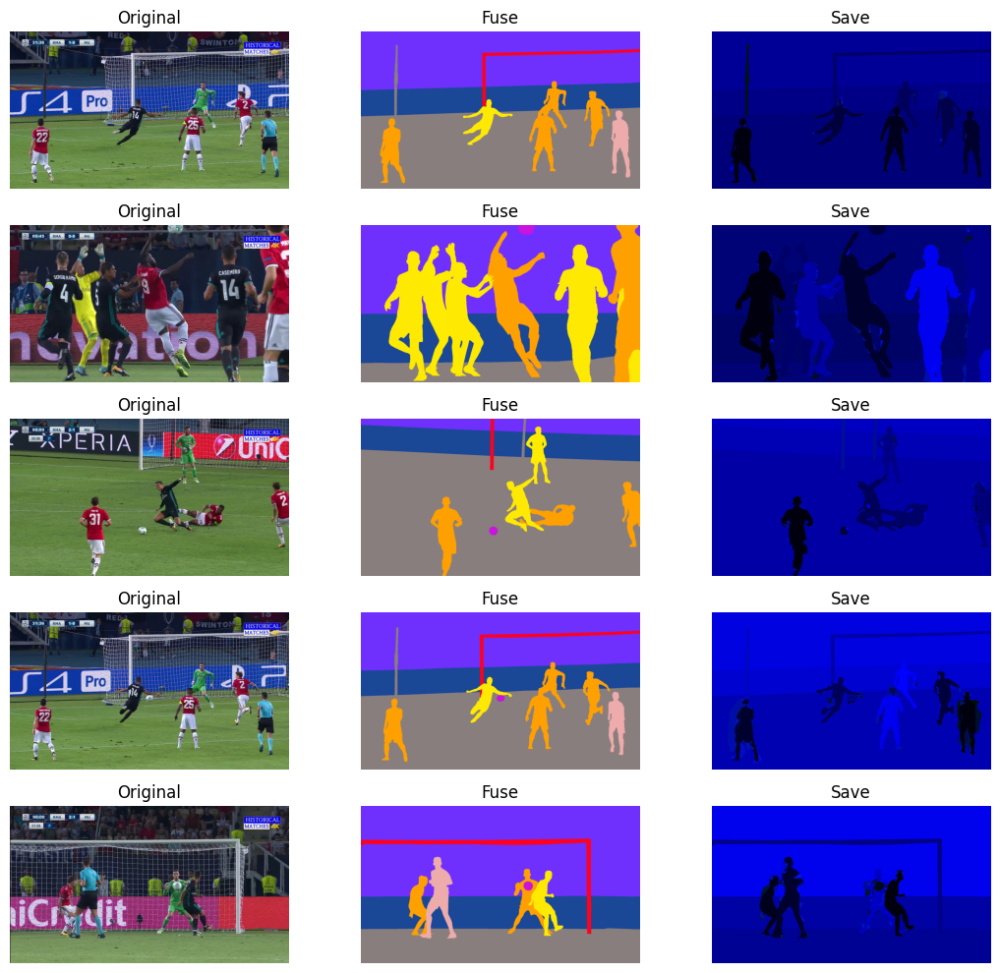

In [11]:
# image pairing and visualization 
num_samples = 5
sample_image_pairs = random.sample(image_pairs, num_samples)

print(f"{len(sample_image_pairs)} samples")

fig, axes, = plt.subplots(num_samples, 3, figsize=(11, 10))

for i, (orig, fuse, save) in enumerate(sample_image_pairs):
    # original image 
    axes[i, 0].imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB))
    axes[i, 0].set_title("Original")
    axes[i, 0].axis("off")

    # fuse
    axes[i, 1].imshow(cv2.cvtColor(fuse, cv2.COLOR_BGR2RGB))
    axes[i, 1].set_title("Fuse")
    axes[i, 1].axis("off")

    # save
    axes[i, 2].imshow(cv2.cvtColor(save, cv2.COLOR_BGR2RGB))
    axes[i, 2].set_title("Save")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

## 1.2. Mask labeling

In [12]:
# collect unique colors across the entire dataset 
def get_unique_colors(image_folder, mask_files, max_classes=11):
    """
    A function that exports  a unique colors from every mask in the dataset 
     extract unique colors from segmentation mask images

    Args:
        image_folder (str): Directory where the mask images are stored.   
        mask_files (list):A list of filenames corresponding to segmentation masks.
        max_classes (int): the number of classes i.e 11 in this case .

    Returns:
        list:  list pf unique colors (up to max_classes)
    """
    color_set = set()

    for mask_file in mask_files:
        mask_path = os.path.join(image_folder, mask_file)
        mask = cv2.imread(mask_path, cv2.IMREAD_COLOR)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        unique_colors, _ = np.unique(mask.reshape(-1, 3), axis=0, return_counts=True)   
        for color in unique_colors:
            if tuple(color) not in color_set:   # add only new colors 
                color_set.add(tuple(color))

                 
                if len(color_set) >= max_classes:
                    return list(color_set)

    return list(color_set)

# collect colors that apperar in all masks 
unique_colors = get_unique_colors(image_folder, fuse_images)
print(f"Unique colors: {len(unique_colors)}")

Unique colors: 11


In [13]:
color_to_label = {color: idx for idx, color in enumerate(unique_colors)}
print(color_to_label)

{(238, 171, 171): 0, (254, 233, 3): 1, (0, 0, 0): 2, (255, 0, 29): 3, (111, 48, 253): 4, (137, 126, 126): 5, (27, 71, 151): 6, (255, 160, 1): 7, (201, 19, 223): 8, (255, 159, 0): 9, (255, 235, 0): 10}


## 1.3 Dataset

In [14]:
class FootballDataset(Dataset):
    def __init__(self, image_files, mask_files, image_folder, color_to_label, transform=None):
        self.image_files = image_files
        self.mask_files = mask_files
        self.image_folder = image_folder
        self.color_to_label = color_to_label  
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_folder, self.image_files[idx])
        mask_path = os.path.join(self.image_folder, self.mask_files[idx])

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        mask = cv2.imread(mask_path, cv2.IMREAD_COLOR)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

        # Transormation branch 
        if self.transform is None:
            img = cv2.resize(img, (256, 256)) / 255.0  # normalization
            img = torch.tensor(img, dtype=torch.float32).permute(2, 0, 1)  # (H, W, C) → (C, H, W)

            mask = cv2.resize(mask, (256, 256), interpolation=cv2.INTER_NEAREST)
            mask = torch.tensor(mask, dtype=torch.uint8).permute(2, 0, 1)  # (H, W, C) → (C, H, W)
        else:
        
            img = Image(torch.from_numpy(img).permute(2, 0, 1))  # (H, W, C) → (C, H, W)
            mask = Mask(torch.from_numpy(mask).permute(2, 0, 1))  # (H, W, C) → (C, H, W)
            img, mask = self.transform(img, mask)

        # convert classes using color_to_label 
        mask_np = mask.permute(1, 2, 0).numpy()
        mask_class = np.zeros(mask_np.shape[:2], dtype=np.uint8)
        for color, label in self.color_to_label.items():
            mask_class[np.all(mask_np == np.array(color), axis=-1)] = label  # use fixed id 

        #final mask conversion 
        mask = torch.tensor(mask_class, dtype=torch.long)  # (H, W)

        return img, mask

In [15]:
dataset_size = len(original_images)
trainval_size = int(0.9 * dataset_size)  # 90 Train
test_size = dataset_size - trainval_size  # 10 Test

# image and mask pair (img, mask)
paired_files = list(zip(original_images, fuse_images))

#randomly split  trainval/test 
trainval_files, test_files = random_split(paired_files, [trainval_size, test_size])

# randomly split train/val 
val_size = int(1/9 * trainval_size)  
train_size = trainval_size - val_size  
train_files, val_files = random_split(trainval_files, [train_size, val_size])


# separate img/mask files from the split dataset
train_image_files, train_mask_files = zip(*train_files)
val_image_files, val_mask_files = zip(*val_files)
test_image_files, test_mask_files = zip(*test_files)

#check output matching  
print("Checking Train images and masks")
for img, mask in zip(train_image_files, train_mask_files):
    base_img = img.split(".jpg")[0]
    base_mask = mask.split(".jpg___fuse.png")[0]
    if base_img != base_mask:
        print(f"Mismatch: {img} <-> {mask}")

print("Checking Val images and masks")
for img, mask in zip(val_image_files, val_mask_files):
    base_img = img.split(".jpg")[0]
    base_mask = mask.split(".jpg___fuse.png")[0]
    if base_img != base_mask:
        print(f"Mismatch: {img} <-> {mask}")

print("Checking Test images and masks")
for img, mask in zip(test_image_files, test_mask_files):
    base_img = img.split(".jpg")[0]
    base_mask = mask.split(".jpg___fuse.png")[0]
    if base_img != base_mask:
        print(f"Mismatch: {img} <-> {mask}")

Checking Train images and masks
Checking Val images and masks
Checking Test images and masks


### 1.3.1. Dataset without agumentation

In [16]:
 
train_dataset = FootballDataset(train_image_files, train_mask_files, image_folder, color_to_label)
val_dataset = FootballDataset(val_image_files, val_mask_files, image_folder, color_to_label)
test_dataset = FootballDataset(test_image_files, test_mask_files, image_folder, color_to_label)

 
train_loader = DataLoader(train_dataset, batch_size=5, shuffle=True, drop_last=False)
val_loader = DataLoader(val_dataset, batch_size=5, shuffle=False, drop_last=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, drop_last=False)

print(f"Train Data: {len(train_dataset)}, Val Data: {len(val_dataset)}, Test Data: {len(test_dataset)}")

for img, mask in train_loader:
    print(f"image size: {img.shape}")
    print(f"mask size: {mask.shape}")
    break

Train Data: 80, Val Data: 10, Test Data: 10
image size: torch.Size([5, 3, 256, 256])
mask size: torch.Size([5, 256, 256])


### 1.3.2. Dataset with agumentation

In [17]:
 
train_transform = v2.Compose([
    v2.RandomHorizontalFlip(p=0.5),  # left right flip
    v2.RandomVerticalFlip(p=0.2),  # up down blank
    v2.RandomRotation(degrees=10),  # 210 degree rotation 
    v2.RandomResizedCrop(size=(256, 256), scale=(0.8, 1.0)),  # random crop and then resize 
    v2.ToDtype(torch.float32, scale=True),
])

valtest_transform = v2.Compose([
    v2.Resize((256, 256)),  # resize only 
    v2.ToDtype(torch.float32, scale=True),
])

In [18]:
# agumented  dataset 
train_transformed_dataset = FootballDataset(train_image_files, train_mask_files, image_folder, color_to_label, train_transform)
val_transformedtrain_transformed_dataset = FootballDataset(val_image_files, val_mask_files, image_folder, color_to_label, valtest_transform)
test_transformedtrain_transformed_dataset = FootballDataset(test_image_files, test_mask_files, image_folder, color_to_label, valtest_transform)

train_transformed_loader = DataLoader(train_transformed_dataset, batch_size=5, shuffle=True, drop_last=False)
val_transformed_loader = DataLoader(val_transformedtrain_transformed_dataset, batch_size=5, shuffle=False, drop_last=False)
test_transformed_loader = DataLoader(test_transformedtrain_transformed_dataset, batch_size=1, shuffle=False, drop_last=False)

print(f"Train Data: {len(train_transformed_dataset)}, Val Data: {len(val_transformedtrain_transformed_dataset)}, Test Data: {len(test_transformedtrain_transformed_dataset)}")

for img, mask in train_transformed_loader:
    print(f"image size: {img.shape}")
    print(f"mask size: {mask.shape}")
    break

Train Data: 80, Val Data: 10, Test Data: 10
image size: torch.Size([5, 3, 256, 256])
mask size: torch.Size([5, 256, 256])


#### 1.3.2.1. Agumented visualization

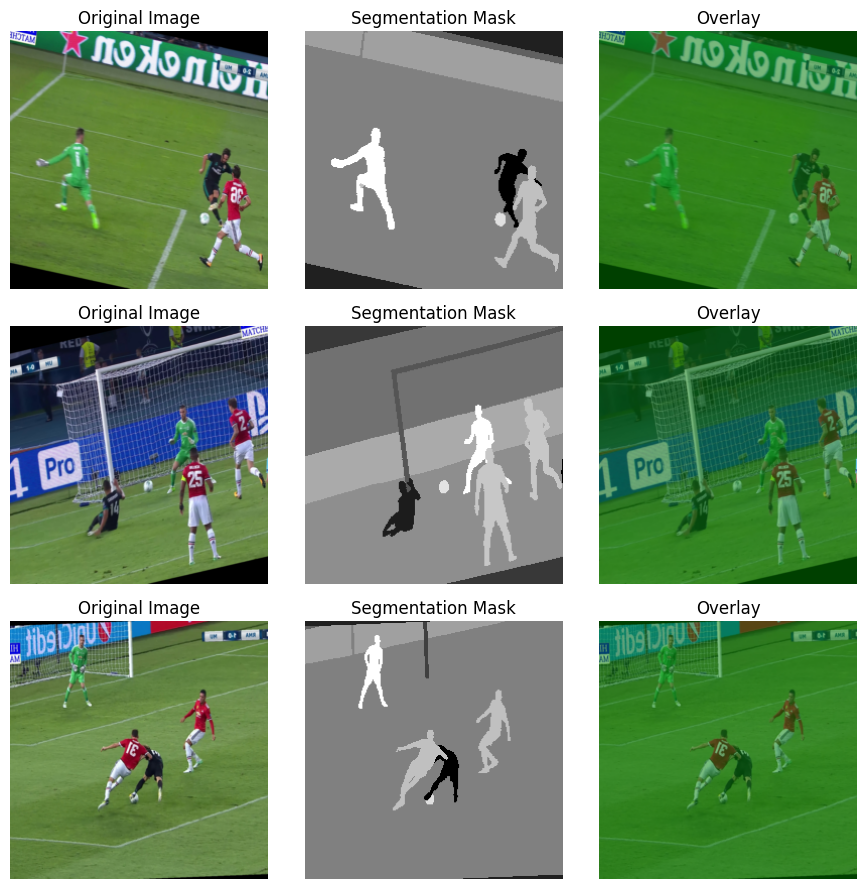

In [19]:
def visualize_samples(loader, num_samples=3):
    data_iter = iter(loader)
    imgs, masks = next(data_iter)  

    fig, axs = plt.subplots(num_samples, 3, figsize=(9, num_samples * 3))  # subplot of size (num_samples, 3) 

    for i in range(num_samples):
        img = imgs[i]
        mask = masks[i]

        # (tv_tensors.Images are usually normalized )
        img = F.to_dtype(img, torch.uint8, scale=True)

        # blur and  Boolean mask to make it visually 
        mask_overlay = draw_segmentation_masks(img, mask.unsqueeze(0).to(torch.bool), colors=["green"], alpha=0.5)

        # original image output 
        axs[i, 0].imshow(img.permute(1, 2, 0).numpy())
        axs[i, 0].set_title("Original Image")
        axs[i, 0].axis("off")

        # mask output (gray scle inversion )
        axs[i, 1].imshow(mask.numpy(), cmap="gray")
        axs[i, 1].set_title("Segmentation Mask")
        axs[i, 1].axis("off")

        #overlayed image output 
        axs[i, 2].imshow(mask_overlay.permute(1, 2, 0).numpy())  
        axs[i, 2].set_title("Overlay")
        axs[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

# check the application of training data 
visualize_samples(train_transformed_loader)

In [20]:
# take a sample dataset and check it 
for img, mask in train_transformed_loader:
    print(f"Image shape: {img.shape}")  
    print(f"Mask shape: {mask.shape}")  
    
  
    print(f"Image min: {img.min()}, max: {img.max()}")  # 0~1

    
    print(f"Unique mask values: {torch.unique(mask)}")  # 0~10

    break  

Image shape: torch.Size([5, 3, 256, 256])
Mask shape: torch.Size([5, 256, 256])
Image min: 0.0, max: 1.0
Unique mask values: tensor([1, 2, 3, 4, 5, 6, 7, 8, 9])


# 2.saving and loading models

In [21]:
# preference 
if "COLAB_GPU" in os.environ:
    model_dir = "/content/drive/My Drive/model_storage/"
elif os.path.exists("/kaggle"):
    model_dir = "/kaggle/working/model_storage/"
else:
    model_dir = "./model_storage"


os.makedirs(model_dir, exist_ok=True)
print(f"Now using Model Directory: {model_dir}")


#check model path 
def get_model_path(model_name):
    return os.path.join(model_dir, f"{model_name}.pth")



def save_model(model, model_name, optimizer, scheduler, epoch, best_metric):
    model_path = get_model_path(model_name)
    checkpoint = {
        "model": model.state_dict(),
        "optimizer": optimizer.state_dict(),
        "scheduler": scheduler.state_dict(),
        "epoch": epoch + 1,
        "best_metric": best_metric
    }
    torch.save(checkpoint, model_path)
    print(f"Checkpint Saved: {model_path}, Epoch: {epoch + 1}, Best Metric: {best_metric:.4f}")


# load model
def load_model(model, model_name, optimizer, scheduler):
    """
    return: model.to(device), epoch, best_metrich
    """
    model_path = get_model_path(model_name)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # if oyu dont have all the passes, start over 
    if not os.path.exists(model_path):
        print(f"No Checkpoint Found: {model_path}")
        return model.to(device), 0, float("inf")

    # load model
    checkpoint = torch.load(model_path, map_location=device, weights_only=True)

    model.load_state_dict(checkpoint["model"])
    epoch = checkpoint["epoch"]
    best_metric = checkpoint["best_metric"]
 
    if optimizer is not None:
        optimizer.load_state_dict(checkpoint["optimizer"])
    if scheduler is not None:
        scheduler.load_state_dict(checkpoint["scheduler"])

    print(f"Checkpoint Loaded: {model_path}, Epoch: {epoch}, Best Metric: {best_metric:.4f}")
    return model.to(device), epoch, best_metric



Now using Model Directory: /kaggle/working/model_storage/


# 3.Model training and evalution blocks

In [22]:
train_losses_per_model = {}
val_losses_per_model = {}

def train_model(model, model_name, trainloader, valloader, criterion, optimizer, scheduler, num_epochs):
    model.to(device)
    model, start_epoch, best_metric = load_model(model, model_name, optimizer, scheduler)

    print(f"Start with Epoch={start_epoch}, Best Metric={best_metric}")
    
    global train_losses_per_model, val_losses_per_model
    
    train_losses_per_model[model_name] = []
    val_losses_per_model[model_name] = []
    
    for epoch in range(start_epoch, num_epochs):
        # Training
        model.train()
        train_loss, train_dice =  0, 0
        train_bar = tqdm(trainloader, desc=f"Training {epoch+1}/{num_epochs}")
        for images, masks in train_bar:
            images, masks = images.to(device), masks.to(device)
            masks = torch.clamp(masks, min=0, max=10)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

          
            train_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            
            train_dice += compute_dice(preds, masks, num_classes=11)

            train_bar.set_postfix({"Loss": loss.item()})

        avg_train_loss = train_loss / len(trainloader)
        
        train_losses_per_model[model_name].append(avg_train_loss) 
        
        avg_train_dice = train_dice / len(trainloader)
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_train_loss:.4f},  Dice score: {avg_train_dice:.4f}")

        # Validation
        model.eval()
        val_loss, val_dice =  0, 0
        val_bar = tqdm(valloader, desc=f"Validation {epoch+1}/{num_epochs}")
        with torch.no_grad():
            for images, masks in val_bar:
                images, masks = images.to(device), masks.to(device)
                masks = torch.clamp(masks, min=0, max=10)

                outputs = model(images)
                loss = criterion(outputs, masks)

                val_loss += loss.item()
                preds = torch.argmax(outputs, dim=1)
                
                
                val_dice += compute_dice(preds, masks, num_classes=11)

                val_bar.set_postfix({"Loss": loss.item()})

        avg_val_loss = val_loss / len(valloader)
        val_losses_per_model[model_name].append(avg_val_loss)
        avg_val_dice = val_dice / len(valloader)
        print(f"Validation Loss: {avg_val_loss:.4f}, Dice score: {avg_val_dice:.4f}\n")

        # Scheduler step
        if scheduler is not None:
            current_lr = optimizer.param_groups[0]['lr']
            if isinstance(scheduler, optim.lr_scheduler.ReduceLROnPlateau):
                scheduler.step(avg_val_loss)
            else:
                scheduler.step()
            updated_lr = optimizer.param_groups[0]['lr']
            if updated_lr != current_lr:
                print(f"Learning Rate Updated: {current_lr:.6f} -> {updated_lr:.6f}")

        # Save model if validation loss improves
        if avg_val_loss < best_metric:
            print(f"Best Validation Metric Updated: {best_metric:.4f} -> {avg_val_loss:.4f}")
            best_metric = avg_val_loss
            save_model(model, model_name, optimizer, scheduler, epoch, best_metric)
    plot_loss_curves(model_name)
    return avg_train_loss,avg_train_dice, avg_val_loss, avg_val_dice

In [23]:

def evaluate_model(model, model_name, testloader, criterion):
   
    model, _, _ = load_model(model, model_name, None, None)
    model.eval()

    # Initialize metrics
    test_loss,test_dice =  0, 0
    test_bar = tqdm(testloader, desc="Testing")

    # Fixed colormap settings (same for GT & predicted masks)
    fixed_colors = list(mcolors.TABLEAU_COLORS.values())  # 10 color items "tab10"
    label_colors = {label: fixed_colors[i % len(fixed_colors)] for i, label in enumerate(range(11))}  # 0~10 classes
    cmap_fixed = mcolors.ListedColormap([label_colors[label] for label in sorted(label_colors.keys())])

    
    plt.figure(figsize=(15, 40))
    plot_index = 1

    with torch.no_grad():
        for images, masks in test_bar:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            loss = criterion(outputs, masks)

            # Compute metrics
            test_loss += loss.item()
            preds = torch.argmax(outputs, dim=1)
            
            test_dice += compute_dice(preds, masks, num_classes=11)
            # Update progress bar
            test_bar.set_postfix({"Loss": loss.item()})

            # Plotting
            pred_masks = preds.cpu().numpy()  # No need for softmax since argmax is used
            for b in range(images.size(0)):
                # Original Image
                plt.subplot(10, 3, plot_index)
                plt.imshow(images[b].cpu().permute(1, 2, 0).numpy())  # Ensure correct tensor shape
                plt.title("Original Image")
                plt.axis("off")
                plot_index += 1

                # Ground Truth Mask
                plt.subplot(10, 3, plot_index)
                plt.imshow(masks[b].cpu().numpy(), cmap=cmap_fixed, vmin=0, vmax=10)
                plt.title("Ground Truth Mask")
                plt.axis("off")
                plot_index += 1

                # Predicted Mask
                plt.subplot(10, 3, plot_index)
                plt.imshow(pred_masks[b], cmap=cmap_fixed, vmin=0, vmax=10)
                plt.title("Predicted Mask")
                plt.axis("off")
                plot_index += 1

                if plot_index > 10 * 3:  # Visualize up to 10 images
                    break
            if plot_index > 10 * 3:
                break

    # Compute average metrics
    avg_test_loss = test_loss / len(testloader)
   
    avg_test_dice = test_dice / len(testloader)

    # Print results
    print(f"Test Loss: {avg_test_loss:.4f}, Dice Score: {avg_test_dice:.4f}")

    # Display plots
    plt.tight_layout()
    plt.show()

In [24]:
def plot_loss_curves(model_name):
    """
    Plots training and validation loss curves after training a single model.
    """
    plt.figure(figsize=(8, 5))

    epochs = range(1, len(train_losses_per_model[model_name]) + 1)
    plt.plot(epochs, train_losses_per_model[model_name], label="Train Loss", marker="o")
    plt.plot(epochs, val_losses_per_model[model_name], label="Val Loss", marker="o", linestyle="dashed")

    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title(f"Loss Curve for {model_name}")
    plt.legend()
    plt.grid(True)
    plt.show()



## 3.1 Loss Function

1. Focal Loss
    - An improved version of  Cross Entropy Loss
    - introduced to solve class imbalance problem 
    - giving a greater weight to difficult samples than to easy samples encourage the model to learn more about difficult samples.
2. Dice Loss
    - Segmentation Loss,mainly used in imbalanced data 
    - maximize similarity between pixels in a similar way to IoU(Intersection over Union)
    - To better learn classes with small objects or a small number of pixels.

3. Hybrid Loss(Focal Loss + Dice Loss)
    - Let's combine the two losses in a 50:50 ratio induce balanced learning.

In [25]:
class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.ce_loss = nn.CrossEntropyLoss()

    def forward(self, inputs, targets):
        ce_loss = self.ce_loss(inputs, targets)
        pt = torch.exp(-ce_loss)
        focal_loss = self.alpha * (1 - pt) ** self.gamma * ce_loss
        return focal_loss.mean()


class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-6, num_classes=11):
        super(DiceLoss, self).__init__()
        self.smooth = smooth
        self.num_classes = num_classes  # set number of classes 

    def forward(self, inputs, targets):
        # Logits →probability transformation (softmax)
        inputs = torch.softmax(inputs, dim=1)

        # convert targets to One-Hot Encoding (batch_size, height, width) → (batch_size, num_classes, height, width)
        targets = torch.nn.functional.one_hot(targets, num_classes=self.num_classes).permute(0, 3, 1, 2).float()

        # Dice Loss calculations 
        intersection = (inputs * targets).sum(dim=(2, 3))  # intersection of each class 
        dice_score = (2. * intersection + self.smooth) / (inputs.sum(dim=(2, 3)) + targets.sum(dim=(2, 3)) + self.smooth)
        return 1 - dice_score.mean()  # convert Dice Score to  Loss


class HybridLoss(nn.Module):
    def __init__(self, alpha=0.5, num_classes=11):
        super(HybridLoss, self).__init__()
        self.focal = FocalLoss()
        self.dice = DiceLoss(num_classes=num_classes)
        self.alpha = alpha  # Focal Loss weight

    def forward(self, inputs, targets):
        return self.alpha * self.focal(inputs, targets) + (1 - self.alpha) * self.dice(inputs, targets)

In [26]:
def compute_dice(preds, masks, num_classes=11):
    dice_scores = []
    for c in range(num_classes):
        pred_c = (preds == c).float()  # Binary mask for class c in predictions
        mask_c = (masks == c).float()  # Binary mask for class c in ground truth
        intersection = (pred_c * mask_c).sum()
        union = pred_c.sum() + mask_c.sum() + 1e-6
        if union > 1e-6:  # Skip if no pixels for this class
            dice = 2 * intersection / union
            dice_scores.append(dice)
    return torch.tensor(dice_scores).mean().item() if dice_scores else 0.0

# 4.Models

## 4.1. Baseline UNet

In [27]:
# Define U-Net model  ( added BatchNorm )
class UNet(nn.Module):
    def __init__(self, num_classes=11):
        super(UNet, self).__init__()

        def conv_block(in_channels, out_channels):
            return nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),  # BatchNorm added 
                nn.ReLU(inplace=True),
                nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),  # BatchNorm added 
                nn.ReLU(inplace=True),
            )

        self.encoder1 = conv_block(3, 64)
        self.encoder2 = conv_block(64, 128)
        self.encoder3 = conv_block(128, 256)
        self.encoder4 = conv_block(256, 512)

        self.pool = nn.MaxPool2d(2, 2)

        self.bottleneck = conv_block(512, 1024)

        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.decoder4 = conv_block(1024, 512)

        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.decoder3 = conv_block(512, 256)

        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.decoder2 = conv_block(256, 128)

        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.decoder1 = conv_block(128, 64)

        self.final_conv = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x):
        # encoding 
        e1 = self.encoder1(x)               # (batch, 64, H, W)
        e2 = self.encoder2(self.pool(e1))   # (batch, 128, H/2, W/2)
        e3 = self.encoder3(self.pool(e2))   # (batch, 256, H/4, W/4)
        e4 = self.encoder4(self.pool(e3))   # (batch, 512, H/8, W/8)

        # bottleneck 
        b = self.bottleneck(self.pool(e4))  # (batch, 1024, H/16, W/16)

        # decoding 
        d4 = self.upconv4(b)                # (batch, 512, H/8, W/8)
        d4 = torch.cat((d4, e4), dim=1)     # (batch, 1024, H/8, W/8)
        d4 = self.decoder4(d4)              # (batch, 512, H/8, W/8)

        d3 = self.upconv3(d4)               # (batch, 256, H/4, W/4)
        d3 = torch.cat((d3, e3), dim=1)     # (batch, 512, H/4, W/4)
        d3 = self.decoder3(d3)              # (batch, 256, H/4, W/4)

        d2 = self.upconv2(d3)               # (batch, 128, H/2, W/2)
        d2 = torch.cat((d2, e2), dim=1)     # (batch, 256, H/2, W/2)
        d2 = self.decoder2(d2)              # (batch, 128, H/2, W/2)

        d1 = self.upconv1(d2)               # (batch, 64, H, W)
        d1 = torch.cat((d1, e1), dim=1)     # (batch, 128, H, W)
        d1 = self.decoder1(d1)              # (batch, 64, H, W)

        return self.final_conv(d1)          # (batch, num_classes, H, W)

No Checkpoint Found: /kaggle/working/model_storage/Baseline_UNet.pth
Start with Epoch=0, Best Metric=inf


Training 1/100: 100%|██████████| 16/16 [00:07<00:00,  2.17it/s, Loss=0.456]


Epoch [1/100], Loss: 0.5318,  Dice score: 0.2451


Validation 1/100: 100%|██████████| 2/2 [00:00<00:00,  3.33it/s, Loss=0.55]


Validation Loss: 0.5702, Dice score: 0.1501

Learning Rate Updated: 0.001000 -> 0.001000
Best Validation Metric Updated: inf -> 0.5702
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 1, Best Metric: 0.5702


Training 2/100: 100%|██████████| 16/16 [00:06<00:00,  2.56it/s, Loss=0.398]


Epoch [2/100], Loss: 0.4392,  Dice score: 0.3296


Validation 2/100: 100%|██████████| 2/2 [00:00<00:00,  3.31it/s, Loss=0.419]


Validation Loss: 0.4347, Dice score: 0.2808

Learning Rate Updated: 0.001000 -> 0.000999
Best Validation Metric Updated: 0.5702 -> 0.4347
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 2, Best Metric: 0.4347


Training 3/100: 100%|██████████| 16/16 [00:06<00:00,  2.53it/s, Loss=0.372]


Epoch [3/100], Loss: 0.4080,  Dice score: 0.3800


Validation 3/100: 100%|██████████| 2/2 [00:00<00:00,  3.31it/s, Loss=0.386]


Validation Loss: 0.4042, Dice score: 0.3306

Learning Rate Updated: 0.000999 -> 0.000998
Best Validation Metric Updated: 0.4347 -> 0.4042
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 3, Best Metric: 0.4042


Training 4/100: 100%|██████████| 16/16 [00:06<00:00,  2.52it/s, Loss=0.365]


Epoch [4/100], Loss: 0.3753,  Dice score: 0.4309


Validation 4/100: 100%|██████████| 2/2 [00:00<00:00,  3.26it/s, Loss=0.387]


Validation Loss: 0.4060, Dice score: 0.3585

Learning Rate Updated: 0.000998 -> 0.000996


Training 5/100: 100%|██████████| 16/16 [00:06<00:00,  2.49it/s, Loss=0.36]


Epoch [5/100], Loss: 0.3662,  Dice score: 0.4480


Validation 5/100: 100%|██████████| 2/2 [00:00<00:00,  3.39it/s, Loss=0.363]


Validation Loss: 0.3802, Dice score: 0.3913

Learning Rate Updated: 0.000996 -> 0.000994
Best Validation Metric Updated: 0.4042 -> 0.3802
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 5, Best Metric: 0.3802


Training 6/100: 100%|██████████| 16/16 [00:06<00:00,  2.55it/s, Loss=0.357]


Epoch [6/100], Loss: 0.3520,  Dice score: 0.4908


Validation 6/100: 100%|██████████| 2/2 [00:00<00:00,  3.23it/s, Loss=0.372]


Validation Loss: 0.3748, Dice score: 0.4172

Learning Rate Updated: 0.000994 -> 0.000991
Best Validation Metric Updated: 0.3802 -> 0.3748
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 6, Best Metric: 0.3748


Training 7/100: 100%|██████████| 16/16 [00:06<00:00,  2.55it/s, Loss=0.359]


Epoch [7/100], Loss: 0.3422,  Dice score: 0.5068


Validation 7/100: 100%|██████████| 2/2 [00:00<00:00,  3.42it/s, Loss=0.351]


Validation Loss: 0.3619, Dice score: 0.4584

Learning Rate Updated: 0.000991 -> 0.000988
Best Validation Metric Updated: 0.3748 -> 0.3619
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 7, Best Metric: 0.3619


Training 8/100: 100%|██████████| 16/16 [00:06<00:00,  2.54it/s, Loss=0.321]


Epoch [8/100], Loss: 0.3282,  Dice score: 0.5574


Validation 8/100: 100%|██████████| 2/2 [00:00<00:00,  3.31it/s, Loss=0.409]


Validation Loss: 0.4230, Dice score: 0.4270

Learning Rate Updated: 0.000988 -> 0.000984


Training 9/100: 100%|██████████| 16/16 [00:06<00:00,  2.52it/s, Loss=0.299]


Epoch [9/100], Loss: 0.3138,  Dice score: 0.5718


Validation 9/100: 100%|██████████| 2/2 [00:00<00:00,  3.45it/s, Loss=0.298]


Validation Loss: 0.2997, Dice score: 0.5541

Learning Rate Updated: 0.000984 -> 0.000980
Best Validation Metric Updated: 0.3619 -> 0.2997
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 9, Best Metric: 0.2997


Training 10/100: 100%|██████████| 16/16 [00:06<00:00,  2.59it/s, Loss=0.3]


Epoch [10/100], Loss: 0.3145,  Dice score: 0.5683


Validation 10/100: 100%|██████████| 2/2 [00:00<00:00,  3.46it/s, Loss=0.325]


Validation Loss: 0.3253, Dice score: 0.5523

Learning Rate Updated: 0.000980 -> 0.000976


Training 11/100: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s, Loss=0.291]


Epoch [11/100], Loss: 0.2960,  Dice score: 0.6073


Validation 11/100: 100%|██████████| 2/2 [00:00<00:00,  3.44it/s, Loss=0.283]


Validation Loss: 0.2891, Dice score: 0.6251

Learning Rate Updated: 0.000976 -> 0.000970
Best Validation Metric Updated: 0.2997 -> 0.2891
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 11, Best Metric: 0.2891


Training 12/100: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s, Loss=0.265]


Epoch [12/100], Loss: 0.2903,  Dice score: 0.6152


Validation 12/100: 100%|██████████| 2/2 [00:00<00:00,  3.38it/s, Loss=0.269]


Validation Loss: 0.2775, Dice score: 0.6348

Learning Rate Updated: 0.000970 -> 0.000965
Best Validation Metric Updated: 0.2891 -> 0.2775
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 12, Best Metric: 0.2775


Training 13/100: 100%|██████████| 16/16 [00:06<00:00,  2.56it/s, Loss=0.278]


Epoch [13/100], Loss: 0.2897,  Dice score: 0.6346


Validation 13/100: 100%|██████████| 2/2 [00:00<00:00,  3.48it/s, Loss=0.28]


Validation Loss: 0.2970, Dice score: 0.6066

Learning Rate Updated: 0.000965 -> 0.000959


Training 14/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.259]


Epoch [14/100], Loss: 0.2924,  Dice score: 0.6148


Validation 14/100: 100%|██████████| 2/2 [00:00<00:00,  3.45it/s, Loss=0.276]


Validation Loss: 0.2883, Dice score: 0.5974

Learning Rate Updated: 0.000959 -> 0.000952


Training 15/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.269]


Epoch [15/100], Loss: 0.2800,  Dice score: 0.6317


Validation 15/100: 100%|██████████| 2/2 [00:00<00:00,  3.55it/s, Loss=0.286]


Validation Loss: 0.2869, Dice score: 0.6211

Learning Rate Updated: 0.000952 -> 0.000946


Training 16/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.281]


Epoch [16/100], Loss: 0.2696,  Dice score: 0.6721


Validation 16/100: 100%|██████████| 2/2 [00:00<00:00,  3.52it/s, Loss=0.255]


Validation Loss: 0.2645, Dice score: 0.6677

Learning Rate Updated: 0.000946 -> 0.000938
Best Validation Metric Updated: 0.2775 -> 0.2645
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 16, Best Metric: 0.2645


Training 17/100: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s, Loss=0.268]


Epoch [17/100], Loss: 0.2731,  Dice score: 0.6662


Validation 17/100: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s, Loss=0.251]


Validation Loss: 0.2585, Dice score: 0.6709

Learning Rate Updated: 0.000938 -> 0.000930
Best Validation Metric Updated: 0.2645 -> 0.2585
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 17, Best Metric: 0.2585


Training 18/100: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s, Loss=0.269]


Epoch [18/100], Loss: 0.2713,  Dice score: 0.6430


Validation 18/100: 100%|██████████| 2/2 [00:00<00:00,  3.46it/s, Loss=0.26]


Validation Loss: 0.2702, Dice score: 0.6293

Learning Rate Updated: 0.000930 -> 0.000922


Training 19/100: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s, Loss=0.273]


Epoch [19/100], Loss: 0.2733,  Dice score: 0.6401


Validation 19/100: 100%|██████████| 2/2 [00:00<00:00,  3.46it/s, Loss=0.284]


Validation Loss: 0.2913, Dice score: 0.5959

Learning Rate Updated: 0.000922 -> 0.000914


Training 20/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.267]


Epoch [20/100], Loss: 0.2636,  Dice score: 0.6712


Validation 20/100: 100%|██████████| 2/2 [00:00<00:00,  3.50it/s, Loss=0.252]


Validation Loss: 0.2611, Dice score: 0.6514

Learning Rate Updated: 0.000914 -> 0.000905


Training 21/100: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s, Loss=0.259]


Epoch [21/100], Loss: 0.2694,  Dice score: 0.6704


Validation 21/100: 100%|██████████| 2/2 [00:00<00:00,  3.47it/s, Loss=0.253]


Validation Loss: 0.2660, Dice score: 0.6588

Learning Rate Updated: 0.000905 -> 0.000895


Training 22/100: 100%|██████████| 16/16 [00:06<00:00,  2.56it/s, Loss=0.278]


Epoch [22/100], Loss: 0.2646,  Dice score: 0.6709


Validation 22/100: 100%|██████████| 2/2 [00:00<00:00,  3.47it/s, Loss=0.24]


Validation Loss: 0.2532, Dice score: 0.6721

Learning Rate Updated: 0.000895 -> 0.000885
Best Validation Metric Updated: 0.2585 -> 0.2532
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 22, Best Metric: 0.2532


Training 23/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.285]


Epoch [23/100], Loss: 0.2561,  Dice score: 0.6865


Validation 23/100: 100%|██████████| 2/2 [00:00<00:00,  3.45it/s, Loss=0.243]


Validation Loss: 0.2571, Dice score: 0.6835

Learning Rate Updated: 0.000885 -> 0.000875


Training 24/100: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s, Loss=0.303]


Epoch [24/100], Loss: 0.2534,  Dice score: 0.7036


Validation 24/100: 100%|██████████| 2/2 [00:00<00:00,  3.51it/s, Loss=0.239]


Validation Loss: 0.2505, Dice score: 0.6906

Learning Rate Updated: 0.000875 -> 0.000865
Best Validation Metric Updated: 0.2532 -> 0.2505
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 24, Best Metric: 0.2505


Training 25/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.233]


Epoch [25/100], Loss: 0.2518,  Dice score: 0.7057


Validation 25/100: 100%|██████████| 2/2 [00:00<00:00,  3.51it/s, Loss=0.233]


Validation Loss: 0.2410, Dice score: 0.7283

Learning Rate Updated: 0.000865 -> 0.000854
Best Validation Metric Updated: 0.2505 -> 0.2410
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 25, Best Metric: 0.2410


Training 26/100: 100%|██████████| 16/16 [00:06<00:00,  2.59it/s, Loss=0.263]


Epoch [26/100], Loss: 0.2437,  Dice score: 0.7460


Validation 26/100: 100%|██████████| 2/2 [00:00<00:00,  3.35it/s, Loss=0.225]


Validation Loss: 0.2377, Dice score: 0.7350

Learning Rate Updated: 0.000854 -> 0.000842
Best Validation Metric Updated: 0.2410 -> 0.2377
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 26, Best Metric: 0.2377


Training 27/100: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s, Loss=0.255]


Epoch [27/100], Loss: 0.2469,  Dice score: 0.7305


Validation 27/100: 100%|██████████| 2/2 [00:00<00:00,  3.34it/s, Loss=0.232]


Validation Loss: 0.2419, Dice score: 0.7244

Learning Rate Updated: 0.000842 -> 0.000831


Training 28/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.22]


Epoch [28/100], Loss: 0.2575,  Dice score: 0.6897


Validation 28/100: 100%|██████████| 2/2 [00:00<00:00,  3.47it/s, Loss=0.248]


Validation Loss: 0.2660, Dice score: 0.6802

Learning Rate Updated: 0.000831 -> 0.000819


Training 29/100: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s, Loss=0.244]


Epoch [29/100], Loss: 0.2478,  Dice score: 0.7358


Validation 29/100: 100%|██████████| 2/2 [00:00<00:00,  3.56it/s, Loss=0.245]


Validation Loss: 0.2513, Dice score: 0.6962

Learning Rate Updated: 0.000819 -> 0.000807


Training 30/100: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s, Loss=0.234]


Epoch [30/100], Loss: 0.2431,  Dice score: 0.7269


Validation 30/100: 100%|██████████| 2/2 [00:00<00:00,  3.45it/s, Loss=0.217]


Validation Loss: 0.2272, Dice score: 0.7379

Learning Rate Updated: 0.000807 -> 0.000794
Best Validation Metric Updated: 0.2377 -> 0.2272
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 30, Best Metric: 0.2272


Training 31/100: 100%|██████████| 16/16 [00:06<00:00,  2.56it/s, Loss=0.215]


Epoch [31/100], Loss: 0.2380,  Dice score: 0.7438


Validation 31/100: 100%|██████████| 2/2 [00:00<00:00,  3.39it/s, Loss=0.236]


Validation Loss: 0.2440, Dice score: 0.7089

Learning Rate Updated: 0.000794 -> 0.000781


Training 32/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.228]


Epoch [32/100], Loss: 0.2403,  Dice score: 0.7527


Validation 32/100: 100%|██████████| 2/2 [00:00<00:00,  3.57it/s, Loss=0.256]


Validation Loss: 0.2758, Dice score: 0.6489

Learning Rate Updated: 0.000781 -> 0.000768


Training 33/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.258]


Epoch [33/100], Loss: 0.2358,  Dice score: 0.7526


Validation 33/100: 100%|██████████| 2/2 [00:00<00:00,  3.54it/s, Loss=0.22]


Validation Loss: 0.2340, Dice score: 0.7420

Learning Rate Updated: 0.000768 -> 0.000755


Training 34/100: 100%|██████████| 16/16 [00:06<00:00,  2.57it/s, Loss=0.264]


Epoch [34/100], Loss: 0.2299,  Dice score: 0.7610


Validation 34/100: 100%|██████████| 2/2 [00:00<00:00,  3.47it/s, Loss=0.213]


Validation Loss: 0.2272, Dice score: 0.7421

Learning Rate Updated: 0.000755 -> 0.000741


Training 35/100: 100%|██████████| 16/16 [00:06<00:00,  2.58it/s, Loss=0.239]


Epoch [35/100], Loss: 0.2302,  Dice score: 0.7753


Validation 35/100: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s, Loss=0.208]


Validation Loss: 0.2195, Dice score: 0.7778

Learning Rate Updated: 0.000741 -> 0.000727
Best Validation Metric Updated: 0.2272 -> 0.2195
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 35, Best Metric: 0.2195


Training 36/100: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s, Loss=0.166]


Epoch [36/100], Loss: 0.2275,  Dice score: 0.7626


Validation 36/100: 100%|██████████| 2/2 [00:00<00:00,  3.48it/s, Loss=0.207]


Validation Loss: 0.2152, Dice score: 0.7910

Learning Rate Updated: 0.000727 -> 0.000713
Best Validation Metric Updated: 0.2195 -> 0.2152
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 36, Best Metric: 0.2152


Training 37/100: 100%|██████████| 16/16 [00:06<00:00,  2.59it/s, Loss=0.246]


Epoch [37/100], Loss: 0.2242,  Dice score: 0.7892


Validation 37/100: 100%|██████████| 2/2 [00:00<00:00,  3.44it/s, Loss=0.248]


Validation Loss: 0.2606, Dice score: 0.6863

Learning Rate Updated: 0.000713 -> 0.000699


Training 38/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.225]


Epoch [38/100], Loss: 0.2256,  Dice score: 0.7867


Validation 38/100: 100%|██████████| 2/2 [00:00<00:00,  3.50it/s, Loss=0.214]


Validation Loss: 0.2239, Dice score: 0.7802

Learning Rate Updated: 0.000699 -> 0.000684


Training 39/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.224]


Epoch [39/100], Loss: 0.2215,  Dice score: 0.7999


Validation 39/100: 100%|██████████| 2/2 [00:00<00:00,  3.45it/s, Loss=0.21]


Validation Loss: 0.2201, Dice score: 0.7832

Learning Rate Updated: 0.000684 -> 0.000670


Training 40/100: 100%|██████████| 16/16 [00:06<00:00,  2.58it/s, Loss=0.295]


Epoch [40/100], Loss: 0.2354,  Dice score: 0.7519


Validation 40/100: 100%|██████████| 2/2 [00:00<00:00,  3.48it/s, Loss=0.323]


Validation Loss: 0.3335, Dice score: 0.5931

Learning Rate Updated: 0.000670 -> 0.000655


Training 41/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.207]


Epoch [41/100], Loss: 0.2385,  Dice score: 0.7624


Validation 41/100: 100%|██████████| 2/2 [00:00<00:00,  3.42it/s, Loss=0.238]


Validation Loss: 0.2454, Dice score: 0.7308

Learning Rate Updated: 0.000655 -> 0.000640


Training 42/100: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s, Loss=0.209]


Epoch [42/100], Loss: 0.2333,  Dice score: 0.7551


Validation 42/100: 100%|██████████| 2/2 [00:00<00:00,  3.26it/s, Loss=0.218]


Validation Loss: 0.2280, Dice score: 0.7430

Learning Rate Updated: 0.000640 -> 0.000625


Training 43/100: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s, Loss=0.225]


Epoch [43/100], Loss: 0.2350,  Dice score: 0.7550


Validation 43/100: 100%|██████████| 2/2 [00:00<00:00,  3.38it/s, Loss=0.213]


Validation Loss: 0.2243, Dice score: 0.7726

Learning Rate Updated: 0.000625 -> 0.000609


Training 44/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.217]


Epoch [44/100], Loss: 0.2249,  Dice score: 0.7795


Validation 44/100: 100%|██████████| 2/2 [00:00<00:00,  3.33it/s, Loss=0.21]


Validation Loss: 0.2201, Dice score: 0.7864

Learning Rate Updated: 0.000609 -> 0.000594


Training 45/100: 100%|██████████| 16/16 [00:06<00:00,  2.56it/s, Loss=0.201]


Epoch [45/100], Loss: 0.2207,  Dice score: 0.8015


Validation 45/100: 100%|██████████| 2/2 [00:00<00:00,  3.50it/s, Loss=0.204]


Validation Loss: 0.2140, Dice score: 0.7961

Learning Rate Updated: 0.000594 -> 0.000579
Best Validation Metric Updated: 0.2152 -> 0.2140
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 45, Best Metric: 0.2140


Training 46/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.208]


Epoch [46/100], Loss: 0.2168,  Dice score: 0.8106


Validation 46/100: 100%|██████████| 2/2 [00:00<00:00,  3.51it/s, Loss=0.207]


Validation Loss: 0.2159, Dice score: 0.7968

Learning Rate Updated: 0.000579 -> 0.000563


Training 47/100: 100%|██████████| 16/16 [00:06<00:00,  2.59it/s, Loss=0.247]


Epoch [47/100], Loss: 0.2174,  Dice score: 0.8191


Validation 47/100: 100%|██████████| 2/2 [00:00<00:00,  3.49it/s, Loss=0.201]


Validation Loss: 0.2118, Dice score: 0.8090

Learning Rate Updated: 0.000563 -> 0.000548
Best Validation Metric Updated: 0.2140 -> 0.2118
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 47, Best Metric: 0.2118


Training 48/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.2]


Epoch [48/100], Loss: 0.2160,  Dice score: 0.8023


Validation 48/100: 100%|██████████| 2/2 [00:00<00:00,  3.49it/s, Loss=0.202]


Validation Loss: 0.2117, Dice score: 0.8019

Learning Rate Updated: 0.000548 -> 0.000532
Best Validation Metric Updated: 0.2118 -> 0.2117
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 48, Best Metric: 0.2117


Training 49/100: 100%|██████████| 16/16 [00:06<00:00,  2.57it/s, Loss=0.17]


Epoch [49/100], Loss: 0.2159,  Dice score: 0.8104


Validation 49/100: 100%|██████████| 2/2 [00:00<00:00,  3.55it/s, Loss=0.2]


Validation Loss: 0.2104, Dice score: 0.8044

Learning Rate Updated: 0.000532 -> 0.000516
Best Validation Metric Updated: 0.2117 -> 0.2104
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 49, Best Metric: 0.2104


Training 50/100: 100%|██████████| 16/16 [00:06<00:00,  2.57it/s, Loss=0.195]


Epoch [50/100], Loss: 0.2143,  Dice score: 0.8318


Validation 50/100: 100%|██████████| 2/2 [00:00<00:00,  3.49it/s, Loss=0.205]


Validation Loss: 0.2186, Dice score: 0.7758

Learning Rate Updated: 0.000516 -> 0.000501


Training 51/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.228]


Epoch [51/100], Loss: 0.2168,  Dice score: 0.8099


Validation 51/100: 100%|██████████| 2/2 [00:00<00:00,  3.45it/s, Loss=0.218]


Validation Loss: 0.2343, Dice score: 0.7532

Learning Rate Updated: 0.000501 -> 0.000485


Training 52/100: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s, Loss=0.251]


Epoch [52/100], Loss: 0.2165,  Dice score: 0.7841


Validation 52/100: 100%|██████████| 2/2 [00:00<00:00,  3.49it/s, Loss=0.207]


Validation Loss: 0.2166, Dice score: 0.7991

Learning Rate Updated: 0.000485 -> 0.000469


Training 53/100: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s, Loss=0.239]


Epoch [53/100], Loss: 0.2162,  Dice score: 0.8033


Validation 53/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.205]


Validation Loss: 0.2166, Dice score: 0.7897

Learning Rate Updated: 0.000469 -> 0.000453


Training 54/100: 100%|██████████| 16/16 [00:06<00:00,  2.59it/s, Loss=0.196]


Epoch [54/100], Loss: 0.2161,  Dice score: 0.8069


Validation 54/100: 100%|██████████| 2/2 [00:00<00:00,  3.38it/s, Loss=0.212]


Validation Loss: 0.2247, Dice score: 0.7785

Learning Rate Updated: 0.000453 -> 0.000438


Training 55/100: 100%|██████████| 16/16 [00:06<00:00,  2.64it/s, Loss=0.204]


Epoch [55/100], Loss: 0.2141,  Dice score: 0.8218


Validation 55/100: 100%|██████████| 2/2 [00:00<00:00,  3.26it/s, Loss=0.2]


Validation Loss: 0.2119, Dice score: 0.8026

Learning Rate Updated: 0.000438 -> 0.000422


Training 56/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.236]


Epoch [56/100], Loss: 0.2119,  Dice score: 0.8203


Validation 56/100: 100%|██████████| 2/2 [00:00<00:00,  3.48it/s, Loss=0.201]


Validation Loss: 0.2123, Dice score: 0.7990

Learning Rate Updated: 0.000422 -> 0.000407


Training 57/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.2]


Epoch [57/100], Loss: 0.2100,  Dice score: 0.8201


Validation 57/100: 100%|██████████| 2/2 [00:00<00:00,  3.38it/s, Loss=0.196]


Validation Loss: 0.2069, Dice score: 0.8256

Learning Rate Updated: 0.000407 -> 0.000392
Best Validation Metric Updated: 0.2104 -> 0.2069
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 57, Best Metric: 0.2069


Training 58/100: 100%|██████████| 16/16 [00:06<00:00,  2.55it/s, Loss=0.21]


Epoch [58/100], Loss: 0.2087,  Dice score: 0.8475


Validation 58/100: 100%|██████████| 2/2 [00:00<00:00,  3.37it/s, Loss=0.195]


Validation Loss: 0.2045, Dice score: 0.8202

Learning Rate Updated: 0.000392 -> 0.000376
Best Validation Metric Updated: 0.2069 -> 0.2045
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 58, Best Metric: 0.2045


Training 59/100: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s, Loss=0.212]


Epoch [59/100], Loss: 0.2084,  Dice score: 0.8380


Validation 59/100: 100%|██████████| 2/2 [00:00<00:00,  3.42it/s, Loss=0.193]


Validation Loss: 0.2043, Dice score: 0.8292

Learning Rate Updated: 0.000376 -> 0.000361
Best Validation Metric Updated: 0.2045 -> 0.2043
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 59, Best Metric: 0.2043


Training 60/100: 100%|██████████| 16/16 [00:06<00:00,  2.56it/s, Loss=0.169]


Epoch [60/100], Loss: 0.2070,  Dice score: 0.8472


Validation 60/100: 100%|██████████| 2/2 [00:00<00:00,  3.51it/s, Loss=0.193]


Validation Loss: 0.2029, Dice score: 0.8372

Learning Rate Updated: 0.000361 -> 0.000346
Best Validation Metric Updated: 0.2043 -> 0.2029
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 60, Best Metric: 0.2029


Training 61/100: 100%|██████████| 16/16 [00:06<00:00,  2.58it/s, Loss=0.197]


Epoch [61/100], Loss: 0.2077,  Dice score: 0.8436


Validation 61/100: 100%|██████████| 2/2 [00:00<00:00,  3.49it/s, Loss=0.192]


Validation Loss: 0.2032, Dice score: 0.8253

Learning Rate Updated: 0.000346 -> 0.000331


Training 62/100: 100%|██████████| 16/16 [00:06<00:00,  2.57it/s, Loss=0.211]


Epoch [62/100], Loss: 0.2073,  Dice score: 0.8407


Validation 62/100: 100%|██████████| 2/2 [00:00<00:00,  3.31it/s, Loss=0.192]


Validation Loss: 0.2035, Dice score: 0.8318

Learning Rate Updated: 0.000331 -> 0.000317


Training 63/100: 100%|██████████| 16/16 [00:06<00:00,  2.63it/s, Loss=0.233]


Epoch [63/100], Loss: 0.2058,  Dice score: 0.8558


Validation 63/100: 100%|██████████| 2/2 [00:00<00:00,  3.50it/s, Loss=0.193]


Validation Loss: 0.2031, Dice score: 0.8382

Learning Rate Updated: 0.000317 -> 0.000302


Training 64/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.201]


Epoch [64/100], Loss: 0.2063,  Dice score: 0.8549


Validation 64/100: 100%|██████████| 2/2 [00:00<00:00,  3.50it/s, Loss=0.192]


Validation Loss: 0.2028, Dice score: 0.8387

Learning Rate Updated: 0.000302 -> 0.000288
Best Validation Metric Updated: 0.2029 -> 0.2028
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 64, Best Metric: 0.2028


Training 65/100: 100%|██████████| 16/16 [00:06<00:00,  2.62it/s, Loss=0.184]


Epoch [65/100], Loss: 0.2049,  Dice score: 0.8454


Validation 65/100: 100%|██████████| 2/2 [00:00<00:00,  3.48it/s, Loss=0.191]


Validation Loss: 0.2015, Dice score: 0.8396

Learning Rate Updated: 0.000288 -> 0.000274
Best Validation Metric Updated: 0.2028 -> 0.2015
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 65, Best Metric: 0.2015


Training 66/100: 100%|██████████| 16/16 [00:06<00:00,  2.64it/s, Loss=0.235]


Epoch [66/100], Loss: 0.2058,  Dice score: 0.8287


Validation 66/100: 100%|██████████| 2/2 [00:00<00:00,  3.34it/s, Loss=0.193]


Validation Loss: 0.2022, Dice score: 0.8410

Learning Rate Updated: 0.000274 -> 0.000260


Training 67/100: 100%|██████████| 16/16 [00:06<00:00,  2.54it/s, Loss=0.16]


Epoch [67/100], Loss: 0.2045,  Dice score: 0.8295


Validation 67/100: 100%|██████████| 2/2 [00:00<00:00,  3.47it/s, Loss=0.189]


Validation Loss: 0.2010, Dice score: 0.8360

Learning Rate Updated: 0.000260 -> 0.000246
Best Validation Metric Updated: 0.2015 -> 0.2010
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 67, Best Metric: 0.2010


Training 68/100: 100%|██████████| 16/16 [00:06<00:00,  2.60it/s, Loss=0.159]


Epoch [68/100], Loss: 0.2028,  Dice score: 0.8554


Validation 68/100: 100%|██████████| 2/2 [00:00<00:00,  3.47it/s, Loss=0.19]


Validation Loss: 0.2007, Dice score: 0.8444

Learning Rate Updated: 0.000246 -> 0.000233
Best Validation Metric Updated: 0.2010 -> 0.2007
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 68, Best Metric: 0.2007


Training 69/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.197]


Epoch [69/100], Loss: 0.2036,  Dice score: 0.8404


Validation 69/100: 100%|██████████| 2/2 [00:00<00:00,  3.47it/s, Loss=0.19]


Validation Loss: 0.2023, Dice score: 0.8362

Learning Rate Updated: 0.000233 -> 0.000220


Training 70/100: 100%|██████████| 16/16 [00:06<00:00,  2.61it/s, Loss=0.187]


Epoch [70/100], Loss: 0.2033,  Dice score: 0.8546


Validation 70/100: 100%|██████████| 2/2 [00:00<00:00,  3.45it/s, Loss=0.188]


Validation Loss: 0.1997, Dice score: 0.8424

Learning Rate Updated: 0.000220 -> 0.000207
Best Validation Metric Updated: 0.2007 -> 0.1997
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 70, Best Metric: 0.1997


Training 71/100: 100%|██████████| 16/16 [00:06<00:00,  2.58it/s, Loss=0.155]


Epoch [71/100], Loss: 0.2021,  Dice score: 0.8613


Validation 71/100: 100%|██████████| 2/2 [00:00<00:00,  3.48it/s, Loss=0.19]


Validation Loss: 0.1998, Dice score: 0.8445

Learning Rate Updated: 0.000207 -> 0.000194


Training 72/100: 100%|██████████| 16/16 [00:06<00:00,  2.57it/s, Loss=0.186]


Epoch [72/100], Loss: 0.2018,  Dice score: 0.8736


Validation 72/100: 100%|██████████| 2/2 [00:00<00:00,  3.40it/s, Loss=0.19]


Validation Loss: 0.2007, Dice score: 0.8365

Learning Rate Updated: 0.000194 -> 0.000182


Training 73/100: 100%|██████████| 16/16 [00:06<00:00,  2.53it/s, Loss=0.207]


Epoch [73/100], Loss: 0.2013,  Dice score: 0.8729


Validation 73/100: 100%|██████████| 2/2 [00:00<00:00,  3.40it/s, Loss=0.188]


Validation Loss: 0.1989, Dice score: 0.8411

Learning Rate Updated: 0.000182 -> 0.000170
Best Validation Metric Updated: 0.1997 -> 0.1989
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 73, Best Metric: 0.1989


Training 74/100: 100%|██████████| 16/16 [00:06<00:00,  2.53it/s, Loss=0.192]


Epoch [74/100], Loss: 0.2026,  Dice score: 0.8418


Validation 74/100: 100%|██████████| 2/2 [00:00<00:00,  3.43it/s, Loss=0.188]


Validation Loss: 0.1994, Dice score: 0.8457

Learning Rate Updated: 0.000170 -> 0.000159


Training 75/100: 100%|██████████| 16/16 [00:06<00:00,  2.51it/s, Loss=0.193]


Epoch [75/100], Loss: 0.2019,  Dice score: 0.8647


Validation 75/100: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s, Loss=0.19]


Validation Loss: 0.2003, Dice score: 0.8349

Learning Rate Updated: 0.000159 -> 0.000147


Training 76/100: 100%|██████████| 16/16 [00:06<00:00,  2.51it/s, Loss=0.193]


Epoch [76/100], Loss: 0.2012,  Dice score: 0.8783


Validation 76/100: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s, Loss=0.189]


Validation Loss: 0.1989, Dice score: 0.8471

Learning Rate Updated: 0.000147 -> 0.000136
Best Validation Metric Updated: 0.1989 -> 0.1989
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 76, Best Metric: 0.1989


Training 77/100: 100%|██████████| 16/16 [00:06<00:00,  2.51it/s, Loss=0.241]


Epoch [77/100], Loss: 0.1996,  Dice score: 0.8816


Validation 77/100: 100%|██████████| 2/2 [00:00<00:00,  3.31it/s, Loss=0.188]


Validation Loss: 0.1984, Dice score: 0.8510

Learning Rate Updated: 0.000136 -> 0.000126
Best Validation Metric Updated: 0.1989 -> 0.1984
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 77, Best Metric: 0.1984


Training 78/100: 100%|██████████| 16/16 [00:06<00:00,  2.55it/s, Loss=0.215]


Epoch [78/100], Loss: 0.1992,  Dice score: 0.8486


Validation 78/100: 100%|██████████| 2/2 [00:00<00:00,  3.29it/s, Loss=0.187]


Validation Loss: 0.1984, Dice score: 0.8453

Learning Rate Updated: 0.000126 -> 0.000116


Training 79/100: 100%|██████████| 16/16 [00:06<00:00,  2.53it/s, Loss=0.234]


Epoch [79/100], Loss: 0.2007,  Dice score: 0.8508


Validation 79/100: 100%|██████████| 2/2 [00:00<00:00,  3.36it/s, Loss=0.187]


Validation Loss: 0.1991, Dice score: 0.8496

Learning Rate Updated: 0.000116 -> 0.000106


Training 80/100: 100%|██████████| 16/16 [00:06<00:00,  2.54it/s, Loss=0.183]


Epoch [80/100], Loss: 0.1994,  Dice score: 0.8675


Validation 80/100: 100%|██████████| 2/2 [00:00<00:00,  3.39it/s, Loss=0.186]


Validation Loss: 0.1975, Dice score: 0.8500

Learning Rate Updated: 0.000106 -> 0.000096
Best Validation Metric Updated: 0.1984 -> 0.1975
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 80, Best Metric: 0.1975


Training 81/100: 100%|██████████| 16/16 [00:06<00:00,  2.56it/s, Loss=0.206]


Epoch [81/100], Loss: 0.1990,  Dice score: 0.8694


Validation 81/100: 100%|██████████| 2/2 [00:00<00:00,  3.34it/s, Loss=0.187]


Validation Loss: 0.1982, Dice score: 0.8497

Learning Rate Updated: 0.000096 -> 0.000087


Training 82/100: 100%|██████████| 16/16 [00:06<00:00,  2.57it/s, Loss=0.18]


Epoch [82/100], Loss: 0.1986,  Dice score: 0.8509


Validation 82/100: 100%|██████████| 2/2 [00:00<00:00,  3.33it/s, Loss=0.187]


Validation Loss: 0.1974, Dice score: 0.8466

Learning Rate Updated: 0.000087 -> 0.000079
Best Validation Metric Updated: 0.1975 -> 0.1974
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 82, Best Metric: 0.1974


Training 83/100: 100%|██████████| 16/16 [00:06<00:00,  2.44it/s, Loss=0.247]


Epoch [83/100], Loss: 0.1988,  Dice score: 0.8737


Validation 83/100: 100%|██████████| 2/2 [00:00<00:00,  3.39it/s, Loss=0.186]


Validation Loss: 0.1971, Dice score: 0.8540

Learning Rate Updated: 0.000079 -> 0.000071
Best Validation Metric Updated: 0.1974 -> 0.1971
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 83, Best Metric: 0.1971


Training 84/100: 100%|██████████| 16/16 [00:06<00:00,  2.49it/s, Loss=0.225]


Epoch [84/100], Loss: 0.1981,  Dice score: 0.8648


Validation 84/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.186]


Validation Loss: 0.1971, Dice score: 0.8539

Learning Rate Updated: 0.000071 -> 0.000063


Training 85/100: 100%|██████████| 16/16 [00:06<00:00,  2.55it/s, Loss=0.169]


Epoch [85/100], Loss: 0.1968,  Dice score: 0.8819


Validation 85/100: 100%|██████████| 2/2 [00:00<00:00,  3.36it/s, Loss=0.185]


Validation Loss: 0.1966, Dice score: 0.8562

Learning Rate Updated: 0.000063 -> 0.000055
Best Validation Metric Updated: 0.1971 -> 0.1966
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 85, Best Metric: 0.1966


Training 86/100: 100%|██████████| 16/16 [00:06<00:00,  2.55it/s, Loss=0.191]


Epoch [86/100], Loss: 0.1975,  Dice score: 0.8700


Validation 86/100: 100%|██████████| 2/2 [00:00<00:00,  3.40it/s, Loss=0.186]


Validation Loss: 0.1969, Dice score: 0.8555

Learning Rate Updated: 0.000055 -> 0.000049


Training 87/100: 100%|██████████| 16/16 [00:06<00:00,  2.54it/s, Loss=0.195]


Epoch [87/100], Loss: 0.1980,  Dice score: 0.9013


Validation 87/100: 100%|██████████| 2/2 [00:00<00:00,  3.32it/s, Loss=0.186]


Validation Loss: 0.1973, Dice score: 0.8564

Learning Rate Updated: 0.000049 -> 0.000042


Training 88/100: 100%|██████████| 16/16 [00:06<00:00,  2.52it/s, Loss=0.192]


Epoch [88/100], Loss: 0.1964,  Dice score: 0.8769


Validation 88/100: 100%|██████████| 2/2 [00:00<00:00,  3.34it/s, Loss=0.185]


Validation Loss: 0.1966, Dice score: 0.8568

Learning Rate Updated: 0.000042 -> 0.000036
Best Validation Metric Updated: 0.1966 -> 0.1966
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 88, Best Metric: 0.1966


Training 89/100: 100%|██████████| 16/16 [00:06<00:00,  2.53it/s, Loss=0.209]


Epoch [89/100], Loss: 0.1968,  Dice score: 0.8660


Validation 89/100: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s, Loss=0.185]


Validation Loss: 0.1966, Dice score: 0.8571

Learning Rate Updated: 0.000036 -> 0.000031
Best Validation Metric Updated: 0.1966 -> 0.1966
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 89, Best Metric: 0.1966


Training 90/100: 100%|██████████| 16/16 [00:06<00:00,  2.55it/s, Loss=0.171]


Epoch [90/100], Loss: 0.1965,  Dice score: 0.8840


Validation 90/100: 100%|██████████| 2/2 [00:00<00:00,  3.39it/s, Loss=0.186]


Validation Loss: 0.1965, Dice score: 0.8582

Learning Rate Updated: 0.000031 -> 0.000025
Best Validation Metric Updated: 0.1966 -> 0.1965
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 90, Best Metric: 0.1965


Training 91/100: 100%|██████████| 16/16 [00:06<00:00,  2.55it/s, Loss=0.215]


Epoch [91/100], Loss: 0.1965,  Dice score: 0.8744


Validation 91/100: 100%|██████████| 2/2 [00:00<00:00,  3.39it/s, Loss=0.185]


Validation Loss: 0.1961, Dice score: 0.8585

Learning Rate Updated: 0.000025 -> 0.000021
Best Validation Metric Updated: 0.1965 -> 0.1961
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 91, Best Metric: 0.1961


Training 92/100: 100%|██████████| 16/16 [00:06<00:00,  2.48it/s, Loss=0.172]


Epoch [92/100], Loss: 0.1965,  Dice score: 0.8836


Validation 92/100: 100%|██████████| 2/2 [00:00<00:00,  3.24it/s, Loss=0.185]


Validation Loss: 0.1963, Dice score: 0.8578

Learning Rate Updated: 0.000021 -> 0.000017


Training 93/100: 100%|██████████| 16/16 [00:06<00:00,  2.52it/s, Loss=0.177]


Epoch [93/100], Loss: 0.1974,  Dice score: 0.8765


Validation 93/100: 100%|██████████| 2/2 [00:00<00:00,  3.39it/s, Loss=0.186]


Validation Loss: 0.1966, Dice score: 0.8586

Learning Rate Updated: 0.000017 -> 0.000013


Training 94/100: 100%|██████████| 16/16 [00:06<00:00,  2.54it/s, Loss=0.209]


Epoch [94/100], Loss: 0.1962,  Dice score: 0.8656


Validation 94/100: 100%|██████████| 2/2 [00:00<00:00,  3.27it/s, Loss=0.185]


Validation Loss: 0.1965, Dice score: 0.8582

Learning Rate Updated: 0.000013 -> 0.000010


Training 95/100: 100%|██████████| 16/16 [00:06<00:00,  2.54it/s, Loss=0.204]


Epoch [95/100], Loss: 0.1959,  Dice score: 0.8676


Validation 95/100: 100%|██████████| 2/2 [00:00<00:00,  3.31it/s, Loss=0.185]


Validation Loss: 0.1961, Dice score: 0.8573

Learning Rate Updated: 0.000010 -> 0.000007
Best Validation Metric Updated: 0.1961 -> 0.1961
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 95, Best Metric: 0.1961


Training 96/100: 100%|██████████| 16/16 [00:06<00:00,  2.56it/s, Loss=0.193]


Epoch [96/100], Loss: 0.1960,  Dice score: 0.8614


Validation 96/100: 100%|██████████| 2/2 [00:00<00:00,  3.38it/s, Loss=0.185]


Validation Loss: 0.1960, Dice score: 0.8585

Learning Rate Updated: 0.000007 -> 0.000005
Best Validation Metric Updated: 0.1961 -> 0.1960
Checkpint Saved: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 96, Best Metric: 0.1960


Training 97/100: 100%|██████████| 16/16 [00:06<00:00,  2.48it/s, Loss=0.185]


Epoch [97/100], Loss: 0.1968,  Dice score: 0.8689


Validation 97/100: 100%|██████████| 2/2 [00:00<00:00,  3.36it/s, Loss=0.185]


Validation Loss: 0.1963, Dice score: 0.8575

Learning Rate Updated: 0.000005 -> 0.000003


Training 98/100: 100%|██████████| 16/16 [00:06<00:00,  2.54it/s, Loss=0.173]


Epoch [98/100], Loss: 0.1969,  Dice score: 0.8708


Validation 98/100: 100%|██████████| 2/2 [00:00<00:00,  3.35it/s, Loss=0.186]


Validation Loss: 0.1963, Dice score: 0.8579

Learning Rate Updated: 0.000003 -> 0.000002


Training 99/100: 100%|██████████| 16/16 [00:06<00:00,  2.55it/s, Loss=0.19]


Epoch [99/100], Loss: 0.1958,  Dice score: 0.8578


Validation 99/100: 100%|██████████| 2/2 [00:00<00:00,  3.32it/s, Loss=0.185]


Validation Loss: 0.1961, Dice score: 0.8579

Learning Rate Updated: 0.000002 -> 0.000001


Training 100/100: 100%|██████████| 16/16 [00:06<00:00,  2.56it/s, Loss=0.197]


Epoch [100/100], Loss: 0.1963,  Dice score: 0.8868


Validation 100/100: 100%|██████████| 2/2 [00:00<00:00,  3.35it/s, Loss=0.185]


Validation Loss: 0.1962, Dice score: 0.8580

Learning Rate Updated: 0.000001 -> 0.000001


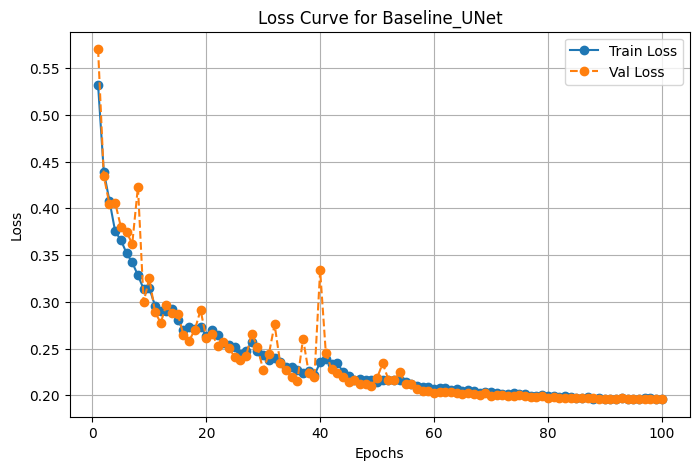

Checkpoint Loaded: /kaggle/working/model_storage/Baseline_UNet.pth, Epoch: 96, Best Metric: 0.1960


Testing:  90%|█████████ | 9/10 [00:01<00:00,  6.25it/s, Loss=0.235]


Test Loss: 0.2204, Dice Score: 0.7432


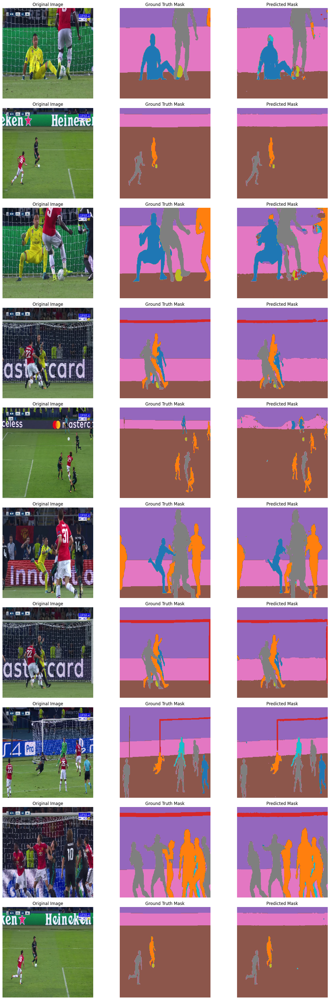

In [28]:
model = UNet(num_classes=11).to(device)
num_epochs = config.num_epochs
criterion = HybridLoss(alpha=0.5, num_classes=11)
optimizer = optim.Adam(model.parameters(), lr=config.lr, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)
train_model(model, "Baseline_UNet", train_loader, val_loader, criterion, optimizer, scheduler, num_epochs)
evaluate_model(model, "Baseline_UNet", test_loader, criterion)

 here chaged CrossEntropyLoss  to hy hybrid loss .

##  4.2. Transformed Data

No Checkpoint Found: /kaggle/working/model_storage/Transformed_UNet.pth
Start with Epoch=0, Best Metric=inf


Training 1/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.468]


Epoch [1/100], Loss: 0.5447,  Dice score: 0.3216


Validation 1/100: 100%|██████████| 2/2 [00:00<00:00,  2.85it/s, Loss=0.595]


Validation Loss: 0.6205, Dice score: 0.1326

Best Validation Metric Updated: inf -> 0.6205
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 1, Best Metric: 0.6205


Training 2/100: 100%|██████████| 16/16 [00:21<00:00,  1.36s/it, Loss=0.397]


Epoch [2/100], Loss: 0.4214,  Dice score: 0.4300


Validation 2/100: 100%|██████████| 2/2 [00:00<00:00,  2.84it/s, Loss=0.459]


Validation Loss: 0.4796, Dice score: 0.2288

Best Validation Metric Updated: 0.6205 -> 0.4796
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 2, Best Metric: 0.4796


Training 3/100: 100%|██████████| 16/16 [00:22<00:00,  1.39s/it, Loss=0.376]


Epoch [3/100], Loss: 0.3959,  Dice score: 0.4634


Validation 3/100: 100%|██████████| 2/2 [00:00<00:00,  2.84it/s, Loss=0.383]


Validation Loss: 0.4012, Dice score: 0.3312

Best Validation Metric Updated: 0.4796 -> 0.4012
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 3, Best Metric: 0.4012


Training 4/100: 100%|██████████| 16/16 [00:21<00:00,  1.32s/it, Loss=0.397]


Epoch [4/100], Loss: 0.3632,  Dice score: 0.4908


Validation 4/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.367]


Validation Loss: 0.3828, Dice score: 0.3850

Best Validation Metric Updated: 0.4012 -> 0.3828
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 4, Best Metric: 0.3828


Training 5/100: 100%|██████████| 16/16 [00:21<00:00,  1.35s/it, Loss=0.301]


Epoch [5/100], Loss: 0.3354,  Dice score: 0.5112


Validation 5/100: 100%|██████████| 2/2 [00:00<00:00,  2.80it/s, Loss=0.356]


Validation Loss: 0.3712, Dice score: 0.4024

Best Validation Metric Updated: 0.3828 -> 0.3712
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 5, Best Metric: 0.3712


Training 6/100: 100%|██████████| 16/16 [00:21<00:00,  1.35s/it, Loss=0.296]


Epoch [6/100], Loss: 0.3233,  Dice score: 0.5466


Validation 6/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.351]


Validation Loss: 0.3616, Dice score: 0.4468

Best Validation Metric Updated: 0.3712 -> 0.3616
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 6, Best Metric: 0.3616


Training 7/100: 100%|██████████| 16/16 [00:21<00:00,  1.33s/it, Loss=0.298]


Epoch [7/100], Loss: 0.3095,  Dice score: 0.5559


Validation 7/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.338]


Validation Loss: 0.3466, Dice score: 0.4485

Best Validation Metric Updated: 0.3616 -> 0.3466
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 7, Best Metric: 0.3466


Training 8/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.294]


Epoch [8/100], Loss: 0.3063,  Dice score: 0.5708


Validation 8/100: 100%|██████████| 2/2 [00:00<00:00,  2.85it/s, Loss=0.352]


Validation Loss: 0.3649, Dice score: 0.4261



Training 9/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.298]


Epoch [9/100], Loss: 0.3004,  Dice score: 0.5952


Validation 9/100: 100%|██████████| 2/2 [00:00<00:00,  2.92it/s, Loss=0.518]


Validation Loss: 0.5862, Dice score: 0.3235



Training 10/100: 100%|██████████| 16/16 [00:21<00:00,  1.36s/it, Loss=0.287]


Epoch [10/100], Loss: 0.2956,  Dice score: 0.6093


Validation 10/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.369]


Validation Loss: 0.3858, Dice score: 0.4460



Training 11/100: 100%|██████████| 16/16 [00:21<00:00,  1.31s/it, Loss=0.292]


Epoch [11/100], Loss: 0.2787,  Dice score: 0.6284


Validation 11/100: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s, Loss=0.322]


Validation Loss: 0.3290, Dice score: 0.4813

Best Validation Metric Updated: 0.3466 -> 0.3290
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 11, Best Metric: 0.3290


Training 12/100: 100%|██████████| 16/16 [00:20<00:00,  1.31s/it, Loss=0.298]


Epoch [12/100], Loss: 0.2713,  Dice score: 0.6451


Validation 12/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=0.302]


Validation Loss: 0.3195, Dice score: 0.4940

Best Validation Metric Updated: 0.3290 -> 0.3195
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 12, Best Metric: 0.3195


Training 13/100: 100%|██████████| 16/16 [00:21<00:00,  1.35s/it, Loss=0.238]


Epoch [13/100], Loss: 0.2666,  Dice score: 0.6496


Validation 13/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=0.305]


Validation Loss: 0.3212, Dice score: 0.5035



Training 14/100: 100%|██████████| 16/16 [00:21<00:00,  1.35s/it, Loss=0.276]


Epoch [14/100], Loss: 0.2620,  Dice score: 0.6509


Validation 14/100: 100%|██████████| 2/2 [00:00<00:00,  2.79it/s, Loss=0.291]


Validation Loss: 0.2955, Dice score: 0.5390

Best Validation Metric Updated: 0.3195 -> 0.2955
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 14, Best Metric: 0.2955


Training 15/100: 100%|██████████| 16/16 [00:20<00:00,  1.30s/it, Loss=0.253]


Epoch [15/100], Loss: 0.2589,  Dice score: 0.6757


Validation 15/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.279]


Validation Loss: 0.2872, Dice score: 0.5495

Best Validation Metric Updated: 0.2955 -> 0.2872
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 15, Best Metric: 0.2872


Training 16/100: 100%|██████████| 16/16 [00:21<00:00,  1.32s/it, Loss=0.227]


Epoch [16/100], Loss: 0.2622,  Dice score: 0.6321


Validation 16/100: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s, Loss=0.416]


Validation Loss: 0.4213, Dice score: 0.3734



Training 17/100: 100%|██████████| 16/16 [00:21<00:00,  1.33s/it, Loss=0.282]


Epoch [17/100], Loss: 0.2615,  Dice score: 0.6558


Validation 17/100: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, Loss=0.286]


Validation Loss: 0.2935, Dice score: 0.5281



Training 18/100: 100%|██████████| 16/16 [00:20<00:00,  1.28s/it, Loss=0.233]


Epoch [18/100], Loss: 0.2481,  Dice score: 0.6728


Validation 18/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.278]


Validation Loss: 0.2927, Dice score: 0.5358



Training 19/100: 100%|██████████| 16/16 [00:20<00:00,  1.31s/it, Loss=0.254]


Epoch [19/100], Loss: 0.2609,  Dice score: 0.6540


Validation 19/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.306]


Validation Loss: 0.3173, Dice score: 0.4959

Learning Rate Updated: 0.001000 -> 0.000500


Training 20/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.255]


Epoch [20/100], Loss: 0.2478,  Dice score: 0.6744


Validation 20/100: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s, Loss=0.267]


Validation Loss: 0.2780, Dice score: 0.5574

Best Validation Metric Updated: 0.2872 -> 0.2780
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 20, Best Metric: 0.2780


Training 21/100: 100%|██████████| 16/16 [00:20<00:00,  1.31s/it, Loss=0.243]


Epoch [21/100], Loss: 0.2426,  Dice score: 0.6847


Validation 21/100: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, Loss=0.263]


Validation Loss: 0.2724, Dice score: 0.5573

Best Validation Metric Updated: 0.2780 -> 0.2724
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 21, Best Metric: 0.2724


Training 22/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.263]


Epoch [22/100], Loss: 0.2352,  Dice score: 0.6995


Validation 22/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.265]


Validation Loss: 0.2710, Dice score: 0.5753

Best Validation Metric Updated: 0.2724 -> 0.2710
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 22, Best Metric: 0.2710


Training 23/100: 100%|██████████| 16/16 [00:20<00:00,  1.30s/it, Loss=0.233]


Epoch [23/100], Loss: 0.2305,  Dice score: 0.7425


Validation 23/100: 100%|██████████| 2/2 [00:00<00:00,  2.85it/s, Loss=0.252]


Validation Loss: 0.2636, Dice score: 0.5902

Best Validation Metric Updated: 0.2710 -> 0.2636
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 23, Best Metric: 0.2636


Training 24/100: 100%|██████████| 16/16 [00:21<00:00,  1.37s/it, Loss=0.218]


Epoch [24/100], Loss: 0.2298,  Dice score: 0.7162


Validation 24/100: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, Loss=0.251]


Validation Loss: 0.2611, Dice score: 0.5995

Best Validation Metric Updated: 0.2636 -> 0.2611
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 24, Best Metric: 0.2611


Training 25/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.188]


Epoch [25/100], Loss: 0.2278,  Dice score: 0.7400


Validation 25/100: 100%|██████████| 2/2 [00:00<00:00,  2.92it/s, Loss=0.254]


Validation Loss: 0.2621, Dice score: 0.5991



Training 26/100: 100%|██████████| 16/16 [00:21<00:00,  1.35s/it, Loss=0.204]


Epoch [26/100], Loss: 0.2216,  Dice score: 0.7385


Validation 26/100: 100%|██████████| 2/2 [00:00<00:00,  2.87it/s, Loss=0.252]


Validation Loss: 0.2602, Dice score: 0.6025

Best Validation Metric Updated: 0.2611 -> 0.2602
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 26, Best Metric: 0.2602


Training 27/100: 100%|██████████| 16/16 [00:22<00:00,  1.38s/it, Loss=0.217]


Epoch [27/100], Loss: 0.2228,  Dice score: 0.7422


Validation 27/100: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s, Loss=0.254]


Validation Loss: 0.2636, Dice score: 0.5874



Training 28/100: 100%|██████████| 16/16 [00:21<00:00,  1.36s/it, Loss=0.225]


Epoch [28/100], Loss: 0.2200,  Dice score: 0.7568


Validation 28/100: 100%|██████████| 2/2 [00:00<00:00,  2.75it/s, Loss=0.25]


Validation Loss: 0.2683, Dice score: 0.5708



Training 29/100: 100%|██████████| 16/16 [00:21<00:00,  1.35s/it, Loss=0.18]


Epoch [29/100], Loss: 0.2190,  Dice score: 0.7720


Validation 29/100: 100%|██████████| 2/2 [00:00<00:00,  2.82it/s, Loss=0.242]


Validation Loss: 0.2536, Dice score: 0.6113

Best Validation Metric Updated: 0.2602 -> 0.2536
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 29, Best Metric: 0.2536


Training 30/100: 100%|██████████| 16/16 [00:21<00:00,  1.37s/it, Loss=0.217]


Epoch [30/100], Loss: 0.2132,  Dice score: 0.7585


Validation 30/100: 100%|██████████| 2/2 [00:00<00:00,  2.82it/s, Loss=0.252]


Validation Loss: 0.2589, Dice score: 0.6055



Training 31/100: 100%|██████████| 16/16 [00:21<00:00,  1.36s/it, Loss=0.183]


Epoch [31/100], Loss: 0.2177,  Dice score: 0.7555


Validation 31/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.241]


Validation Loss: 0.2520, Dice score: 0.6110

Best Validation Metric Updated: 0.2536 -> 0.2520
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 31, Best Metric: 0.2520


Training 32/100: 100%|██████████| 16/16 [00:21<00:00,  1.36s/it, Loss=0.192]


Epoch [32/100], Loss: 0.2169,  Dice score: 0.7649


Validation 32/100: 100%|██████████| 2/2 [00:00<00:00,  2.86it/s, Loss=0.244]


Validation Loss: 0.2602, Dice score: 0.5925



Training 33/100: 100%|██████████| 16/16 [00:22<00:00,  1.41s/it, Loss=0.177]


Epoch [33/100], Loss: 0.2125,  Dice score: 0.7760


Validation 33/100: 100%|██████████| 2/2 [00:00<00:00,  2.86it/s, Loss=0.24]


Validation Loss: 0.2494, Dice score: 0.6227

Best Validation Metric Updated: 0.2520 -> 0.2494
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 33, Best Metric: 0.2494


Training 34/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.2]


Epoch [34/100], Loss: 0.2105,  Dice score: 0.7759


Validation 34/100: 100%|██████████| 2/2 [00:00<00:00,  2.86it/s, Loss=0.245]


Validation Loss: 0.2562, Dice score: 0.6182



Training 35/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.236]


Epoch [35/100], Loss: 0.2133,  Dice score: 0.7794


Validation 35/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.255]


Validation Loss: 0.2638, Dice score: 0.5860



Training 36/100: 100%|██████████| 16/16 [00:21<00:00,  1.36s/it, Loss=0.238]


Epoch [36/100], Loss: 0.2143,  Dice score: 0.7569


Validation 36/100: 100%|██████████| 2/2 [00:00<00:00,  2.79it/s, Loss=0.238]


Validation Loss: 0.2426, Dice score: 0.6418

Best Validation Metric Updated: 0.2494 -> 0.2426
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 36, Best Metric: 0.2426


Training 37/100: 100%|██████████| 16/16 [00:21<00:00,  1.33s/it, Loss=0.185]


Epoch [37/100], Loss: 0.2095,  Dice score: 0.7660


Validation 37/100: 100%|██████████| 2/2 [00:00<00:00,  2.77it/s, Loss=0.243]


Validation Loss: 0.2539, Dice score: 0.6228



Training 38/100: 100%|██████████| 16/16 [00:21<00:00,  1.33s/it, Loss=0.193]


Epoch [38/100], Loss: 0.2065,  Dice score: 0.7797


Validation 38/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.235]


Validation Loss: 0.2413, Dice score: 0.6414

Best Validation Metric Updated: 0.2426 -> 0.2413
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 38, Best Metric: 0.2413


Training 39/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.226]


Epoch [39/100], Loss: 0.2047,  Dice score: 0.7839


Validation 39/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.229]


Validation Loss: 0.2434, Dice score: 0.6335



Training 40/100: 100%|██████████| 16/16 [00:21<00:00,  1.35s/it, Loss=0.225]


Epoch [40/100], Loss: 0.2043,  Dice score: 0.8061


Validation 40/100: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, Loss=0.24]


Validation Loss: 0.2485, Dice score: 0.6581



Training 41/100: 100%|██████████| 16/16 [00:20<00:00,  1.29s/it, Loss=0.158]


Epoch [41/100], Loss: 0.2051,  Dice score: 0.7874


Validation 41/100: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, Loss=0.223]


Validation Loss: 0.2318, Dice score: 0.6790

Best Validation Metric Updated: 0.2413 -> 0.2318
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 41, Best Metric: 0.2318


Training 42/100: 100%|██████████| 16/16 [00:20<00:00,  1.30s/it, Loss=0.154]


Epoch [42/100], Loss: 0.2012,  Dice score: 0.7736


Validation 42/100: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s, Loss=0.224]


Validation Loss: 0.2350, Dice score: 0.6761



Training 43/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.202]


Epoch [43/100], Loss: 0.1976,  Dice score: 0.7930


Validation 43/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.219]


Validation Loss: 0.2339, Dice score: 0.6742



Training 44/100: 100%|██████████| 16/16 [00:21<00:00,  1.33s/it, Loss=0.188]


Epoch [44/100], Loss: 0.1982,  Dice score: 0.7712


Validation 44/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.23]


Validation Loss: 0.2412, Dice score: 0.6908



Training 45/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.19]


Epoch [45/100], Loss: 0.2026,  Dice score: 0.7738


Validation 45/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.231]


Validation Loss: 0.2466, Dice score: 0.6458

Learning Rate Updated: 0.000500 -> 0.000250


Training 46/100: 100%|██████████| 16/16 [00:20<00:00,  1.29s/it, Loss=0.175]


Epoch [46/100], Loss: 0.2004,  Dice score: 0.7736


Validation 46/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.217]


Validation Loss: 0.2291, Dice score: 0.6960

Best Validation Metric Updated: 0.2318 -> 0.2291
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 46, Best Metric: 0.2291


Training 47/100: 100%|██████████| 16/16 [00:20<00:00,  1.30s/it, Loss=0.188]


Epoch [47/100], Loss: 0.1965,  Dice score: 0.7848


Validation 47/100: 100%|██████████| 2/2 [00:00<00:00,  2.92it/s, Loss=0.219]


Validation Loss: 0.2251, Dice score: 0.7073

Best Validation Metric Updated: 0.2291 -> 0.2251
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 47, Best Metric: 0.2251


Training 48/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.193]


Epoch [48/100], Loss: 0.1926,  Dice score: 0.8005


Validation 48/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.214]


Validation Loss: 0.2220, Dice score: 0.7139

Best Validation Metric Updated: 0.2251 -> 0.2220
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 48, Best Metric: 0.2220


Training 49/100: 100%|██████████| 16/16 [00:20<00:00,  1.28s/it, Loss=0.15]


Epoch [49/100], Loss: 0.1913,  Dice score: 0.7809


Validation 49/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.213]


Validation Loss: 0.2203, Dice score: 0.7180

Best Validation Metric Updated: 0.2220 -> 0.2203
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 49, Best Metric: 0.2203


Training 50/100: 100%|██████████| 16/16 [00:20<00:00,  1.31s/it, Loss=0.188]


Epoch [50/100], Loss: 0.1931,  Dice score: 0.7976


Validation 50/100: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, Loss=0.214]


Validation Loss: 0.2227, Dice score: 0.7074



Training 51/100: 100%|██████████| 16/16 [00:21<00:00,  1.32s/it, Loss=0.18]


Epoch [51/100], Loss: 0.1937,  Dice score: 0.7866


Validation 51/100: 100%|██████████| 2/2 [00:00<00:00,  2.84it/s, Loss=0.212]


Validation Loss: 0.2214, Dice score: 0.7197



Training 52/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.161]


Epoch [52/100], Loss: 0.1909,  Dice score: 0.8062


Validation 52/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.214]


Validation Loss: 0.2247, Dice score: 0.7121



Training 53/100: 100%|██████████| 16/16 [00:21<00:00,  1.33s/it, Loss=0.193]


Epoch [53/100], Loss: 0.1909,  Dice score: 0.8080


Validation 53/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.211]


Validation Loss: 0.2189, Dice score: 0.7199

Best Validation Metric Updated: 0.2203 -> 0.2189
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 53, Best Metric: 0.2189


Training 54/100: 100%|██████████| 16/16 [00:21<00:00,  1.32s/it, Loss=0.22]


Epoch [54/100], Loss: 0.1905,  Dice score: 0.8052


Validation 54/100: 100%|██████████| 2/2 [00:00<00:00,  2.69it/s, Loss=0.212]


Validation Loss: 0.2210, Dice score: 0.7164



Training 55/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.221]


Epoch [55/100], Loss: 0.1928,  Dice score: 0.8190


Validation 55/100: 100%|██████████| 2/2 [00:00<00:00,  2.70it/s, Loss=0.216]


Validation Loss: 0.2286, Dice score: 0.6907



Training 56/100: 100%|██████████| 16/16 [00:21<00:00,  1.33s/it, Loss=0.234]


Epoch [56/100], Loss: 0.1901,  Dice score: 0.8134


Validation 56/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.221]


Validation Loss: 0.2328, Dice score: 0.6969



Training 57/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.191]


Epoch [57/100], Loss: 0.1920,  Dice score: 0.8125


Validation 57/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.212]


Validation Loss: 0.2202, Dice score: 0.7130

Learning Rate Updated: 0.000250 -> 0.000125


Training 58/100: 100%|██████████| 16/16 [00:21<00:00,  1.37s/it, Loss=0.164]


Epoch [58/100], Loss: 0.1868,  Dice score: 0.8083


Validation 58/100: 100%|██████████| 2/2 [00:00<00:00,  2.77it/s, Loss=0.208]


Validation Loss: 0.2156, Dice score: 0.7298

Best Validation Metric Updated: 0.2189 -> 0.2156
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 58, Best Metric: 0.2156


Training 59/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.192]


Epoch [59/100], Loss: 0.1870,  Dice score: 0.8063


Validation 59/100: 100%|██████████| 2/2 [00:00<00:00,  2.89it/s, Loss=0.208]


Validation Loss: 0.2174, Dice score: 0.7248



Training 60/100: 100%|██████████| 16/16 [00:22<00:00,  1.41s/it, Loss=0.169]


Epoch [60/100], Loss: 0.1849,  Dice score: 0.8116


Validation 60/100: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s, Loss=0.207]


Validation Loss: 0.2139, Dice score: 0.7321

Best Validation Metric Updated: 0.2156 -> 0.2139
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 60, Best Metric: 0.2139


Training 61/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.22]


Epoch [61/100], Loss: 0.1858,  Dice score: 0.8146


Validation 61/100: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, Loss=0.208]


Validation Loss: 0.2161, Dice score: 0.7297



Training 62/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.185]


Epoch [62/100], Loss: 0.1860,  Dice score: 0.8320


Validation 62/100: 100%|██████████| 2/2 [00:00<00:00,  2.85it/s, Loss=0.205]


Validation Loss: 0.2145, Dice score: 0.7364



Training 63/100: 100%|██████████| 16/16 [00:22<00:00,  1.38s/it, Loss=0.211]


Epoch [63/100], Loss: 0.1856,  Dice score: 0.8213


Validation 63/100: 100%|██████████| 2/2 [00:00<00:00,  2.85it/s, Loss=0.202]


Validation Loss: 0.2114, Dice score: 0.7442

Best Validation Metric Updated: 0.2139 -> 0.2114
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 63, Best Metric: 0.2114


Training 64/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.189]


Epoch [64/100], Loss: 0.1849,  Dice score: 0.8250


Validation 64/100: 100%|██████████| 2/2 [00:00<00:00,  2.79it/s, Loss=0.205]


Validation Loss: 0.2170, Dice score: 0.7318



Training 65/100: 100%|██████████| 16/16 [00:22<00:00,  1.38s/it, Loss=0.165]


Epoch [65/100], Loss: 0.1837,  Dice score: 0.8305


Validation 65/100: 100%|██████████| 2/2 [00:00<00:00,  2.72it/s, Loss=0.204]


Validation Loss: 0.2116, Dice score: 0.7459



Training 66/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.196]


Epoch [66/100], Loss: 0.1853,  Dice score: 0.8167


Validation 66/100: 100%|██████████| 2/2 [00:00<00:00,  2.60it/s, Loss=0.203]


Validation Loss: 0.2113, Dice score: 0.7446

Best Validation Metric Updated: 0.2114 -> 0.2113
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 66, Best Metric: 0.2113


Training 67/100: 100%|██████████| 16/16 [00:21<00:00,  1.35s/it, Loss=0.206]


Epoch [67/100], Loss: 0.1825,  Dice score: 0.8171


Validation 67/100: 100%|██████████| 2/2 [00:00<00:00,  2.79it/s, Loss=0.203]


Validation Loss: 0.2135, Dice score: 0.7251



Training 68/100: 100%|██████████| 16/16 [00:22<00:00,  1.38s/it, Loss=0.161]


Epoch [68/100], Loss: 0.1820,  Dice score: 0.8253


Validation 68/100: 100%|██████████| 2/2 [00:00<00:00,  2.83it/s, Loss=0.204]


Validation Loss: 0.2173, Dice score: 0.7283



Training 69/100: 100%|██████████| 16/16 [00:22<00:00,  1.38s/it, Loss=0.162]


Epoch [69/100], Loss: 0.1821,  Dice score: 0.8362


Validation 69/100: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, Loss=0.203]


Validation Loss: 0.2123, Dice score: 0.7449



Training 70/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.198]


Epoch [70/100], Loss: 0.1836,  Dice score: 0.8219


Validation 70/100: 100%|██████████| 2/2 [00:00<00:00,  2.92it/s, Loss=0.204]


Validation Loss: 0.2128, Dice score: 0.7373

Learning Rate Updated: 0.000125 -> 0.000063


Training 71/100: 100%|██████████| 16/16 [00:21<00:00,  1.32s/it, Loss=0.208]


Epoch [71/100], Loss: 0.1836,  Dice score: 0.8431


Validation 71/100: 100%|██████████| 2/2 [00:00<00:00,  2.84it/s, Loss=0.202]


Validation Loss: 0.2093, Dice score: 0.7422

Best Validation Metric Updated: 0.2113 -> 0.2093
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 71, Best Metric: 0.2093


Training 72/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.181]


Epoch [72/100], Loss: 0.1792,  Dice score: 0.8380


Validation 72/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.201]


Validation Loss: 0.2100, Dice score: 0.7501



Training 73/100: 100%|██████████| 16/16 [00:21<00:00,  1.33s/it, Loss=0.181]


Epoch [73/100], Loss: 0.1826,  Dice score: 0.8357


Validation 73/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.201]


Validation Loss: 0.2105, Dice score: 0.7476



Training 74/100: 100%|██████████| 16/16 [00:21<00:00,  1.35s/it, Loss=0.179]


Epoch [74/100], Loss: 0.1796,  Dice score: 0.8433


Validation 74/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.201]


Validation Loss: 0.2102, Dice score: 0.7493



Training 75/100: 100%|██████████| 16/16 [00:21<00:00,  1.32s/it, Loss=0.163]


Epoch [75/100], Loss: 0.1809,  Dice score: 0.8306


Validation 75/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.2]


Validation Loss: 0.2071, Dice score: 0.7565

Best Validation Metric Updated: 0.2093 -> 0.2071
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 75, Best Metric: 0.2071


Training 76/100: 100%|██████████| 16/16 [00:20<00:00,  1.30s/it, Loss=0.145]


Epoch [76/100], Loss: 0.1805,  Dice score: 0.8275


Validation 76/100: 100%|██████████| 2/2 [00:00<00:00,  2.58it/s, Loss=0.2]


Validation Loss: 0.2087, Dice score: 0.7489



Training 77/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.184]


Epoch [77/100], Loss: 0.1801,  Dice score: 0.8201


Validation 77/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.2]


Validation Loss: 0.2089, Dice score: 0.7539



Training 78/100: 100%|██████████| 16/16 [00:21<00:00,  1.33s/it, Loss=0.174]


Epoch [78/100], Loss: 0.1802,  Dice score: 0.8370


Validation 78/100: 100%|██████████| 2/2 [00:00<00:00,  2.83it/s, Loss=0.2]


Validation Loss: 0.2089, Dice score: 0.7550



Training 79/100: 100%|██████████| 16/16 [00:21<00:00,  1.33s/it, Loss=0.168]


Epoch [79/100], Loss: 0.1788,  Dice score: 0.8369


Validation 79/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.2]


Validation Loss: 0.2082, Dice score: 0.7580

Learning Rate Updated: 0.000063 -> 0.000031


Training 80/100: 100%|██████████| 16/16 [00:20<00:00,  1.31s/it, Loss=0.195]


Epoch [80/100], Loss: 0.1811,  Dice score: 0.8272


Validation 80/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.2]


Validation Loss: 0.2074, Dice score: 0.7574



Training 81/100: 100%|██████████| 16/16 [00:20<00:00,  1.30s/it, Loss=0.168]


Epoch [81/100], Loss: 0.1793,  Dice score: 0.8240


Validation 81/100: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s, Loss=0.2]


Validation Loss: 0.2079, Dice score: 0.7500



Training 82/100: 100%|██████████| 16/16 [00:21<00:00,  1.32s/it, Loss=0.206]


Epoch [82/100], Loss: 0.1777,  Dice score: 0.8480


Validation 82/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.199]


Validation Loss: 0.2072, Dice score: 0.7579



Training 83/100: 100%|██████████| 16/16 [00:21<00:00,  1.33s/it, Loss=0.201]


Epoch [83/100], Loss: 0.1770,  Dice score: 0.8605


Validation 83/100: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s, Loss=0.199]


Validation Loss: 0.2070, Dice score: 0.7573

Best Validation Metric Updated: 0.2071 -> 0.2070
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 83, Best Metric: 0.2070


Training 84/100: 100%|██████████| 16/16 [00:21<00:00,  1.36s/it, Loss=0.222]


Epoch [84/100], Loss: 0.1773,  Dice score: 0.8501


Validation 84/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.199]


Validation Loss: 0.2066, Dice score: 0.7601

Best Validation Metric Updated: 0.2070 -> 0.2066
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 84, Best Metric: 0.2066


Training 85/100: 100%|██████████| 16/16 [00:21<00:00,  1.33s/it, Loss=0.222]


Epoch [85/100], Loss: 0.1795,  Dice score: 0.8472


Validation 85/100: 100%|██████████| 2/2 [00:00<00:00,  2.74it/s, Loss=0.199]


Validation Loss: 0.2070, Dice score: 0.7587



Training 86/100: 100%|██████████| 16/16 [00:21<00:00,  1.36s/it, Loss=0.201]


Epoch [86/100], Loss: 0.1772,  Dice score: 0.8466


Validation 86/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.199]


Validation Loss: 0.2080, Dice score: 0.7570



Training 87/100: 100%|██████████| 16/16 [00:21<00:00,  1.35s/it, Loss=0.125]


Epoch [87/100], Loss: 0.1784,  Dice score: 0.8527


Validation 87/100: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s, Loss=0.199]


Validation Loss: 0.2065, Dice score: 0.7654

Best Validation Metric Updated: 0.2066 -> 0.2065
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 87, Best Metric: 0.2065


Training 88/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.165]


Epoch [88/100], Loss: 0.1771,  Dice score: 0.8392


Validation 88/100: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, Loss=0.198]


Validation Loss: 0.2056, Dice score: 0.7571

Best Validation Metric Updated: 0.2065 -> 0.2056
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 88, Best Metric: 0.2056


Training 89/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.18]


Epoch [89/100], Loss: 0.1772,  Dice score: 0.8386


Validation 89/100: 100%|██████████| 2/2 [00:00<00:00,  2.82it/s, Loss=0.198]


Validation Loss: 0.2065, Dice score: 0.7580



Training 90/100: 100%|██████████| 16/16 [00:21<00:00,  1.37s/it, Loss=0.168]


Epoch [90/100], Loss: 0.1777,  Dice score: 0.8534


Validation 90/100: 100%|██████████| 2/2 [00:00<00:00,  2.41it/s, Loss=0.198]


Validation Loss: 0.2062, Dice score: 0.7600



Training 91/100: 100%|██████████| 16/16 [00:22<00:00,  1.41s/it, Loss=0.215]


Epoch [91/100], Loss: 0.1772,  Dice score: 0.8626


Validation 91/100: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, Loss=0.198]


Validation Loss: 0.2062, Dice score: 0.7563



Training 92/100: 100%|██████████| 16/16 [00:22<00:00,  1.39s/it, Loss=0.206]


Epoch [92/100], Loss: 0.1771,  Dice score: 0.8496


Validation 92/100: 100%|██████████| 2/2 [00:00<00:00,  2.73it/s, Loss=0.199]


Validation Loss: 0.2080, Dice score: 0.7581

Learning Rate Updated: 0.000031 -> 0.000016


Training 93/100: 100%|██████████| 16/16 [00:22<00:00,  1.38s/it, Loss=0.183]


Epoch [93/100], Loss: 0.1767,  Dice score: 0.8412


Validation 93/100: 100%|██████████| 2/2 [00:00<00:00,  2.86it/s, Loss=0.198]


Validation Loss: 0.2063, Dice score: 0.7647



Training 94/100: 100%|██████████| 16/16 [00:22<00:00,  1.42s/it, Loss=0.224]


Epoch [94/100], Loss: 0.1778,  Dice score: 0.8580


Validation 94/100: 100%|██████████| 2/2 [00:00<00:00,  2.67it/s, Loss=0.197]


Validation Loss: 0.2059, Dice score: 0.7595



Training 95/100: 100%|██████████| 16/16 [00:22<00:00,  1.40s/it, Loss=0.186]


Epoch [95/100], Loss: 0.1764,  Dice score: 0.8660


Validation 95/100: 100%|██████████| 2/2 [00:00<00:00,  2.70it/s, Loss=0.197]


Validation Loss: 0.2066, Dice score: 0.7592



Training 96/100: 100%|██████████| 16/16 [00:21<00:00,  1.36s/it, Loss=0.189]


Epoch [96/100], Loss: 0.1741,  Dice score: 0.8467


Validation 96/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.197]


Validation Loss: 0.2060, Dice score: 0.7651

Learning Rate Updated: 0.000016 -> 0.000008


Training 97/100: 100%|██████████| 16/16 [00:22<00:00,  1.39s/it, Loss=0.208]


Epoch [97/100], Loss: 0.1770,  Dice score: 0.8506


Validation 97/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.197]


Validation Loss: 0.2063, Dice score: 0.7616



Training 98/100: 100%|██████████| 16/16 [00:21<00:00,  1.35s/it, Loss=0.126]


Epoch [98/100], Loss: 0.1791,  Dice score: 0.8495


Validation 98/100: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, Loss=0.197]


Validation Loss: 0.2055, Dice score: 0.7609

Best Validation Metric Updated: 0.2056 -> 0.2055
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 98, Best Metric: 0.2055


Training 99/100: 100%|██████████| 16/16 [00:22<00:00,  1.39s/it, Loss=0.165]


Epoch [99/100], Loss: 0.1752,  Dice score: 0.8484


Validation 99/100: 100%|██████████| 2/2 [00:00<00:00,  2.77it/s, Loss=0.197]


Validation Loss: 0.2053, Dice score: 0.7642

Best Validation Metric Updated: 0.2055 -> 0.2053
Checkpint Saved: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 99, Best Metric: 0.2053


Training 100/100: 100%|██████████| 16/16 [00:22<00:00,  1.39s/it, Loss=0.191]


Epoch [100/100], Loss: 0.1764,  Dice score: 0.8437


Validation 100/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.197]

Validation Loss: 0.2056, Dice score: 0.7643



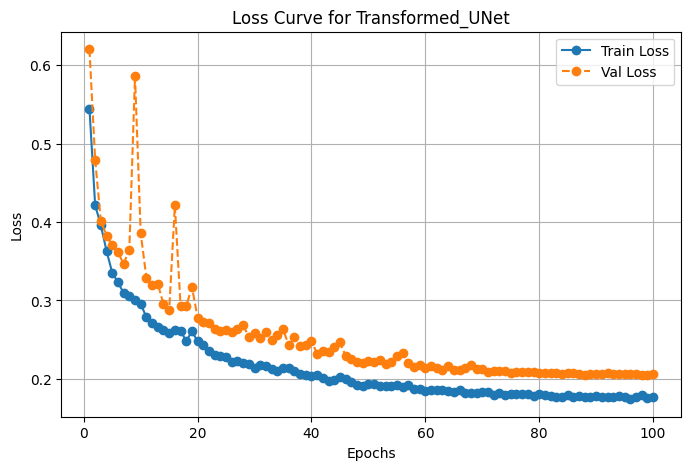

Checkpoint Loaded: /kaggle/working/model_storage/Transformed_UNet.pth, Epoch: 99, Best Metric: 0.2053


Testing:  90%|█████████ | 9/10 [00:01<00:00,  7.00it/s, Loss=0.236]


Test Loss: 0.2268, Dice Score: 0.6297


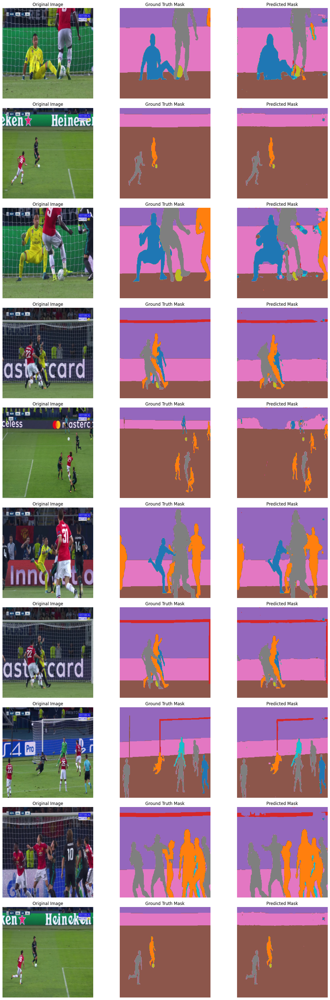

In [29]:
model = UNet(num_classes=11).to(device)
num_epochs = config.num_epochs
criterion = HybridLoss(alpha=0.5, num_classes=11)
optimizer = optim.Adam(model.parameters(), lr=config.lr, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, threshold=1e-4, min_lr=1e-6)
train_model(model, "Transformed_UNet", train_transformed_loader, val_transformed_loader, criterion, optimizer, scheduler, num_epochs)
evaluate_model(model, "Transformed_UNet", test_transformed_loader, criterion)

when learning with agumented data, we used the ReduceLROnPlateau scheduler.

## 4.3. Attention U-Net

In [30]:
import torch.nn.functional as Func

class AttentionGate(nn.Module):
    def __init__(self, in_channels, gating_channels):
        super(AttentionGate, self).__init__()

        inter_channels = in_channels // 2

        self.W_x = nn.Sequential(
            nn.Conv2d(in_channels, inter_channels, kernel_size=1, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(inter_channels)
        )

        self.W_g = nn.Sequential(
            nn.Conv2d(gating_channels, inter_channels, kernel_size=1, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(inter_channels)
        )

        self.psi = nn.Sequential(
            nn.Conv2d(inter_channels, 1, kernel_size=1, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )

    def forward(self, x, g):
        # size correction  (size correction is essential because the encoding step is applies decoding.)
        g = Func.interpolate(g, size=(x.shape[2:]), mode='bilinear', align_corners=True)

        x1 = self.W_x(x)
        g1 = self.W_g(g)

        psi = Func.relu(x1 + g1)
        psi = self.psi(psi)

        return x * psi

class AttentionUNet(nn.Module):
    def __init__(self, num_classes=11):
        super(AttentionUNet, self).__init__()

        def bottleneck_conv_block(in_channels, out_channels):
            return nn.Sequential(
                # first 
                nn.Conv2d(in_channels, out_channels // 4, kernel_size=1, padding=0),
                nn.BatchNorm2d(out_channels // 4),
                nn.ReLU(inplace=True),

                nn.Conv2d(out_channels // 4, out_channels // 4, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels // 4),
                nn.ReLU(inplace=True),

                nn.Conv2d(out_channels // 4, out_channels, kernel_size=1, padding=0),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),

                # dropout 
                nn.Dropout(0.2),

                #second 
                nn.Conv2d(out_channels, out_channels // 4, kernel_size=1, padding=0),
                nn.BatchNorm2d(out_channels // 4),
                nn.ReLU(inplace=True),

                nn.Conv2d(out_channels // 4, out_channels // 4, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels // 4),
                nn.ReLU(inplace=True),

                nn.Conv2d(out_channels // 4, out_channels, kernel_size=1, padding=0),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
            )

        # encoding 
        self.encoder1 = bottleneck_conv_block(3, 64)
        self.encoder2 = bottleneck_conv_block(64, 128)
        self.encoder3 = bottleneck_conv_block(128, 256)
        self.encoder4 = bottleneck_conv_block(256, 512)

        self.pool = nn.MaxPool2d(2, 2)

        self.bottleneck = bottleneck_conv_block(512, 1024)

        # decoding 
        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.attn4 = AttentionGate(512, 1024)
        self.decoder4 = bottleneck_conv_block(1024, 512)

        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.attn3 = AttentionGate(256, 512)
        self.decoder3 = bottleneck_conv_block(512, 256)

        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.attn2 = AttentionGate(128, 256)
        self.decoder2 = bottleneck_conv_block(256, 128)

        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.attn1 = AttentionGate(64, 128)
        self.decoder1 = bottleneck_conv_block(128, 64)

        self.final_conv = nn.Conv2d(64, num_classes, kernel_size=1)


    def forward(self, x):
        # encoding 
        e1 = self.encoder1(x)               # (batch, 64, H, W)
        e2 = self.encoder2(self.pool(e1))   # (batch, 128, H/2, W/2)
        e3 = self.encoder3(self.pool(e2))   # (batch, 256, H/4, W/4)
        e4 = self.encoder4(self.pool(e3))   # (batch, 512, H/8, W/8)

        # bottleneck
        b = self.bottleneck(self.pool(e4))  # (batch, 1024, H/16, W/16)

        # decoding 
        d4 = self.upconv4(b)                # (batch, 512, H/8, W/8)
        e4 = self.attn4(e4, b)              # (batch, 512, H/8, W/8)
        d4 = torch.cat((d4, e4), dim=1)     # (batch, 1024, H/8, W/8)
        d4 = self.decoder4(d4)              # (batch, 512, H/8, W/8)

        d3 = self.upconv3(d4)               # (batch, 256, H/4, W/4)
        e3 = self.attn3(e3, d4)             # (batch, 256, H/4, W/4)
        d3 = torch.cat((d3, e3), dim=1)     # (batch, 512, H/4, W/4)
        d3 = self.decoder3(d3)              # (batch, 256, H/4, W/4)

        d2 = self.upconv2(d3)               # (batch, 128, H/2, W/2)
        e2 = self.attn2(e2, d3)             # (batch, 128, H/2, W/2)
        d2 = torch.cat((d2, e2), dim=1)     # (batch, 256, H/2, W/2)
        d2 = self.decoder2(d2)              # (batch, 128, H/2, W/2)

        d1 = self.upconv1(d2)               # (batch, 64, H, W)
        e1 = self.attn1(e1, d2)             # (batch, 64, H, W)
        d1 = torch.cat((d1, e1), dim=1)     # (batch, 128, H/2, W/2)
        d1 = self.decoder1(d1)              # (batch, 64, H, W)

        return self.final_conv(d1)          # (batch, num_classes, H, W)

In [31]:
summary(AttentionUNet(num_classes=11), input_size=(8, 3, 256, 256))

Layer (type:depth-idx)                   Output Shape              Param #
AttentionUNet                            [8, 11, 256, 256]         --
├─Sequential: 1-1                        [8, 64, 256, 256]         --
│    └─Conv2d: 2-1                       [8, 16, 256, 256]         64
│    └─BatchNorm2d: 2-2                  [8, 16, 256, 256]         32
│    └─ReLU: 2-3                         [8, 16, 256, 256]         --
│    └─Conv2d: 2-4                       [8, 16, 256, 256]         2,320
│    └─BatchNorm2d: 2-5                  [8, 16, 256, 256]         32
│    └─ReLU: 2-6                         [8, 16, 256, 256]         --
│    └─Conv2d: 2-7                       [8, 64, 256, 256]         1,088
│    └─BatchNorm2d: 2-8                  [8, 64, 256, 256]         128
│    └─ReLU: 2-9                         [8, 64, 256, 256]         --
│    └─Dropout: 2-10                     [8, 64, 256, 256]         --
│    └─Conv2d: 2-11                      [8, 16, 256, 256]         1,040
│    

No Checkpoint Found: /kaggle/working/model_storage/AttentionUNet.pth
Start with Epoch=0, Best Metric=inf


Training 1/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.609]


Epoch [1/100], Loss: 0.6692,  Dice score: 0.1502


Validation 1/100: 100%|██████████| 2/2 [00:00<00:00,  2.80it/s, Loss=0.697]


Validation Loss: 0.6989, Dice score: 0.0410

Learning Rate Updated: 0.001000 -> 0.001000
Best Validation Metric Updated: inf -> 0.6989
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 1, Best Metric: 0.6989


Training 2/100: 100%|██████████| 16/16 [00:20<00:00,  1.28s/it, Loss=0.513]


Epoch [2/100], Loss: 0.5520,  Dice score: 0.2085


Validation 2/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.585]


Validation Loss: 0.5890, Dice score: 0.1518

Learning Rate Updated: 0.001000 -> 0.000999
Best Validation Metric Updated: 0.6989 -> 0.5890
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 2, Best Metric: 0.5890


Training 3/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.446]


Epoch [3/100], Loss: 0.4834,  Dice score: 0.2264


Validation 3/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.46]


Validation Loss: 0.4677, Dice score: 0.2186

Learning Rate Updated: 0.000999 -> 0.000998
Best Validation Metric Updated: 0.5890 -> 0.4677
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 3, Best Metric: 0.4677


Training 4/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.554]


Epoch [4/100], Loss: 0.4577,  Dice score: 0.2496


Validation 4/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.419]


Validation Loss: 0.4332, Dice score: 0.2630

Learning Rate Updated: 0.000998 -> 0.000996
Best Validation Metric Updated: 0.4677 -> 0.4332
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 4, Best Metric: 0.4332


Training 5/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.438]


Epoch [5/100], Loss: 0.4285,  Dice score: 0.2911


Validation 5/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.408]


Validation Loss: 0.4253, Dice score: 0.2818

Learning Rate Updated: 0.000996 -> 0.000994
Best Validation Metric Updated: 0.4332 -> 0.4253
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 5, Best Metric: 0.4253


Training 6/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.394]


Epoch [6/100], Loss: 0.4200,  Dice score: 0.2887


Validation 6/100: 100%|██████████| 2/2 [00:00<00:00,  2.65it/s, Loss=0.388]


Validation Loss: 0.4068, Dice score: 0.2830

Learning Rate Updated: 0.000994 -> 0.000991
Best Validation Metric Updated: 0.4253 -> 0.4068
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 6, Best Metric: 0.4068


Training 7/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.377]


Epoch [7/100], Loss: 0.4063,  Dice score: 0.2986


Validation 7/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.378]


Validation Loss: 0.3975, Dice score: 0.3035

Learning Rate Updated: 0.000991 -> 0.000988
Best Validation Metric Updated: 0.4068 -> 0.3975
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 7, Best Metric: 0.3975


Training 8/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.43]


Epoch [8/100], Loss: 0.4049,  Dice score: 0.3211


Validation 8/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.399]


Validation Loss: 0.4202, Dice score: 0.2829

Learning Rate Updated: 0.000988 -> 0.000984


Training 9/100: 100%|██████████| 16/16 [00:18<00:00,  1.18s/it, Loss=0.384]


Epoch [9/100], Loss: 0.3972,  Dice score: 0.3409


Validation 9/100: 100%|██████████| 2/2 [00:00<00:00,  2.66it/s, Loss=0.376]


Validation Loss: 0.3908, Dice score: 0.2905

Learning Rate Updated: 0.000984 -> 0.000980
Best Validation Metric Updated: 0.3975 -> 0.3908
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 9, Best Metric: 0.3908


Training 10/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.383]


Epoch [10/100], Loss: 0.3772,  Dice score: 0.3754


Validation 10/100: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, Loss=0.368]


Validation Loss: 0.3865, Dice score: 0.3216

Learning Rate Updated: 0.000980 -> 0.000976
Best Validation Metric Updated: 0.3908 -> 0.3865
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 10, Best Metric: 0.3865


Training 11/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.447]


Epoch [11/100], Loss: 0.3674,  Dice score: 0.4151


Validation 11/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.373]


Validation Loss: 0.3884, Dice score: 0.3350

Learning Rate Updated: 0.000976 -> 0.000970


Training 12/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.385]


Epoch [12/100], Loss: 0.3634,  Dice score: 0.4257


Validation 12/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.369]


Validation Loss: 0.3811, Dice score: 0.3527

Learning Rate Updated: 0.000970 -> 0.000965
Best Validation Metric Updated: 0.3865 -> 0.3811
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 12, Best Metric: 0.3811


Training 13/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.332]


Epoch [13/100], Loss: 0.3489,  Dice score: 0.4593


Validation 13/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.36]


Validation Loss: 0.3801, Dice score: 0.3336

Learning Rate Updated: 0.000965 -> 0.000959
Best Validation Metric Updated: 0.3811 -> 0.3801
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 13, Best Metric: 0.3801


Training 14/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.338]


Epoch [14/100], Loss: 0.3420,  Dice score: 0.4620


Validation 14/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.353]


Validation Loss: 0.3680, Dice score: 0.3510

Learning Rate Updated: 0.000959 -> 0.000952
Best Validation Metric Updated: 0.3801 -> 0.3680
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 14, Best Metric: 0.3680


Training 15/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.324]


Epoch [15/100], Loss: 0.3383,  Dice score: 0.4750


Validation 15/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.345]


Validation Loss: 0.3635, Dice score: 0.3566

Learning Rate Updated: 0.000952 -> 0.000946
Best Validation Metric Updated: 0.3680 -> 0.3635
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 15, Best Metric: 0.3635


Training 16/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.348]


Epoch [16/100], Loss: 0.3279,  Dice score: 0.5108


Validation 16/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.37]


Validation Loss: 0.3834, Dice score: 0.3470

Learning Rate Updated: 0.000946 -> 0.000938


Training 17/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.336]


Epoch [17/100], Loss: 0.3239,  Dice score: 0.4921


Validation 17/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.335]


Validation Loss: 0.3440, Dice score: 0.3881

Learning Rate Updated: 0.000938 -> 0.000930
Best Validation Metric Updated: 0.3635 -> 0.3440
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 17, Best Metric: 0.3440


Training 18/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.302]


Epoch [18/100], Loss: 0.3099,  Dice score: 0.5108


Validation 18/100: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, Loss=0.341]


Validation Loss: 0.3580, Dice score: 0.3849

Learning Rate Updated: 0.000930 -> 0.000922


Training 19/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.278]


Epoch [19/100], Loss: 0.3078,  Dice score: 0.5296


Validation 19/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.343]


Validation Loss: 0.3545, Dice score: 0.4236

Learning Rate Updated: 0.000922 -> 0.000914


Training 20/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.284]


Epoch [20/100], Loss: 0.3088,  Dice score: 0.5504


Validation 20/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.313]


Validation Loss: 0.3322, Dice score: 0.4458

Learning Rate Updated: 0.000914 -> 0.000905
Best Validation Metric Updated: 0.3440 -> 0.3322
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 20, Best Metric: 0.3322


Training 21/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.28]


Epoch [21/100], Loss: 0.2943,  Dice score: 0.5758


Validation 21/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.306]


Validation Loss: 0.3209, Dice score: 0.4683

Learning Rate Updated: 0.000905 -> 0.000895
Best Validation Metric Updated: 0.3322 -> 0.3209
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 21, Best Metric: 0.3209


Training 22/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.255]


Epoch [22/100], Loss: 0.2876,  Dice score: 0.5761


Validation 22/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.331]


Validation Loss: 0.3470, Dice score: 0.4364

Learning Rate Updated: 0.000895 -> 0.000885


Training 23/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.258]


Epoch [23/100], Loss: 0.3039,  Dice score: 0.5637


Validation 23/100: 100%|██████████| 2/2 [00:00<00:00,  2.79it/s, Loss=0.3]


Validation Loss: 0.3118, Dice score: 0.4847

Learning Rate Updated: 0.000885 -> 0.000875
Best Validation Metric Updated: 0.3209 -> 0.3118
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 23, Best Metric: 0.3118


Training 24/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.281]


Epoch [24/100], Loss: 0.2812,  Dice score: 0.6107


Validation 24/100: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s, Loss=0.292]


Validation Loss: 0.3016, Dice score: 0.5086

Learning Rate Updated: 0.000875 -> 0.000865
Best Validation Metric Updated: 0.3118 -> 0.3016
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 24, Best Metric: 0.3016


Training 25/100: 100%|██████████| 16/16 [00:20<00:00,  1.29s/it, Loss=0.242]


Epoch [25/100], Loss: 0.2709,  Dice score: 0.6310


Validation 25/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.305]


Validation Loss: 0.3143, Dice score: 0.4913

Learning Rate Updated: 0.000865 -> 0.000854


Training 26/100: 100%|██████████| 16/16 [00:20<00:00,  1.29s/it, Loss=0.262]


Epoch [26/100], Loss: 0.2711,  Dice score: 0.6264


Validation 26/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.3]


Validation Loss: 0.3101, Dice score: 0.5017

Learning Rate Updated: 0.000854 -> 0.000842


Training 27/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.286]


Epoch [27/100], Loss: 0.2666,  Dice score: 0.6163


Validation 27/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.284]


Validation Loss: 0.2996, Dice score: 0.5115

Learning Rate Updated: 0.000842 -> 0.000831
Best Validation Metric Updated: 0.3016 -> 0.2996
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 27, Best Metric: 0.2996


Training 28/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.258]


Epoch [28/100], Loss: 0.2685,  Dice score: 0.6320


Validation 28/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.286]


Validation Loss: 0.2946, Dice score: 0.5158

Learning Rate Updated: 0.000831 -> 0.000819
Best Validation Metric Updated: 0.2996 -> 0.2946
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 28, Best Metric: 0.2946


Training 29/100: 100%|██████████| 16/16 [00:20<00:00,  1.30s/it, Loss=0.262]


Epoch [29/100], Loss: 0.2655,  Dice score: 0.6503


Validation 29/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.302]


Validation Loss: 0.3171, Dice score: 0.4942

Learning Rate Updated: 0.000819 -> 0.000807


Training 30/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.245]


Epoch [30/100], Loss: 0.2665,  Dice score: 0.6205


Validation 30/100: 100%|██████████| 2/2 [00:00<00:00,  2.83it/s, Loss=0.316]


Validation Loss: 0.3207, Dice score: 0.4809

Learning Rate Updated: 0.000807 -> 0.000794


Training 31/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.254]


Epoch [31/100], Loss: 0.2635,  Dice score: 0.6279


Validation 31/100: 100%|██████████| 2/2 [00:00<00:00,  2.87it/s, Loss=0.287]


Validation Loss: 0.2912, Dice score: 0.5257

Learning Rate Updated: 0.000794 -> 0.000781
Best Validation Metric Updated: 0.2946 -> 0.2912
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 31, Best Metric: 0.2912


Training 32/100: 100%|██████████| 16/16 [00:20<00:00,  1.30s/it, Loss=0.252]


Epoch [32/100], Loss: 0.2575,  Dice score: 0.6413


Validation 32/100: 100%|██████████| 2/2 [00:00<00:00,  2.92it/s, Loss=0.304]


Validation Loss: 0.3284, Dice score: 0.4968

Learning Rate Updated: 0.000781 -> 0.000768


Training 33/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.229]


Epoch [33/100], Loss: 0.2518,  Dice score: 0.6515


Validation 33/100: 100%|██████████| 2/2 [00:00<00:00,  2.84it/s, Loss=0.28]


Validation Loss: 0.2824, Dice score: 0.5306

Learning Rate Updated: 0.000768 -> 0.000755
Best Validation Metric Updated: 0.2912 -> 0.2824
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 33, Best Metric: 0.2824


Training 34/100: 100%|██████████| 16/16 [00:20<00:00,  1.29s/it, Loss=0.252]


Epoch [34/100], Loss: 0.2522,  Dice score: 0.6530


Validation 34/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.276]


Validation Loss: 0.2822, Dice score: 0.5404

Learning Rate Updated: 0.000755 -> 0.000741
Best Validation Metric Updated: 0.2824 -> 0.2822
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 34, Best Metric: 0.2822


Training 35/100: 100%|██████████| 16/16 [00:20<00:00,  1.30s/it, Loss=0.259]


Epoch [35/100], Loss: 0.2493,  Dice score: 0.6684


Validation 35/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.289]


Validation Loss: 0.2919, Dice score: 0.5312

Learning Rate Updated: 0.000741 -> 0.000727


Training 36/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.255]


Epoch [36/100], Loss: 0.2490,  Dice score: 0.6767


Validation 36/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.278]


Validation Loss: 0.2851, Dice score: 0.5433

Learning Rate Updated: 0.000727 -> 0.000713


Training 37/100: 100%|██████████| 16/16 [00:20<00:00,  1.30s/it, Loss=0.227]


Epoch [37/100], Loss: 0.2429,  Dice score: 0.6940


Validation 37/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.273]


Validation Loss: 0.2772, Dice score: 0.5559

Learning Rate Updated: 0.000713 -> 0.000699
Best Validation Metric Updated: 0.2822 -> 0.2772
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 37, Best Metric: 0.2772


Training 38/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.264]


Epoch [38/100], Loss: 0.2469,  Dice score: 0.6763


Validation 38/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.273]


Validation Loss: 0.2841, Dice score: 0.5449

Learning Rate Updated: 0.000699 -> 0.000684


Training 39/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.23]


Epoch [39/100], Loss: 0.2462,  Dice score: 0.6734


Validation 39/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.274]


Validation Loss: 0.2797, Dice score: 0.5505

Learning Rate Updated: 0.000684 -> 0.000670


Training 40/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.252]


Epoch [40/100], Loss: 0.2426,  Dice score: 0.6883


Validation 40/100: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, Loss=0.281]


Validation Loss: 0.2847, Dice score: 0.5372

Learning Rate Updated: 0.000670 -> 0.000655


Training 41/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.204]


Epoch [41/100], Loss: 0.2388,  Dice score: 0.6898


Validation 41/100: 100%|██████████| 2/2 [00:00<00:00,  2.66it/s, Loss=0.27]


Validation Loss: 0.2752, Dice score: 0.5540

Learning Rate Updated: 0.000655 -> 0.000640
Best Validation Metric Updated: 0.2772 -> 0.2752
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 41, Best Metric: 0.2752


Training 42/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.231]


Epoch [42/100], Loss: 0.2407,  Dice score: 0.7022


Validation 42/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.266]


Validation Loss: 0.2700, Dice score: 0.5747

Learning Rate Updated: 0.000640 -> 0.000625
Best Validation Metric Updated: 0.2752 -> 0.2700
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 42, Best Metric: 0.2700


Training 43/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.267]


Epoch [43/100], Loss: 0.2518,  Dice score: 0.6738


Validation 43/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.337]


Validation Loss: 0.3385, Dice score: 0.4692

Learning Rate Updated: 0.000625 -> 0.000609


Training 44/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.248]


Epoch [44/100], Loss: 0.2489,  Dice score: 0.6735


Validation 44/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.3]


Validation Loss: 0.3119, Dice score: 0.5016

Learning Rate Updated: 0.000609 -> 0.000594


Training 45/100: 100%|██████████| 16/16 [00:20<00:00,  1.28s/it, Loss=0.261]


Epoch [45/100], Loss: 0.2416,  Dice score: 0.6801


Validation 45/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.265]


Validation Loss: 0.2750, Dice score: 0.5566

Learning Rate Updated: 0.000594 -> 0.000579


Training 46/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.191]


Epoch [46/100], Loss: 0.2349,  Dice score: 0.7033


Validation 46/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.279]


Validation Loss: 0.2813, Dice score: 0.5590

Learning Rate Updated: 0.000579 -> 0.000563


Training 47/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.193]


Epoch [47/100], Loss: 0.2308,  Dice score: 0.7101


Validation 47/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=0.266]


Validation Loss: 0.2689, Dice score: 0.5776

Learning Rate Updated: 0.000563 -> 0.000548
Best Validation Metric Updated: 0.2700 -> 0.2689
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 47, Best Metric: 0.2689


Training 48/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.236]


Epoch [48/100], Loss: 0.2270,  Dice score: 0.7133


Validation 48/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.259]


Validation Loss: 0.2699, Dice score: 0.6028

Learning Rate Updated: 0.000548 -> 0.000532


Training 49/100: 100%|██████████| 16/16 [00:20<00:00,  1.28s/it, Loss=0.239]


Epoch [49/100], Loss: 0.2276,  Dice score: 0.7213


Validation 49/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=0.27]


Validation Loss: 0.2750, Dice score: 0.5592

Learning Rate Updated: 0.000532 -> 0.000516


Training 50/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.219]


Epoch [50/100], Loss: 0.2357,  Dice score: 0.6956


Validation 50/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.262]


Validation Loss: 0.2664, Dice score: 0.5692

Learning Rate Updated: 0.000516 -> 0.000501
Best Validation Metric Updated: 0.2689 -> 0.2664
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 50, Best Metric: 0.2664


Training 51/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.219]


Epoch [51/100], Loss: 0.2290,  Dice score: 0.7127


Validation 51/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.263]


Validation Loss: 0.2721, Dice score: 0.5670

Learning Rate Updated: 0.000501 -> 0.000485


Training 52/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.207]


Epoch [52/100], Loss: 0.2257,  Dice score: 0.7328


Validation 52/100: 100%|██████████| 2/2 [00:00<00:00,  2.84it/s, Loss=0.266]


Validation Loss: 0.2738, Dice score: 0.5609

Learning Rate Updated: 0.000485 -> 0.000469


Training 53/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.25]


Epoch [53/100], Loss: 0.2292,  Dice score: 0.7144


Validation 53/100: 100%|██████████| 2/2 [00:00<00:00,  2.86it/s, Loss=0.263]


Validation Loss: 0.2660, Dice score: 0.5838

Learning Rate Updated: 0.000469 -> 0.000453
Best Validation Metric Updated: 0.2664 -> 0.2660
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 53, Best Metric: 0.2660


Training 54/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.256]


Epoch [54/100], Loss: 0.2231,  Dice score: 0.7300


Validation 54/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.257]


Validation Loss: 0.2634, Dice score: 0.5831

Learning Rate Updated: 0.000453 -> 0.000438
Best Validation Metric Updated: 0.2660 -> 0.2634
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 54, Best Metric: 0.2634


Training 55/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.218]


Epoch [55/100], Loss: 0.2224,  Dice score: 0.7277


Validation 55/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.258]


Validation Loss: 0.2632, Dice score: 0.5868

Learning Rate Updated: 0.000438 -> 0.000422
Best Validation Metric Updated: 0.2634 -> 0.2632
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 55, Best Metric: 0.2632


Training 56/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.25]


Epoch [56/100], Loss: 0.2198,  Dice score: 0.7374


Validation 56/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.256]


Validation Loss: 0.2624, Dice score: 0.5843

Learning Rate Updated: 0.000422 -> 0.000407
Best Validation Metric Updated: 0.2632 -> 0.2624
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 56, Best Metric: 0.2624


Training 57/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.187]


Epoch [57/100], Loss: 0.2151,  Dice score: 0.7438


Validation 57/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.254]


Validation Loss: 0.2633, Dice score: 0.5825

Learning Rate Updated: 0.000407 -> 0.000392


Training 58/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.205]


Epoch [58/100], Loss: 0.2168,  Dice score: 0.7478


Validation 58/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.255]


Validation Loss: 0.2596, Dice score: 0.5994

Learning Rate Updated: 0.000392 -> 0.000376
Best Validation Metric Updated: 0.2624 -> 0.2596
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 58, Best Metric: 0.2596


Training 59/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.231]


Epoch [59/100], Loss: 0.2174,  Dice score: 0.7539


Validation 59/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=0.256]


Validation Loss: 0.2586, Dice score: 0.5869

Learning Rate Updated: 0.000376 -> 0.000361
Best Validation Metric Updated: 0.2596 -> 0.2586
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 59, Best Metric: 0.2586


Training 60/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.2]


Epoch [60/100], Loss: 0.2150,  Dice score: 0.7421


Validation 60/100: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s, Loss=0.253]


Validation Loss: 0.2559, Dice score: 0.5973

Learning Rate Updated: 0.000361 -> 0.000346
Best Validation Metric Updated: 0.2586 -> 0.2559
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 60, Best Metric: 0.2559


Training 61/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.204]


Epoch [61/100], Loss: 0.2209,  Dice score: 0.7437


Validation 61/100: 100%|██████████| 2/2 [00:00<00:00,  2.85it/s, Loss=0.255]


Validation Loss: 0.2571, Dice score: 0.5942

Learning Rate Updated: 0.000346 -> 0.000331


Training 62/100: 100%|██████████| 16/16 [00:20<00:00,  1.28s/it, Loss=0.209]


Epoch [62/100], Loss: 0.2162,  Dice score: 0.7546


Validation 62/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.253]


Validation Loss: 0.2618, Dice score: 0.5867

Learning Rate Updated: 0.000331 -> 0.000317


Training 63/100: 100%|██████████| 16/16 [00:20<00:00,  1.29s/it, Loss=0.163]


Epoch [63/100], Loss: 0.2153,  Dice score: 0.7476


Validation 63/100: 100%|██████████| 2/2 [00:00<00:00,  2.79it/s, Loss=0.251]


Validation Loss: 0.2570, Dice score: 0.5939

Learning Rate Updated: 0.000317 -> 0.000302


Training 64/100: 100%|██████████| 16/16 [00:20<00:00,  1.29s/it, Loss=0.207]


Epoch [64/100], Loss: 0.2149,  Dice score: 0.7475


Validation 64/100: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s, Loss=0.252]


Validation Loss: 0.2545, Dice score: 0.6052

Learning Rate Updated: 0.000302 -> 0.000288
Best Validation Metric Updated: 0.2559 -> 0.2545
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 64, Best Metric: 0.2545


Training 65/100: 100%|██████████| 16/16 [00:20<00:00,  1.28s/it, Loss=0.234]


Epoch [65/100], Loss: 0.2151,  Dice score: 0.7568


Validation 65/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.251]


Validation Loss: 0.2550, Dice score: 0.6073

Learning Rate Updated: 0.000288 -> 0.000274


Training 66/100: 100%|██████████| 16/16 [00:20<00:00,  1.28s/it, Loss=0.2]


Epoch [66/100], Loss: 0.2175,  Dice score: 0.7443


Validation 66/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.251]


Validation Loss: 0.2563, Dice score: 0.6062

Learning Rate Updated: 0.000274 -> 0.000260


Training 67/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.182]


Epoch [67/100], Loss: 0.2126,  Dice score: 0.7570


Validation 67/100: 100%|██████████| 2/2 [00:00<00:00,  2.89it/s, Loss=0.26]


Validation Loss: 0.2621, Dice score: 0.5760

Learning Rate Updated: 0.000260 -> 0.000246


Training 68/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.242]


Epoch [68/100], Loss: 0.2135,  Dice score: 0.7482


Validation 68/100: 100%|██████████| 2/2 [00:00<00:00,  3.01it/s, Loss=0.253]


Validation Loss: 0.2568, Dice score: 0.5995

Learning Rate Updated: 0.000246 -> 0.000233


Training 69/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.19]


Epoch [69/100], Loss: 0.2141,  Dice score: 0.7596


Validation 69/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.249]


Validation Loss: 0.2524, Dice score: 0.6028

Learning Rate Updated: 0.000233 -> 0.000220
Best Validation Metric Updated: 0.2545 -> 0.2524
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 69, Best Metric: 0.2524


Training 70/100: 100%|██████████| 16/16 [00:20<00:00,  1.29s/it, Loss=0.225]


Epoch [70/100], Loss: 0.2113,  Dice score: 0.7531


Validation 70/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.25]


Validation Loss: 0.2563, Dice score: 0.5977

Learning Rate Updated: 0.000220 -> 0.000207


Training 71/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.224]


Epoch [71/100], Loss: 0.2117,  Dice score: 0.7603


Validation 71/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.246]


Validation Loss: 0.2510, Dice score: 0.6098

Learning Rate Updated: 0.000207 -> 0.000194
Best Validation Metric Updated: 0.2524 -> 0.2510
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 71, Best Metric: 0.2510


Training 72/100: 100%|██████████| 16/16 [00:20<00:00,  1.28s/it, Loss=0.241]


Epoch [72/100], Loss: 0.2151,  Dice score: 0.7287


Validation 72/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.249]


Validation Loss: 0.2544, Dice score: 0.6041

Learning Rate Updated: 0.000194 -> 0.000182


Training 73/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.233]


Epoch [73/100], Loss: 0.2125,  Dice score: 0.7692


Validation 73/100: 100%|██████████| 2/2 [00:00<00:00,  3.06it/s, Loss=0.253]


Validation Loss: 0.2553, Dice score: 0.6001

Learning Rate Updated: 0.000182 -> 0.000170


Training 74/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.19]


Epoch [74/100], Loss: 0.2112,  Dice score: 0.7653


Validation 74/100: 100%|██████████| 2/2 [00:00<00:00,  3.06it/s, Loss=0.248]


Validation Loss: 0.2534, Dice score: 0.6059

Learning Rate Updated: 0.000170 -> 0.000159


Training 75/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.205]


Epoch [75/100], Loss: 0.2094,  Dice score: 0.7543


Validation 75/100: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, Loss=0.247]


Validation Loss: 0.2499, Dice score: 0.6133

Learning Rate Updated: 0.000159 -> 0.000147
Best Validation Metric Updated: 0.2510 -> 0.2499
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 75, Best Metric: 0.2499


Training 76/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.247]


Epoch [76/100], Loss: 0.2129,  Dice score: 0.7535


Validation 76/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.248]


Validation Loss: 0.2496, Dice score: 0.6114

Learning Rate Updated: 0.000147 -> 0.000136
Best Validation Metric Updated: 0.2499 -> 0.2496
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 76, Best Metric: 0.2496


Training 77/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.166]


Epoch [77/100], Loss: 0.2063,  Dice score: 0.7762


Validation 77/100: 100%|██████████| 2/2 [00:00<00:00,  2.96it/s, Loss=0.248]


Validation Loss: 0.2501, Dice score: 0.6104

Learning Rate Updated: 0.000136 -> 0.000126


Training 78/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.201]


Epoch [78/100], Loss: 0.2067,  Dice score: 0.7795


Validation 78/100: 100%|██████████| 2/2 [00:00<00:00,  3.09it/s, Loss=0.246]


Validation Loss: 0.2492, Dice score: 0.6103

Learning Rate Updated: 0.000126 -> 0.000116
Best Validation Metric Updated: 0.2496 -> 0.2492
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 78, Best Metric: 0.2492


Training 79/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.186]


Epoch [79/100], Loss: 0.2055,  Dice score: 0.7826


Validation 79/100: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s, Loss=0.246]


Validation Loss: 0.2495, Dice score: 0.6123

Learning Rate Updated: 0.000116 -> 0.000106


Training 80/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.224]


Epoch [80/100], Loss: 0.2088,  Dice score: 0.7634


Validation 80/100: 100%|██████████| 2/2 [00:00<00:00,  2.71it/s, Loss=0.245]


Validation Loss: 0.2484, Dice score: 0.6094

Learning Rate Updated: 0.000106 -> 0.000096
Best Validation Metric Updated: 0.2492 -> 0.2484
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 80, Best Metric: 0.2484


Training 81/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.203]


Epoch [81/100], Loss: 0.2098,  Dice score: 0.7602


Validation 81/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.246]


Validation Loss: 0.2490, Dice score: 0.6110

Learning Rate Updated: 0.000096 -> 0.000087


Training 82/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.185]


Epoch [82/100], Loss: 0.2075,  Dice score: 0.7684


Validation 82/100: 100%|██████████| 2/2 [00:00<00:00,  3.09it/s, Loss=0.247]


Validation Loss: 0.2518, Dice score: 0.6111

Learning Rate Updated: 0.000087 -> 0.000079


Training 83/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.221]


Epoch [83/100], Loss: 0.2052,  Dice score: 0.7786


Validation 83/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.245]


Validation Loss: 0.2477, Dice score: 0.6129

Learning Rate Updated: 0.000079 -> 0.000071
Best Validation Metric Updated: 0.2484 -> 0.2477
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 83, Best Metric: 0.2477


Training 84/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.207]


Epoch [84/100], Loss: 0.2097,  Dice score: 0.7681


Validation 84/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.245]


Validation Loss: 0.2477, Dice score: 0.6128

Learning Rate Updated: 0.000071 -> 0.000063
Best Validation Metric Updated: 0.2477 -> 0.2477
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 84, Best Metric: 0.2477


Training 85/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.158]


Epoch [85/100], Loss: 0.2046,  Dice score: 0.7885


Validation 85/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.245]


Validation Loss: 0.2483, Dice score: 0.6139

Learning Rate Updated: 0.000063 -> 0.000055


Training 86/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.161]


Epoch [86/100], Loss: 0.2073,  Dice score: 0.7716


Validation 86/100: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, Loss=0.245]


Validation Loss: 0.2478, Dice score: 0.6122

Learning Rate Updated: 0.000055 -> 0.000049


Training 87/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.233]


Epoch [87/100], Loss: 0.2059,  Dice score: 0.7775


Validation 87/100: 100%|██████████| 2/2 [00:00<00:00,  3.03it/s, Loss=0.244]


Validation Loss: 0.2468, Dice score: 0.6173

Learning Rate Updated: 0.000049 -> 0.000042
Best Validation Metric Updated: 0.2477 -> 0.2468
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 87, Best Metric: 0.2468


Training 88/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.186]


Epoch [88/100], Loss: 0.2082,  Dice score: 0.7653


Validation 88/100: 100%|██████████| 2/2 [00:00<00:00,  3.09it/s, Loss=0.245]


Validation Loss: 0.2475, Dice score: 0.6159

Learning Rate Updated: 0.000042 -> 0.000036


Training 89/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.197]


Epoch [89/100], Loss: 0.2047,  Dice score: 0.7779


Validation 89/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.245]


Validation Loss: 0.2469, Dice score: 0.6138

Learning Rate Updated: 0.000036 -> 0.000031


Training 90/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.182]


Epoch [90/100], Loss: 0.2061,  Dice score: 0.7747


Validation 90/100: 100%|██████████| 2/2 [00:00<00:00,  2.95it/s, Loss=0.245]


Validation Loss: 0.2480, Dice score: 0.6125

Learning Rate Updated: 0.000031 -> 0.000025


Training 91/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.2]


Epoch [91/100], Loss: 0.2057,  Dice score: 0.7850


Validation 91/100: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s, Loss=0.244]


Validation Loss: 0.2464, Dice score: 0.6136

Learning Rate Updated: 0.000025 -> 0.000021
Best Validation Metric Updated: 0.2468 -> 0.2464
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 91, Best Metric: 0.2464


Training 92/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.226]


Epoch [92/100], Loss: 0.2044,  Dice score: 0.7763


Validation 92/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.244]


Validation Loss: 0.2467, Dice score: 0.6129

Learning Rate Updated: 0.000021 -> 0.000017


Training 93/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.219]


Epoch [93/100], Loss: 0.2115,  Dice score: 0.7565


Validation 93/100: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s, Loss=0.243]


Validation Loss: 0.2465, Dice score: 0.6153

Learning Rate Updated: 0.000017 -> 0.000013


Training 94/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.259]


Epoch [94/100], Loss: 0.2078,  Dice score: 0.7655


Validation 94/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.244]


Validation Loss: 0.2474, Dice score: 0.6182

Learning Rate Updated: 0.000013 -> 0.000010


Training 95/100: 100%|██████████| 16/16 [00:20<00:00,  1.29s/it, Loss=0.221]


Epoch [95/100], Loss: 0.2050,  Dice score: 0.7858


Validation 95/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=0.244]


Validation Loss: 0.2470, Dice score: 0.6161

Learning Rate Updated: 0.000010 -> 0.000007


Training 96/100: 100%|██████████| 16/16 [00:20<00:00,  1.30s/it, Loss=0.222]


Epoch [96/100], Loss: 0.2040,  Dice score: 0.7770


Validation 96/100: 100%|██████████| 2/2 [00:00<00:00,  2.85it/s, Loss=0.243]


Validation Loss: 0.2462, Dice score: 0.6202

Learning Rate Updated: 0.000007 -> 0.000005
Best Validation Metric Updated: 0.2464 -> 0.2462
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 96, Best Metric: 0.2462


Training 97/100: 100%|██████████| 16/16 [00:20<00:00,  1.28s/it, Loss=0.188]


Epoch [97/100], Loss: 0.2023,  Dice score: 0.7790


Validation 97/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.243]


Validation Loss: 0.2465, Dice score: 0.6181

Learning Rate Updated: 0.000005 -> 0.000003


Training 98/100: 100%|██████████| 16/16 [00:20<00:00,  1.30s/it, Loss=0.215]


Epoch [98/100], Loss: 0.2069,  Dice score: 0.7742


Validation 98/100: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, Loss=0.244]


Validation Loss: 0.2473, Dice score: 0.6160

Learning Rate Updated: 0.000003 -> 0.000002


Training 99/100: 100%|██████████| 16/16 [00:20<00:00,  1.28s/it, Loss=0.188]


Epoch [99/100], Loss: 0.2086,  Dice score: 0.7806


Validation 99/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.243]


Validation Loss: 0.2458, Dice score: 0.6185

Learning Rate Updated: 0.000002 -> 0.000001
Best Validation Metric Updated: 0.2462 -> 0.2458
Checkpint Saved: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 99, Best Metric: 0.2458


Training 100/100: 100%|██████████| 16/16 [00:20<00:00,  1.29s/it, Loss=0.2]


Epoch [100/100], Loss: 0.2033,  Dice score: 0.7791


Validation 100/100: 100%|██████████| 2/2 [00:00<00:00,  2.91it/s, Loss=0.243]

Validation Loss: 0.2461, Dice score: 0.6180

Learning Rate Updated: 0.000001 -> 0.000001


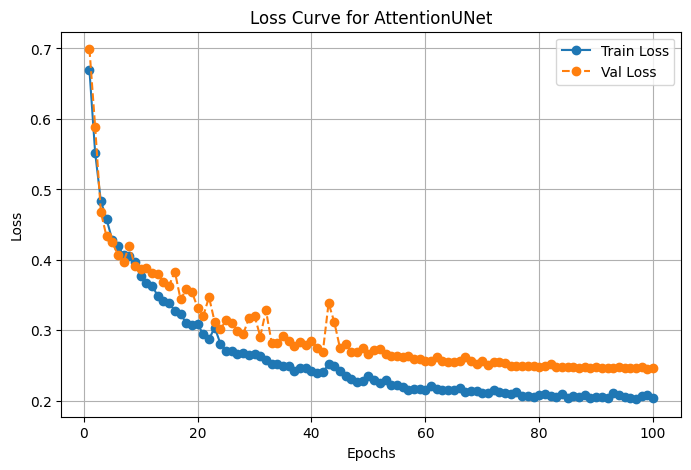

Checkpoint Loaded: /kaggle/working/model_storage/AttentionUNet.pth, Epoch: 99, Best Metric: 0.2458


Testing:  90%|█████████ | 9/10 [00:01<00:00,  6.80it/s, Loss=0.238]


Test Loss: 0.2512, Dice Score: 0.5806


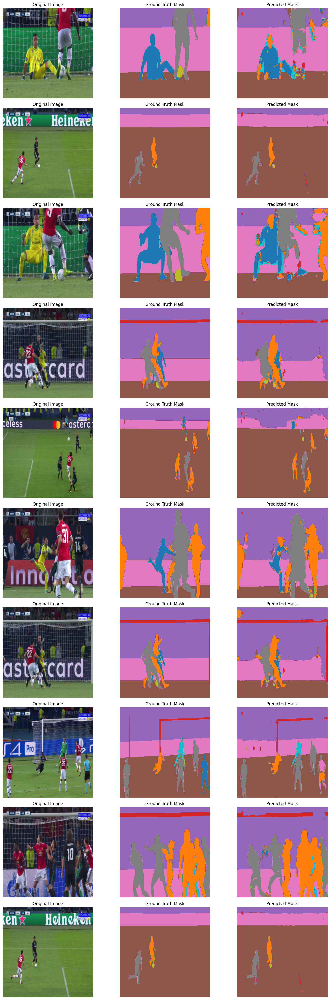

In [32]:
attention_model = AttentionUNet(num_classes=11).to(device)
num_epochs = config.num_epochs
criterion = HybridLoss(alpha=0.5, num_classes=11)
optimizer = optim.Adam(attention_model.parameters(), lr=config.lr, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)
train_model(attention_model, "AttentionUNet", train_transformed_loader, val_transformed_loader, criterion, optimizer, scheduler, num_epochs)
evaluate_model(attention_model, "AttentionUNet", test_transformed_loader, criterion)

## 4.4. Backbone(ResNet50)

In [33]:
# create U-Net  model (backnonme : ResNet-50, 11 classes )
backbone_model = smp.Unet(
    encoder_name="resnet50",      # ResNet-50
    encoder_weights="imagenet",
    in_channels=3,                #input channel  (RGB)
    classes=11                    #output classes (11)
)

print(backbone_model)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 73.4MB/s]


Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
      

No Checkpoint Found: /kaggle/working/model_storage/Backbone_UNet.pth
Start with Epoch=0, Best Metric=inf


Training 1/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.507]


Epoch [1/100], Loss: 0.5959,  Dice score: 0.2052


Validation 1/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.521]


Validation Loss: 0.5145, Dice score: 0.2698

Best Validation Metric Updated: inf -> 0.5145
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 1, Best Metric: 0.5145


Training 2/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.401]


Epoch [2/100], Loss: 0.4515,  Dice score: 0.3103


Validation 2/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.41]


Validation Loss: 0.4191, Dice score: 0.3068

Best Validation Metric Updated: 0.5145 -> 0.4191
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 2, Best Metric: 0.4191


Training 3/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.379]


Epoch [3/100], Loss: 0.3891,  Dice score: 0.3841


Validation 3/100: 100%|██████████| 2/2 [00:00<00:00,  2.82it/s, Loss=0.386]


Validation Loss: 0.3930, Dice score: 0.3210

Best Validation Metric Updated: 0.4191 -> 0.3930
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 3, Best Metric: 0.3930


Training 4/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.345]


Epoch [4/100], Loss: 0.3346,  Dice score: 0.4743


Validation 4/100: 100%|██████████| 2/2 [00:00<00:00,  3.13it/s, Loss=0.348]


Validation Loss: 0.3522, Dice score: 0.3682

Best Validation Metric Updated: 0.3930 -> 0.3522
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 4, Best Metric: 0.3522


Training 5/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.359]


Epoch [5/100], Loss: 0.3173,  Dice score: 0.4689


Validation 5/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.337]


Validation Loss: 0.3447, Dice score: 0.4009

Best Validation Metric Updated: 0.3522 -> 0.3447
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 5, Best Metric: 0.3447


Training 6/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.253]


Epoch [6/100], Loss: 0.2931,  Dice score: 0.5504


Validation 6/100: 100%|██████████| 2/2 [00:00<00:00,  2.87it/s, Loss=0.312]


Validation Loss: 0.3209, Dice score: 0.4777

Best Validation Metric Updated: 0.3447 -> 0.3209
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 6, Best Metric: 0.3209


Training 7/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.273]


Epoch [7/100], Loss: 0.2792,  Dice score: 0.5909


Validation 7/100: 100%|██████████| 2/2 [00:00<00:00,  3.09it/s, Loss=0.305]


Validation Loss: 0.3069, Dice score: 0.4845

Best Validation Metric Updated: 0.3209 -> 0.3069
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 7, Best Metric: 0.3069


Training 8/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.27]


Epoch [8/100], Loss: 0.2723,  Dice score: 0.5794


Validation 8/100: 100%|██████████| 2/2 [00:00<00:00,  3.23it/s, Loss=0.309]


Validation Loss: 0.3265, Dice score: 0.4685



Training 9/100: 100%|██████████| 16/16 [00:18<00:00,  1.17s/it, Loss=0.277]


Epoch [9/100], Loss: 0.2636,  Dice score: 0.6149


Validation 9/100: 100%|██████████| 2/2 [00:00<00:00,  3.06it/s, Loss=0.931]


Validation Loss: 0.7620, Dice score: 0.4761



Training 10/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.234]


Epoch [10/100], Loss: 0.2578,  Dice score: 0.6301


Validation 10/100: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s, Loss=0.288]


Validation Loss: 0.2965, Dice score: 0.5130

Best Validation Metric Updated: 0.3069 -> 0.2965
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 10, Best Metric: 0.2965


Training 11/100: 100%|██████████| 16/16 [00:19<00:00,  1.19s/it, Loss=0.252]


Epoch [11/100], Loss: 0.2522,  Dice score: 0.6524


Validation 11/100: 100%|██████████| 2/2 [00:00<00:00,  3.25it/s, Loss=0.303]


Validation Loss: 0.3118, Dice score: 0.5139



Training 12/100: 100%|██████████| 16/16 [00:18<00:00,  1.16s/it, Loss=0.225]


Epoch [12/100], Loss: 0.2472,  Dice score: 0.6575


Validation 12/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.325]


Validation Loss: 0.3319, Dice score: 0.4827



Training 13/100: 100%|██████████| 16/16 [00:19<00:00,  1.20s/it, Loss=0.239]


Epoch [13/100], Loss: 0.2377,  Dice score: 0.6761


Validation 13/100: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s, Loss=0.258]


Validation Loss: 0.2684, Dice score: 0.5758

Best Validation Metric Updated: 0.2965 -> 0.2684
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 13, Best Metric: 0.2684


Training 14/100: 100%|██████████| 16/16 [00:16<00:00,  1.02s/it, Loss=0.239]


Epoch [14/100], Loss: 0.2298,  Dice score: 0.6936


Validation 14/100: 100%|██████████| 2/2 [00:00<00:00,  2.87it/s, Loss=0.249]


Validation Loss: 0.2599, Dice score: 0.6259

Best Validation Metric Updated: 0.2684 -> 0.2599
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 14, Best Metric: 0.2599


Training 15/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.21]


Epoch [15/100], Loss: 0.2283,  Dice score: 0.7083


Validation 15/100: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s, Loss=0.246]


Validation Loss: 0.2654, Dice score: 0.5676



Training 16/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.217]


Epoch [16/100], Loss: 0.2334,  Dice score: 0.6985


Validation 16/100: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s, Loss=0.261]


Validation Loss: 0.2756, Dice score: 0.5641



Training 17/100: 100%|██████████| 16/16 [00:16<00:00,  1.02s/it, Loss=0.202]


Epoch [17/100], Loss: 0.2305,  Dice score: 0.7213


Validation 17/100: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, Loss=0.253]


Validation Loss: 0.2703, Dice score: 0.5791



Training 18/100: 100%|██████████| 16/16 [00:16<00:00,  1.02s/it, Loss=0.191]


Epoch [18/100], Loss: 0.2324,  Dice score: 0.7046


Validation 18/100: 100%|██████████| 2/2 [00:00<00:00,  3.24it/s, Loss=0.255]


Validation Loss: 0.2717, Dice score: 0.5789

Learning Rate Updated: 0.001000 -> 0.000500


Training 19/100: 100%|██████████| 16/16 [00:16<00:00,  1.03s/it, Loss=0.219]


Epoch [19/100], Loss: 0.2186,  Dice score: 0.7330


Validation 19/100: 100%|██████████| 2/2 [00:00<00:00,  3.30it/s, Loss=0.243]


Validation Loss: 0.2579, Dice score: 0.6029

Best Validation Metric Updated: 0.2599 -> 0.2579
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 19, Best Metric: 0.2579


Training 20/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.226]


Epoch [20/100], Loss: 0.2096,  Dice score: 0.7754


Validation 20/100: 100%|██████████| 2/2 [00:00<00:00,  3.26it/s, Loss=0.235]


Validation Loss: 0.2452, Dice score: 0.6397

Best Validation Metric Updated: 0.2579 -> 0.2452
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 20, Best Metric: 0.2452


Training 21/100: 100%|██████████| 16/16 [00:16<00:00,  1.03s/it, Loss=0.221]


Epoch [21/100], Loss: 0.2092,  Dice score: 0.7571


Validation 21/100: 100%|██████████| 2/2 [00:00<00:00,  3.24it/s, Loss=0.236]


Validation Loss: 0.2460, Dice score: 0.6315



Training 22/100: 100%|██████████| 16/16 [00:16<00:00,  1.02s/it, Loss=0.187]


Epoch [22/100], Loss: 0.2075,  Dice score: 0.7654


Validation 22/100: 100%|██████████| 2/2 [00:00<00:00,  3.24it/s, Loss=0.234]


Validation Loss: 0.2432, Dice score: 0.6424

Best Validation Metric Updated: 0.2452 -> 0.2432
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 22, Best Metric: 0.2432


Training 23/100: 100%|██████████| 16/16 [00:15<00:00,  1.02it/s, Loss=0.228]


Epoch [23/100], Loss: 0.2099,  Dice score: 0.7635


Validation 23/100: 100%|██████████| 2/2 [00:00<00:00,  3.31it/s, Loss=0.265]


Validation Loss: 0.2631, Dice score: 0.5939



Training 24/100: 100%|██████████| 16/16 [00:16<00:00,  1.03s/it, Loss=0.231]


Epoch [24/100], Loss: 0.2034,  Dice score: 0.7534


Validation 24/100: 100%|██████████| 2/2 [00:00<00:00,  3.36it/s, Loss=0.232]


Validation Loss: 0.2433, Dice score: 0.6349



Training 25/100: 100%|██████████| 16/16 [00:16<00:00,  1.02s/it, Loss=0.232]


Epoch [25/100], Loss: 0.2014,  Dice score: 0.7614


Validation 25/100: 100%|██████████| 2/2 [00:00<00:00,  3.22it/s, Loss=0.23]


Validation Loss: 0.2428, Dice score: 0.6371

Best Validation Metric Updated: 0.2432 -> 0.2428
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 25, Best Metric: 0.2428


Training 26/100: 100%|██████████| 16/16 [00:16<00:00,  1.03s/it, Loss=0.169]


Epoch [26/100], Loss: 0.2001,  Dice score: 0.7798


Validation 26/100: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s, Loss=0.234]


Validation Loss: 0.2451, Dice score: 0.6256



Training 27/100: 100%|██████████| 16/16 [00:16<00:00,  1.05s/it, Loss=0.213]


Epoch [27/100], Loss: 0.2016,  Dice score: 0.7710


Validation 27/100: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s, Loss=0.229]


Validation Loss: 0.2391, Dice score: 0.6379

Best Validation Metric Updated: 0.2428 -> 0.2391
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 27, Best Metric: 0.2391


Training 28/100: 100%|██████████| 16/16 [00:16<00:00,  1.01s/it, Loss=0.194]


Epoch [28/100], Loss: 0.2005,  Dice score: 0.7735


Validation 28/100: 100%|██████████| 2/2 [00:00<00:00,  3.22it/s, Loss=0.225]


Validation Loss: 0.2379, Dice score: 0.6552

Best Validation Metric Updated: 0.2391 -> 0.2379
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 28, Best Metric: 0.2379


Training 29/100: 100%|██████████| 16/16 [00:16<00:00,  1.05s/it, Loss=0.199]


Epoch [29/100], Loss: 0.1978,  Dice score: 0.7917


Validation 29/100: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, Loss=0.224]


Validation Loss: 0.2359, Dice score: 0.6741

Best Validation Metric Updated: 0.2379 -> 0.2359
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 29, Best Metric: 0.2359


Training 30/100: 100%|██████████| 16/16 [00:16<00:00,  1.03s/it, Loss=0.161]


Epoch [30/100], Loss: 0.2011,  Dice score: 0.7756


Validation 30/100: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s, Loss=0.231]


Validation Loss: 0.2397, Dice score: 0.6675



Training 31/100: 100%|██████████| 16/16 [00:16<00:00,  1.03s/it, Loss=0.197]


Epoch [31/100], Loss: 0.1990,  Dice score: 0.7908


Validation 31/100: 100%|██████████| 2/2 [00:00<00:00,  3.23it/s, Loss=0.211]


Validation Loss: 0.2269, Dice score: 0.7197

Best Validation Metric Updated: 0.2359 -> 0.2269
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 31, Best Metric: 0.2269


Training 32/100: 100%|██████████| 16/16 [00:15<00:00,  1.01it/s, Loss=0.213]


Epoch [32/100], Loss: 0.1966,  Dice score: 0.7854


Validation 32/100: 100%|██████████| 2/2 [00:00<00:00,  3.28it/s, Loss=0.21]


Validation Loss: 0.2242, Dice score: 0.7263

Best Validation Metric Updated: 0.2269 -> 0.2242
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 32, Best Metric: 0.2242


Training 33/100: 100%|██████████| 16/16 [00:17<00:00,  1.07s/it, Loss=0.207]


Epoch [33/100], Loss: 0.1932,  Dice score: 0.7941


Validation 33/100: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s, Loss=0.216]


Validation Loss: 0.2340, Dice score: 0.6830



Training 34/100: 100%|██████████| 16/16 [00:17<00:00,  1.11s/it, Loss=0.162]


Epoch [34/100], Loss: 0.1928,  Dice score: 0.8094


Validation 34/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.207]


Validation Loss: 0.2239, Dice score: 0.7253

Best Validation Metric Updated: 0.2242 -> 0.2239
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 34, Best Metric: 0.2239


Training 35/100: 100%|██████████| 16/16 [00:17<00:00,  1.06s/it, Loss=0.189]


Epoch [35/100], Loss: 0.1921,  Dice score: 0.8019


Validation 35/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.206]


Validation Loss: 0.2224, Dice score: 0.7355

Best Validation Metric Updated: 0.2239 -> 0.2224
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 35, Best Metric: 0.2224


Training 36/100: 100%|██████████| 16/16 [00:17<00:00,  1.09s/it, Loss=0.21]


Epoch [36/100], Loss: 0.1913,  Dice score: 0.8100


Validation 36/100: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, Loss=0.204]


Validation Loss: 0.2214, Dice score: 0.7268

Best Validation Metric Updated: 0.2224 -> 0.2214
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 36, Best Metric: 0.2214


Training 37/100: 100%|██████████| 16/16 [00:16<00:00,  1.06s/it, Loss=0.192]


Epoch [37/100], Loss: 0.1909,  Dice score: 0.8079


Validation 37/100: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s, Loss=0.209]


Validation Loss: 0.2259, Dice score: 0.7042



Training 38/100: 100%|██████████| 16/16 [00:17<00:00,  1.08s/it, Loss=0.218]


Epoch [38/100], Loss: 0.1906,  Dice score: 0.8117


Validation 38/100: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s, Loss=0.205]


Validation Loss: 0.2262, Dice score: 0.7141



Training 39/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.177]


Epoch [39/100], Loss: 0.1896,  Dice score: 0.8185


Validation 39/100: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s, Loss=0.22]


Validation Loss: 0.2323, Dice score: 0.7092



Training 40/100: 100%|██████████| 16/16 [00:17<00:00,  1.10s/it, Loss=0.19]


Epoch [40/100], Loss: 0.1902,  Dice score: 0.8115


Validation 40/100: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s, Loss=0.204]


Validation Loss: 0.2252, Dice score: 0.7147

Learning Rate Updated: 0.000500 -> 0.000250


Training 41/100: 100%|██████████| 16/16 [00:16<00:00,  1.05s/it, Loss=0.16]


Epoch [41/100], Loss: 0.1863,  Dice score: 0.8277


Validation 41/100: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s, Loss=0.203]


Validation Loss: 0.2198, Dice score: 0.7279

Best Validation Metric Updated: 0.2214 -> 0.2198
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 41, Best Metric: 0.2198


Training 42/100: 100%|██████████| 16/16 [00:16<00:00,  1.06s/it, Loss=0.153]


Epoch [42/100], Loss: 0.1837,  Dice score: 0.8254


Validation 42/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.201]


Validation Loss: 0.2202, Dice score: 0.7335



Training 43/100: 100%|██████████| 16/16 [00:17<00:00,  1.08s/it, Loss=0.206]


Epoch [43/100], Loss: 0.1864,  Dice score: 0.8273


Validation 43/100: 100%|██████████| 2/2 [00:00<00:00,  3.09it/s, Loss=0.202]


Validation Loss: 0.2202, Dice score: 0.7316



Training 44/100: 100%|██████████| 16/16 [00:16<00:00,  1.03s/it, Loss=0.19]


Epoch [44/100], Loss: 0.1821,  Dice score: 0.8406


Validation 44/100: 100%|██████████| 2/2 [00:00<00:00,  2.92it/s, Loss=0.199]


Validation Loss: 0.2189, Dice score: 0.7424

Best Validation Metric Updated: 0.2198 -> 0.2189
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 44, Best Metric: 0.2189


Training 45/100: 100%|██████████| 16/16 [00:17<00:00,  1.11s/it, Loss=0.224]


Epoch [45/100], Loss: 0.1867,  Dice score: 0.8279


Validation 45/100: 100%|██████████| 2/2 [00:00<00:00,  3.06it/s, Loss=0.206]


Validation Loss: 0.2214, Dice score: 0.7250



Training 46/100: 100%|██████████| 16/16 [00:17<00:00,  1.07s/it, Loss=0.201]


Epoch [46/100], Loss: 0.1819,  Dice score: 0.8440


Validation 46/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.2]


Validation Loss: 0.2205, Dice score: 0.7368



Training 47/100: 100%|██████████| 16/16 [00:17<00:00,  1.10s/it, Loss=0.15]


Epoch [47/100], Loss: 0.1827,  Dice score: 0.8329


Validation 47/100: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, Loss=0.201]


Validation Loss: 0.2194, Dice score: 0.7339



Training 48/100: 100%|██████████| 16/16 [00:17<00:00,  1.07s/it, Loss=0.163]


Epoch [48/100], Loss: 0.1858,  Dice score: 0.8321


Validation 48/100: 100%|██████████| 2/2 [00:00<00:00,  3.06it/s, Loss=0.201]


Validation Loss: 0.2197, Dice score: 0.7369

Learning Rate Updated: 0.000250 -> 0.000125


Training 49/100: 100%|██████████| 16/16 [00:17<00:00,  1.08s/it, Loss=0.194]


Epoch [49/100], Loss: 0.1802,  Dice score: 0.8509


Validation 49/100: 100%|██████████| 2/2 [00:00<00:00,  3.22it/s, Loss=0.199]


Validation Loss: 0.2168, Dice score: 0.7439

Best Validation Metric Updated: 0.2189 -> 0.2168
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 49, Best Metric: 0.2168


Training 50/100: 100%|██████████| 16/16 [00:17<00:00,  1.07s/it, Loss=0.217]


Epoch [50/100], Loss: 0.1809,  Dice score: 0.8376


Validation 50/100: 100%|██████████| 2/2 [00:00<00:00,  3.21it/s, Loss=0.198]


Validation Loss: 0.2142, Dice score: 0.7536

Best Validation Metric Updated: 0.2168 -> 0.2142
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 50, Best Metric: 0.2142


Training 51/100: 100%|██████████| 16/16 [00:16<00:00,  1.00s/it, Loss=0.157]


Epoch [51/100], Loss: 0.1809,  Dice score: 0.8347


Validation 51/100: 100%|██████████| 2/2 [00:00<00:00,  3.31it/s, Loss=0.198]


Validation Loss: 0.2161, Dice score: 0.7492



Training 52/100: 100%|██████████| 16/16 [00:16<00:00,  1.03s/it, Loss=0.17]


Epoch [52/100], Loss: 0.1805,  Dice score: 0.8545


Validation 52/100: 100%|██████████| 2/2 [00:00<00:00,  3.33it/s, Loss=0.198]


Validation Loss: 0.2147, Dice score: 0.7527



Training 53/100: 100%|██████████| 16/16 [00:16<00:00,  1.05s/it, Loss=0.197]


Epoch [53/100], Loss: 0.1786,  Dice score: 0.8605


Validation 53/100: 100%|██████████| 2/2 [00:00<00:00,  3.23it/s, Loss=0.198]


Validation Loss: 0.2151, Dice score: 0.7522



Training 54/100: 100%|██████████| 16/16 [00:16<00:00,  1.03s/it, Loss=0.162]


Epoch [54/100], Loss: 0.1767,  Dice score: 0.8530


Validation 54/100: 100%|██████████| 2/2 [00:00<00:00,  3.29it/s, Loss=0.196]


Validation Loss: 0.2132, Dice score: 0.7533

Best Validation Metric Updated: 0.2142 -> 0.2132
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 54, Best Metric: 0.2132


Training 55/100: 100%|██████████| 16/16 [00:15<00:00,  1.00it/s, Loss=0.173]


Epoch [55/100], Loss: 0.1774,  Dice score: 0.8527


Validation 55/100: 100%|██████████| 2/2 [00:00<00:00,  3.31it/s, Loss=0.197]


Validation Loss: 0.2144, Dice score: 0.7481



Training 56/100: 100%|██████████| 16/16 [00:16<00:00,  1.05s/it, Loss=0.17]


Epoch [56/100], Loss: 0.1789,  Dice score: 0.8565


Validation 56/100: 100%|██████████| 2/2 [00:00<00:00,  3.23it/s, Loss=0.197]


Validation Loss: 0.2143, Dice score: 0.7440



Training 57/100: 100%|██████████| 16/16 [00:16<00:00,  1.01s/it, Loss=0.207]


Epoch [57/100], Loss: 0.1767,  Dice score: 0.8618


Validation 57/100: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s, Loss=0.197]


Validation Loss: 0.2165, Dice score: 0.7451



Training 58/100: 100%|██████████| 16/16 [00:16<00:00,  1.01s/it, Loss=0.152]


Epoch [58/100], Loss: 0.1796,  Dice score: 0.8593


Validation 58/100: 100%|██████████| 2/2 [00:00<00:00,  3.28it/s, Loss=0.197]


Validation Loss: 0.2150, Dice score: 0.7564

Learning Rate Updated: 0.000125 -> 0.000063


Training 59/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.133]


Epoch [59/100], Loss: 0.1770,  Dice score: 0.8343


Validation 59/100: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s, Loss=0.195]


Validation Loss: 0.2155, Dice score: 0.7543



Training 60/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.194]


Epoch [60/100], Loss: 0.1761,  Dice score: 0.8624


Validation 60/100: 100%|██████████| 2/2 [00:00<00:00,  3.25it/s, Loss=0.195]


Validation Loss: 0.2150, Dice score: 0.7547



Training 61/100: 100%|██████████| 16/16 [00:16<00:00,  1.02s/it, Loss=0.186]


Epoch [61/100], Loss: 0.1775,  Dice score: 0.8492


Validation 61/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.195]


Validation Loss: 0.2129, Dice score: 0.7586

Best Validation Metric Updated: 0.2132 -> 0.2129
Checkpint Saved: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 61, Best Metric: 0.2129


Training 62/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.193]


Epoch [62/100], Loss: 0.1811,  Dice score: 0.8453


Validation 62/100: 100%|██████████| 2/2 [00:00<00:00,  3.30it/s, Loss=0.197]


Validation Loss: 0.2145, Dice score: 0.7512



Training 63/100: 100%|██████████| 16/16 [00:16<00:00,  1.03s/it, Loss=0.162]


Epoch [63/100], Loss: 0.1767,  Dice score: 0.8630


Validation 63/100: 100%|██████████| 2/2 [00:00<00:00,  3.28it/s, Loss=0.195]


Validation Loss: 0.2157, Dice score: 0.7507



Training 64/100: 100%|██████████| 16/16 [00:16<00:00,  1.02s/it, Loss=0.198]


Epoch [64/100], Loss: 0.1779,  Dice score: 0.8395


Validation 64/100: 100%|██████████| 2/2 [00:00<00:00,  3.23it/s, Loss=0.194]


Validation Loss: 0.2155, Dice score: 0.7532



Training 65/100: 100%|██████████| 16/16 [00:16<00:00,  1.05s/it, Loss=0.186]


Epoch [65/100], Loss: 0.1758,  Dice score: 0.8594


Validation 65/100: 100%|██████████| 2/2 [00:00<00:00,  3.29it/s, Loss=0.193]


Validation Loss: 0.2134, Dice score: 0.7578

Learning Rate Updated: 0.000063 -> 0.000031


Training 66/100: 100%|██████████| 16/16 [00:15<00:00,  1.02it/s, Loss=0.173]


Epoch [66/100], Loss: 0.1762,  Dice score: 0.8548


Validation 66/100: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s, Loss=0.193]


Validation Loss: 0.2135, Dice score: 0.7578



Training 67/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.157]


Epoch [67/100], Loss: 0.1749,  Dice score: 0.8696


Validation 67/100: 100%|██████████| 2/2 [00:00<00:00,  3.25it/s, Loss=0.193]


Validation Loss: 0.2134, Dice score: 0.7601



Training 68/100: 100%|██████████| 16/16 [00:15<00:00,  1.01it/s, Loss=0.164]


Epoch [68/100], Loss: 0.1755,  Dice score: 0.8529


Validation 68/100: 100%|██████████| 2/2 [00:00<00:00,  3.29it/s, Loss=0.193]


Validation Loss: 0.2138, Dice score: 0.7595



Training 69/100: 100%|██████████| 16/16 [00:17<00:00,  1.06s/it, Loss=0.19]


Epoch [69/100], Loss: 0.1739,  Dice score: 0.8635


Validation 69/100: 100%|██████████| 2/2 [00:00<00:00,  3.27it/s, Loss=0.193]


Validation Loss: 0.2141, Dice score: 0.7575

Learning Rate Updated: 0.000031 -> 0.000016


Training 70/100: 100%|██████████| 16/16 [00:16<00:00,  1.02s/it, Loss=0.163]


Epoch [70/100], Loss: 0.1741,  Dice score: 0.8635


Validation 70/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.193]


Validation Loss: 0.2135, Dice score: 0.7595



Training 71/100: 100%|██████████| 16/16 [00:15<00:00,  1.01it/s, Loss=0.17]


Epoch [71/100], Loss: 0.1758,  Dice score: 0.8616


Validation 71/100: 100%|██████████| 2/2 [00:00<00:00,  3.25it/s, Loss=0.192]


Validation Loss: 0.2132, Dice score: 0.7586



Training 72/100: 100%|██████████| 16/16 [00:15<00:00,  1.01it/s, Loss=0.169]


Epoch [72/100], Loss: 0.1735,  Dice score: 0.8742


Validation 72/100: 100%|██████████| 2/2 [00:00<00:00,  3.30it/s, Loss=0.192]


Validation Loss: 0.2130, Dice score: 0.7579



Training 73/100: 100%|██████████| 16/16 [00:16<00:00,  1.02s/it, Loss=0.173]


Epoch [73/100], Loss: 0.1747,  Dice score: 0.8628


Validation 73/100: 100%|██████████| 2/2 [00:00<00:00,  3.31it/s, Loss=0.193]


Validation Loss: 0.2141, Dice score: 0.7578

Learning Rate Updated: 0.000016 -> 0.000008


Training 74/100: 100%|██████████| 16/16 [00:16<00:00,  1.02s/it, Loss=0.153]


Epoch [74/100], Loss: 0.1730,  Dice score: 0.8631


Validation 74/100: 100%|██████████| 2/2 [00:00<00:00,  3.28it/s, Loss=0.192]


Validation Loss: 0.2131, Dice score: 0.7586



Training 75/100: 100%|██████████| 16/16 [00:16<00:00,  1.00s/it, Loss=0.159]


Epoch [75/100], Loss: 0.1739,  Dice score: 0.8703


Validation 75/100: 100%|██████████| 2/2 [00:00<00:00,  3.24it/s, Loss=0.192]


Validation Loss: 0.2135, Dice score: 0.7580



Training 76/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.213]


Epoch [76/100], Loss: 0.1753,  Dice score: 0.8560


Validation 76/100: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, Loss=0.193]


Validation Loss: 0.2141, Dice score: 0.7564



Training 77/100: 100%|██████████| 16/16 [00:16<00:00,  1.01s/it, Loss=0.161]


Epoch [77/100], Loss: 0.1738,  Dice score: 0.8671


Validation 77/100: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s, Loss=0.193]


Validation Loss: 0.2144, Dice score: 0.7567

Learning Rate Updated: 0.000008 -> 0.000004


Training 78/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.174]


Epoch [78/100], Loss: 0.1733,  Dice score: 0.8577


Validation 78/100: 100%|██████████| 2/2 [00:00<00:00,  3.25it/s, Loss=0.193]


Validation Loss: 0.2143, Dice score: 0.7564



Training 79/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.179]


Epoch [79/100], Loss: 0.1747,  Dice score: 0.8643


Validation 79/100: 100%|██████████| 2/2 [00:00<00:00,  3.27it/s, Loss=0.193]


Validation Loss: 0.2141, Dice score: 0.7574



Training 80/100: 100%|██████████| 16/16 [00:16<00:00,  1.05s/it, Loss=0.178]


Epoch [80/100], Loss: 0.1762,  Dice score: 0.8631


Validation 80/100: 100%|██████████| 2/2 [00:00<00:00,  3.32it/s, Loss=0.193]


Validation Loss: 0.2145, Dice score: 0.7569



Training 81/100: 100%|██████████| 16/16 [00:16<00:00,  1.01s/it, Loss=0.154]


Epoch [81/100], Loss: 0.1737,  Dice score: 0.8501


Validation 81/100: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s, Loss=0.192]


Validation Loss: 0.2140, Dice score: 0.7565

Learning Rate Updated: 0.000004 -> 0.000002


Training 82/100: 100%|██████████| 16/16 [00:16<00:00,  1.03s/it, Loss=0.213]


Epoch [82/100], Loss: 0.1749,  Dice score: 0.8630


Validation 82/100: 100%|██████████| 2/2 [00:00<00:00,  3.21it/s, Loss=0.193]


Validation Loss: 0.2145, Dice score: 0.7558



Training 83/100: 100%|██████████| 16/16 [00:15<00:00,  1.00it/s, Loss=0.216]


Epoch [83/100], Loss: 0.1752,  Dice score: 0.8652


Validation 83/100: 100%|██████████| 2/2 [00:00<00:00,  3.23it/s, Loss=0.193]


Validation Loss: 0.2144, Dice score: 0.7559



Training 84/100: 100%|██████████| 16/16 [00:16<00:00,  1.02s/it, Loss=0.184]


Epoch [84/100], Loss: 0.1739,  Dice score: 0.8566


Validation 84/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.192]


Validation Loss: 0.2142, Dice score: 0.7560



Training 85/100: 100%|██████████| 16/16 [00:15<00:00,  1.01it/s, Loss=0.153]


Epoch [85/100], Loss: 0.1740,  Dice score: 0.8634


Validation 85/100: 100%|██████████| 2/2 [00:00<00:00,  2.98it/s, Loss=0.193]


Validation Loss: 0.2147, Dice score: 0.7559

Learning Rate Updated: 0.000002 -> 0.000001


Training 86/100: 100%|██████████| 16/16 [00:16<00:00,  1.02s/it, Loss=0.198]


Epoch [86/100], Loss: 0.1736,  Dice score: 0.8482


Validation 86/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.192]


Validation Loss: 0.2141, Dice score: 0.7568



Training 87/100: 100%|██████████| 16/16 [00:16<00:00,  1.03s/it, Loss=0.173]


Epoch [87/100], Loss: 0.1758,  Dice score: 0.8385


Validation 87/100: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s, Loss=0.193]


Validation Loss: 0.2143, Dice score: 0.7570



Training 88/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.155]


Epoch [88/100], Loss: 0.1743,  Dice score: 0.8682


Validation 88/100: 100%|██████████| 2/2 [00:00<00:00,  3.23it/s, Loss=0.192]


Validation Loss: 0.2143, Dice score: 0.7567



Training 89/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.147]


Epoch [89/100], Loss: 0.1749,  Dice score: 0.8569


Validation 89/100: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, Loss=0.192]


Validation Loss: 0.2140, Dice score: 0.7572



Training 90/100: 100%|██████████| 16/16 [00:15<00:00,  1.00it/s, Loss=0.104]


Epoch [90/100], Loss: 0.1764,  Dice score: 0.8419


Validation 90/100: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s, Loss=0.193]


Validation Loss: 0.2143, Dice score: 0.7571



Training 91/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.215]


Epoch [91/100], Loss: 0.1769,  Dice score: 0.8488


Validation 91/100: 100%|██████████| 2/2 [00:00<00:00,  2.79it/s, Loss=0.193]


Validation Loss: 0.2145, Dice score: 0.7566



Training 92/100: 100%|██████████| 16/16 [00:16<00:00,  1.03s/it, Loss=0.175]


Epoch [92/100], Loss: 0.1750,  Dice score: 0.8644


Validation 92/100: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s, Loss=0.193]


Validation Loss: 0.2147, Dice score: 0.7570



Training 93/100: 100%|██████████| 16/16 [00:17<00:00,  1.09s/it, Loss=0.168]


Epoch [93/100], Loss: 0.1748,  Dice score: 0.8546


Validation 93/100: 100%|██████████| 2/2 [00:00<00:00,  3.06it/s, Loss=0.192]


Validation Loss: 0.2143, Dice score: 0.7563



Training 94/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.158]


Epoch [94/100], Loss: 0.1739,  Dice score: 0.8645


Validation 94/100: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s, Loss=0.192]


Validation Loss: 0.2145, Dice score: 0.7559



Training 95/100: 100%|██████████| 16/16 [00:16<00:00,  1.05s/it, Loss=0.137]


Epoch [95/100], Loss: 0.1744,  Dice score: 0.8655


Validation 95/100: 100%|██████████| 2/2 [00:00<00:00,  3.21it/s, Loss=0.192]


Validation Loss: 0.2142, Dice score: 0.7570



Training 96/100: 100%|██████████| 16/16 [00:16<00:00,  1.04s/it, Loss=0.182]


Epoch [96/100], Loss: 0.1743,  Dice score: 0.8721


Validation 96/100: 100%|██████████| 2/2 [00:00<00:00,  3.00it/s, Loss=0.192]


Validation Loss: 0.2142, Dice score: 0.7570



Training 97/100: 100%|██████████| 16/16 [00:16<00:00,  1.06s/it, Loss=0.202]


Epoch [97/100], Loss: 0.1742,  Dice score: 0.8679


Validation 97/100: 100%|██████████| 2/2 [00:00<00:00,  3.24it/s, Loss=0.192]


Validation Loss: 0.2141, Dice score: 0.7573



Training 98/100: 100%|██████████| 16/16 [00:16<00:00,  1.01s/it, Loss=0.171]


Epoch [98/100], Loss: 0.1746,  Dice score: 0.8730


Validation 98/100: 100%|██████████| 2/2 [00:00<00:00,  3.26it/s, Loss=0.192]


Validation Loss: 0.2142, Dice score: 0.7563



Training 99/100: 100%|██████████| 16/16 [00:17<00:00,  1.07s/it, Loss=0.139]


Epoch [99/100], Loss: 0.1756,  Dice score: 0.8503


Validation 99/100: 100%|██████████| 2/2 [00:00<00:00,  3.26it/s, Loss=0.193]


Validation Loss: 0.2146, Dice score: 0.7557



Training 100/100: 100%|██████████| 16/16 [00:15<00:00,  1.00it/s, Loss=0.139]


Epoch [100/100], Loss: 0.1752,  Dice score: 0.8663


Validation 100/100: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s, Loss=0.193]

Validation Loss: 0.2143, Dice score: 0.7565



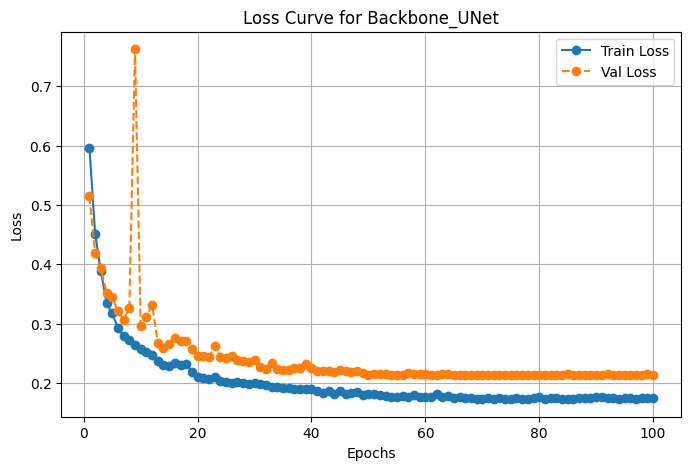

Checkpoint Loaded: /kaggle/working/model_storage/Backbone_UNet.pth, Epoch: 61, Best Metric: 0.2129


Testing:  90%|█████████ | 9/10 [00:01<00:00,  7.26it/s, Loss=0.237]


Test Loss: 0.2274, Dice Score: 0.6495


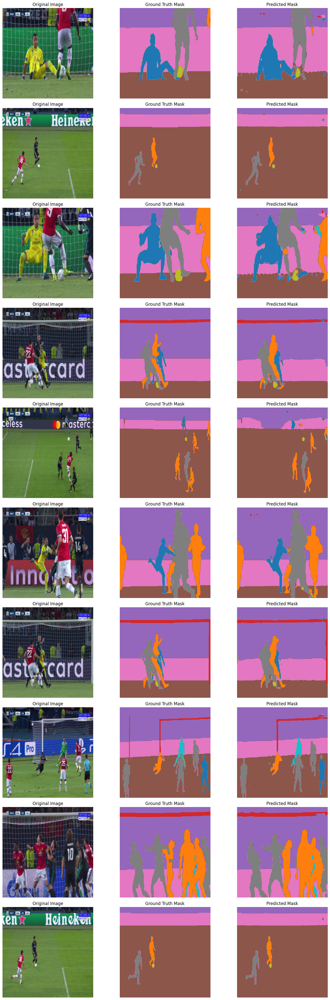

In [34]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
backbone_model = backbone_model.to(device)

params = [p for p in backbone_model.parameters() if p.requires_grad]
num_epochs = config.num_epochs
criterion = HybridLoss(alpha=0.5, num_classes=11)
optimizer = optim.Adam(params, lr=config.lr, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, threshold=1e-4, min_lr=1e-6)
train_model(backbone_model, "Backbone_UNet", train_transformed_loader, val_transformed_loader, criterion, optimizer, scheduler, num_epochs)
evaluate_model(backbone_model, "Backbone_UNet", test_transformed_loader, criterion)

## 4.5 ResNet101

In [35]:
# Create U-Net model with ResNet-101 backbone
resnet101_model = smp.Unet(
    encoder_name="resnet101",      # ResNet-101 backbone
    encoder_weights="imagenet",    # Pretrained on ImageNet
    in_channels=3,                 # RGB input
    classes=11                     # 11 output classes
)

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth
100%|██████████| 170M/170M [00:00<00:00, 450MB/s]


No Checkpoint Found: /kaggle/working/model_storage/ResNet101_UNet.pth
Start with Epoch=0, Best Metric=inf


Training 1/100: 100%|██████████| 16/16 [00:21<00:00,  1.34s/it, Loss=0.467]


Epoch [1/100], Loss: 0.5638,  Dice score: 0.2587


Validation 1/100: 100%|██████████| 2/2 [00:00<00:00,  2.66it/s, Loss=1.31]


Validation Loss: 1.4201, Dice score: 0.0869

Best Validation Metric Updated: inf -> 1.4201
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 1, Best Metric: 1.4201


Training 2/100: 100%|██████████| 16/16 [00:21<00:00,  1.36s/it, Loss=0.395]


Epoch [2/100], Loss: 0.4248,  Dice score: 0.3872


Validation 2/100: 100%|██████████| 2/2 [00:00<00:00,  3.07it/s, Loss=0.575]


Validation Loss: 0.5733, Dice score: 0.2390

Best Validation Metric Updated: 1.4201 -> 0.5733
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 2, Best Metric: 0.5733


Training 3/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.358]


Epoch [3/100], Loss: 0.3686,  Dice score: 0.4523


Validation 3/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.357]


Validation Loss: 0.3578, Dice score: 0.3744

Best Validation Metric Updated: 0.5733 -> 0.3578
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 3, Best Metric: 0.3578


Training 4/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.354]


Epoch [4/100], Loss: 0.3331,  Dice score: 0.4713


Validation 4/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.535]


Validation Loss: 0.4638, Dice score: 0.3081



Training 5/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.297]


Epoch [5/100], Loss: 0.3164,  Dice score: 0.4886


Validation 5/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.35]


Validation Loss: 0.3569, Dice score: 0.3703

Best Validation Metric Updated: 0.3578 -> 0.3569
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 5, Best Metric: 0.3569


Training 6/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.306]


Epoch [6/100], Loss: 0.3038,  Dice score: 0.5446


Validation 6/100: 100%|██████████| 2/2 [00:00<00:00,  3.24it/s, Loss=0.446]


Validation Loss: 0.4322, Dice score: 0.3715



Training 7/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.274]


Epoch [7/100], Loss: 0.3001,  Dice score: 0.5419


Validation 7/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.323]


Validation Loss: 0.3305, Dice score: 0.4658

Best Validation Metric Updated: 0.3569 -> 0.3305
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 7, Best Metric: 0.3305


Training 8/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.258]


Epoch [8/100], Loss: 0.2880,  Dice score: 0.5912


Validation 8/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.384]


Validation Loss: 0.3750, Dice score: 0.4005



Training 9/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.287]


Epoch [9/100], Loss: 0.2766,  Dice score: 0.6128


Validation 9/100: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s, Loss=1.74]


Validation Loss: 1.6902, Dice score: 0.3066



Training 10/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.274]


Epoch [10/100], Loss: 0.2623,  Dice score: 0.6452


Validation 10/100: 100%|██████████| 2/2 [00:00<00:00,  3.24it/s, Loss=0.281]


Validation Loss: 0.2898, Dice score: 0.5129

Best Validation Metric Updated: 0.3305 -> 0.2898
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 10, Best Metric: 0.2898


Training 11/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.236]


Epoch [11/100], Loss: 0.2604,  Dice score: 0.6674


Validation 11/100: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s, Loss=0.291]


Validation Loss: 0.2990, Dice score: 0.5251



Training 12/100: 100%|██████████| 16/16 [00:20<00:00,  1.27s/it, Loss=0.218]


Epoch [12/100], Loss: 0.2469,  Dice score: 0.6878


Validation 12/100: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, Loss=0.292]


Validation Loss: 0.2918, Dice score: 0.5405



Training 13/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.268]


Epoch [13/100], Loss: 0.2472,  Dice score: 0.6687


Validation 13/100: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, Loss=0.26]


Validation Loss: 0.2738, Dice score: 0.5648

Best Validation Metric Updated: 0.2898 -> 0.2738
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 13, Best Metric: 0.2738


Training 14/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.231]


Epoch [14/100], Loss: 0.2400,  Dice score: 0.7025


Validation 14/100: 100%|██████████| 2/2 [00:00<00:00,  2.97it/s, Loss=0.26]


Validation Loss: 0.2757, Dice score: 0.5523



Training 15/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.284]


Epoch [15/100], Loss: 0.2375,  Dice score: 0.6952


Validation 15/100: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s, Loss=0.255]


Validation Loss: 0.2703, Dice score: 0.5751

Best Validation Metric Updated: 0.2738 -> 0.2703
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 15, Best Metric: 0.2703


Training 16/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.237]


Epoch [16/100], Loss: 0.2311,  Dice score: 0.7184


Validation 16/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.272]


Validation Loss: 0.2849, Dice score: 0.5419



Training 17/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.247]


Epoch [17/100], Loss: 0.2337,  Dice score: 0.7261


Validation 17/100: 100%|██████████| 2/2 [00:00<00:00,  3.13it/s, Loss=0.266]


Validation Loss: 0.2790, Dice score: 0.5449



Training 18/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.221]


Epoch [18/100], Loss: 0.2329,  Dice score: 0.7318


Validation 18/100: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s, Loss=0.255]


Validation Loss: 0.2692, Dice score: 0.5874

Best Validation Metric Updated: 0.2703 -> 0.2692
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 18, Best Metric: 0.2692


Training 19/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.261]


Epoch [19/100], Loss: 0.2294,  Dice score: 0.7218


Validation 19/100: 100%|██████████| 2/2 [00:00<00:00,  3.22it/s, Loss=0.254]


Validation Loss: 0.2714, Dice score: 0.6039



Training 20/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.186]


Epoch [20/100], Loss: 0.2246,  Dice score: 0.7343


Validation 20/100: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s, Loss=0.257]


Validation Loss: 0.2734, Dice score: 0.5866



Training 21/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.231]


Epoch [21/100], Loss: 0.2293,  Dice score: 0.7151


Validation 21/100: 100%|██████████| 2/2 [00:00<00:00,  3.10it/s, Loss=0.278]


Validation Loss: 0.2838, Dice score: 0.5579



Training 22/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.2]


Epoch [22/100], Loss: 0.2314,  Dice score: 0.7384


Validation 22/100: 100%|██████████| 2/2 [00:00<00:00,  3.23it/s, Loss=0.307]


Validation Loss: 0.3145, Dice score: 0.5296

Learning Rate Updated: 0.001000 -> 0.000500


Training 23/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.228]


Epoch [23/100], Loss: 0.2160,  Dice score: 0.7624


Validation 23/100: 100%|██████████| 2/2 [00:00<00:00,  3.21it/s, Loss=0.239]


Validation Loss: 0.2563, Dice score: 0.6143

Best Validation Metric Updated: 0.2692 -> 0.2563
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 23, Best Metric: 0.2563


Training 24/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.242]


Epoch [24/100], Loss: 0.2135,  Dice score: 0.7598


Validation 24/100: 100%|██████████| 2/2 [00:00<00:00,  2.88it/s, Loss=0.235]


Validation Loss: 0.2477, Dice score: 0.6306

Best Validation Metric Updated: 0.2563 -> 0.2477
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 24, Best Metric: 0.2477


Training 25/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.204]


Epoch [25/100], Loss: 0.2095,  Dice score: 0.7667


Validation 25/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.234]


Validation Loss: 0.2446, Dice score: 0.6381

Best Validation Metric Updated: 0.2477 -> 0.2446
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 25, Best Metric: 0.2446


Training 26/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.203]


Epoch [26/100], Loss: 0.2024,  Dice score: 0.7893


Validation 26/100: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, Loss=0.231]


Validation Loss: 0.2433, Dice score: 0.6370

Best Validation Metric Updated: 0.2446 -> 0.2433
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 26, Best Metric: 0.2433


Training 27/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.186]


Epoch [27/100], Loss: 0.2026,  Dice score: 0.8006


Validation 27/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.234]


Validation Loss: 0.2465, Dice score: 0.6215



Training 28/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.211]


Epoch [28/100], Loss: 0.2017,  Dice score: 0.7963


Validation 28/100: 100%|██████████| 2/2 [00:00<00:00,  3.24it/s, Loss=0.233]


Validation Loss: 0.2489, Dice score: 0.6237



Training 29/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.257]


Epoch [29/100], Loss: 0.2008,  Dice score: 0.7963


Validation 29/100: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s, Loss=0.23]


Validation Loss: 0.2384, Dice score: 0.6514

Best Validation Metric Updated: 0.2433 -> 0.2384
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 29, Best Metric: 0.2384


Training 30/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.191]


Epoch [30/100], Loss: 0.2006,  Dice score: 0.7894


Validation 30/100: 100%|██████████| 2/2 [00:00<00:00,  2.94it/s, Loss=0.229]


Validation Loss: 0.2409, Dice score: 0.6436



Training 31/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.207]


Epoch [31/100], Loss: 0.1989,  Dice score: 0.7848


Validation 31/100: 100%|██████████| 2/2 [00:00<00:00,  3.12it/s, Loss=0.227]


Validation Loss: 0.2382, Dice score: 0.6523

Best Validation Metric Updated: 0.2384 -> 0.2382
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 31, Best Metric: 0.2382


Training 32/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.168]


Epoch [32/100], Loss: 0.1976,  Dice score: 0.7789


Validation 32/100: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s, Loss=0.234]


Validation Loss: 0.2429, Dice score: 0.6426



Training 33/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.186]


Epoch [33/100], Loss: 0.1973,  Dice score: 0.7917


Validation 33/100: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s, Loss=0.229]


Validation Loss: 0.2396, Dice score: 0.6362



Training 34/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.188]


Epoch [34/100], Loss: 0.1998,  Dice score: 0.7704


Validation 34/100: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s, Loss=0.228]


Validation Loss: 0.2407, Dice score: 0.6448



Training 35/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.211]


Epoch [35/100], Loss: 0.1974,  Dice score: 0.7637


Validation 35/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.223]


Validation Loss: 0.2356, Dice score: 0.6636

Best Validation Metric Updated: 0.2382 -> 0.2356
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 35, Best Metric: 0.2356


Training 36/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.202]


Epoch [36/100], Loss: 0.1949,  Dice score: 0.7834


Validation 36/100: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s, Loss=0.218]


Validation Loss: 0.2325, Dice score: 0.6896

Best Validation Metric Updated: 0.2356 -> 0.2325
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 36, Best Metric: 0.2325


Training 37/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.171]


Epoch [37/100], Loss: 0.1940,  Dice score: 0.7797


Validation 37/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.22]


Validation Loss: 0.2330, Dice score: 0.6844



Training 38/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.219]


Epoch [38/100], Loss: 0.1928,  Dice score: 0.8086


Validation 38/100: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s, Loss=0.216]


Validation Loss: 0.2290, Dice score: 0.6917

Best Validation Metric Updated: 0.2325 -> 0.2290
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 38, Best Metric: 0.2290


Training 39/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.185]


Epoch [39/100], Loss: 0.1945,  Dice score: 0.8107


Validation 39/100: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s, Loss=0.221]


Validation Loss: 0.2326, Dice score: 0.6754



Training 40/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.208]


Epoch [40/100], Loss: 0.1896,  Dice score: 0.8040


Validation 40/100: 100%|██████████| 2/2 [00:00<00:00,  2.76it/s, Loss=0.213]


Validation Loss: 0.2275, Dice score: 0.6922

Best Validation Metric Updated: 0.2290 -> 0.2275
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 40, Best Metric: 0.2275


Training 41/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.182]


Epoch [41/100], Loss: 0.1883,  Dice score: 0.8275


Validation 41/100: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, Loss=0.212]


Validation Loss: 0.2274, Dice score: 0.6991

Best Validation Metric Updated: 0.2275 -> 0.2274
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 41, Best Metric: 0.2274


Training 42/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.18]


Epoch [42/100], Loss: 0.1885,  Dice score: 0.8004


Validation 42/100: 100%|██████████| 2/2 [00:00<00:00,  3.09it/s, Loss=0.222]


Validation Loss: 0.2358, Dice score: 0.6723



Training 43/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.225]


Epoch [43/100], Loss: 0.1931,  Dice score: 0.7974


Validation 43/100: 100%|██████████| 2/2 [00:00<00:00,  3.04it/s, Loss=0.24]


Validation Loss: 0.2482, Dice score: 0.6573



Training 44/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.155]


Epoch [44/100], Loss: 0.1952,  Dice score: 0.7879


Validation 44/100: 100%|██████████| 2/2 [00:00<00:00,  3.11it/s, Loss=0.224]


Validation Loss: 0.2432, Dice score: 0.6714

Learning Rate Updated: 0.000500 -> 0.000250


Training 45/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.192]


Epoch [45/100], Loss: 0.1892,  Dice score: 0.8139


Validation 45/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.214]


Validation Loss: 0.2272, Dice score: 0.6958

Best Validation Metric Updated: 0.2274 -> 0.2272
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 45, Best Metric: 0.2272


Training 46/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.165]


Epoch [46/100], Loss: 0.1882,  Dice score: 0.8213


Validation 46/100: 100%|██████████| 2/2 [00:00<00:00,  2.99it/s, Loss=0.212]


Validation Loss: 0.2264, Dice score: 0.6947

Best Validation Metric Updated: 0.2272 -> 0.2264
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 46, Best Metric: 0.2264


Training 47/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.18]


Epoch [47/100], Loss: 0.1851,  Dice score: 0.8228


Validation 47/100: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s, Loss=0.208]


Validation Loss: 0.2234, Dice score: 0.7103

Best Validation Metric Updated: 0.2264 -> 0.2234
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 47, Best Metric: 0.2234


Training 48/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.194]


Epoch [48/100], Loss: 0.1877,  Dice score: 0.8411


Validation 48/100: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s, Loss=0.211]


Validation Loss: 0.2244, Dice score: 0.6925



Training 49/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.172]


Epoch [49/100], Loss: 0.1861,  Dice score: 0.8184


Validation 49/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.209]


Validation Loss: 0.2259, Dice score: 0.7025



Training 50/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.167]


Epoch [50/100], Loss: 0.1834,  Dice score: 0.8216


Validation 50/100: 100%|██████████| 2/2 [00:00<00:00,  3.22it/s, Loss=0.211]


Validation Loss: 0.2271, Dice score: 0.6948



Training 51/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.204]


Epoch [51/100], Loss: 0.1850,  Dice score: 0.8289


Validation 51/100: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s, Loss=0.21]


Validation Loss: 0.2234, Dice score: 0.7000

Learning Rate Updated: 0.000250 -> 0.000125
Best Validation Metric Updated: 0.2234 -> 0.2234
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 51, Best Metric: 0.2234


Training 52/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.23]


Epoch [52/100], Loss: 0.1843,  Dice score: 0.8246


Validation 52/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.212]


Validation Loss: 0.2279, Dice score: 0.6940



Training 53/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.219]


Epoch [53/100], Loss: 0.1823,  Dice score: 0.8494


Validation 53/100: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s, Loss=0.211]


Validation Loss: 0.2261, Dice score: 0.6917



Training 54/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.198]


Epoch [54/100], Loss: 0.1824,  Dice score: 0.8363


Validation 54/100: 100%|██████████| 2/2 [00:00<00:00,  3.27it/s, Loss=0.212]


Validation Loss: 0.2271, Dice score: 0.7024



Training 55/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.195]


Epoch [55/100], Loss: 0.1821,  Dice score: 0.8375


Validation 55/100: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s, Loss=0.209]


Validation Loss: 0.2202, Dice score: 0.7203

Best Validation Metric Updated: 0.2234 -> 0.2202
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 55, Best Metric: 0.2202


Training 56/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.209]


Epoch [56/100], Loss: 0.1816,  Dice score: 0.8362


Validation 56/100: 100%|██████████| 2/2 [00:00<00:00,  3.29it/s, Loss=0.206]


Validation Loss: 0.2231, Dice score: 0.7102



Training 57/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.181]


Epoch [57/100], Loss: 0.1787,  Dice score: 0.8484


Validation 57/100: 100%|██████████| 2/2 [00:00<00:00,  3.23it/s, Loss=0.205]


Validation Loss: 0.2207, Dice score: 0.7226



Training 58/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.176]


Epoch [58/100], Loss: 0.1815,  Dice score: 0.8422


Validation 58/100: 100%|██████████| 2/2 [00:00<00:00,  3.22it/s, Loss=0.204]


Validation Loss: 0.2192, Dice score: 0.7295

Best Validation Metric Updated: 0.2202 -> 0.2192
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 58, Best Metric: 0.2192


Training 59/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.178]


Epoch [59/100], Loss: 0.1800,  Dice score: 0.8430


Validation 59/100: 100%|██████████| 2/2 [00:00<00:00,  3.13it/s, Loss=0.207]


Validation Loss: 0.2209, Dice score: 0.7244



Training 60/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.164]


Epoch [60/100], Loss: 0.1804,  Dice score: 0.8350


Validation 60/100: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, Loss=0.204]


Validation Loss: 0.2203, Dice score: 0.7263



Training 61/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.194]


Epoch [61/100], Loss: 0.1787,  Dice score: 0.8503


Validation 61/100: 100%|██████████| 2/2 [00:00<00:00,  3.16it/s, Loss=0.204]


Validation Loss: 0.2199, Dice score: 0.7247



Training 62/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.192]


Epoch [62/100], Loss: 0.1763,  Dice score: 0.8551


Validation 62/100: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, Loss=0.203]


Validation Loss: 0.2205, Dice score: 0.7219

Learning Rate Updated: 0.000125 -> 0.000063


Training 63/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.232]


Epoch [63/100], Loss: 0.1794,  Dice score: 0.8530


Validation 63/100: 100%|██████████| 2/2 [00:00<00:00,  3.05it/s, Loss=0.203]


Validation Loss: 0.2169, Dice score: 0.7314

Best Validation Metric Updated: 0.2192 -> 0.2169
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 63, Best Metric: 0.2169


Training 64/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.162]


Epoch [64/100], Loss: 0.1784,  Dice score: 0.8648


Validation 64/100: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, Loss=0.203]


Validation Loss: 0.2194, Dice score: 0.7261



Training 65/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.188]


Epoch [65/100], Loss: 0.1791,  Dice score: 0.8470


Validation 65/100: 100%|██████████| 2/2 [00:00<00:00,  2.93it/s, Loss=0.203]


Validation Loss: 0.2155, Dice score: 0.7353

Best Validation Metric Updated: 0.2169 -> 0.2155
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 65, Best Metric: 0.2155


Training 66/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.182]


Epoch [66/100], Loss: 0.1771,  Dice score: 0.8480


Validation 66/100: 100%|██████████| 2/2 [00:00<00:00,  3.22it/s, Loss=0.203]


Validation Loss: 0.2159, Dice score: 0.7319



Training 67/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.173]


Epoch [67/100], Loss: 0.1817,  Dice score: 0.8381


Validation 67/100: 100%|██████████| 2/2 [00:00<00:00,  3.06it/s, Loss=0.203]


Validation Loss: 0.2144, Dice score: 0.7388

Best Validation Metric Updated: 0.2155 -> 0.2144
Checkpint Saved: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 67, Best Metric: 0.2144


Training 68/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.186]


Epoch [68/100], Loss: 0.1784,  Dice score: 0.8506


Validation 68/100: 100%|██████████| 2/2 [00:00<00:00,  2.90it/s, Loss=0.203]


Validation Loss: 0.2171, Dice score: 0.7252



Training 69/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.182]


Epoch [69/100], Loss: 0.1771,  Dice score: 0.8572


Validation 69/100: 100%|██████████| 2/2 [00:00<00:00,  3.27it/s, Loss=0.203]


Validation Loss: 0.2155, Dice score: 0.7369



Training 70/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.179]


Epoch [70/100], Loss: 0.1761,  Dice score: 0.8501


Validation 70/100: 100%|██████████| 2/2 [00:00<00:00,  3.24it/s, Loss=0.202]


Validation Loss: 0.2150, Dice score: 0.7341



Training 71/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.188]


Epoch [71/100], Loss: 0.1750,  Dice score: 0.8568


Validation 71/100: 100%|██████████| 2/2 [00:00<00:00,  3.08it/s, Loss=0.202]


Validation Loss: 0.2159, Dice score: 0.7325

Learning Rate Updated: 0.000063 -> 0.000031


Training 72/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.184]


Epoch [72/100], Loss: 0.1784,  Dice score: 0.8705


Validation 72/100: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s, Loss=0.202]


Validation Loss: 0.2166, Dice score: 0.7294



Training 73/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.208]


Epoch [73/100], Loss: 0.1767,  Dice score: 0.8316


Validation 73/100: 100%|██████████| 2/2 [00:00<00:00,  3.21it/s, Loss=0.202]


Validation Loss: 0.2173, Dice score: 0.7277



Training 74/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.187]


Epoch [74/100], Loss: 0.1758,  Dice score: 0.8692


Validation 74/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.202]


Validation Loss: 0.2181, Dice score: 0.7298



Training 75/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.168]


Epoch [75/100], Loss: 0.1772,  Dice score: 0.8588


Validation 75/100: 100%|██████████| 2/2 [00:00<00:00,  3.02it/s, Loss=0.202]


Validation Loss: 0.2173, Dice score: 0.7310

Learning Rate Updated: 0.000031 -> 0.000016


Training 76/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.186]


Epoch [76/100], Loss: 0.1785,  Dice score: 0.8406


Validation 76/100: 100%|██████████| 2/2 [00:00<00:00,  3.15it/s, Loss=0.202]


Validation Loss: 0.2176, Dice score: 0.7318



Training 77/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.147]


Epoch [77/100], Loss: 0.1764,  Dice score: 0.8575


Validation 77/100: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s, Loss=0.201]


Validation Loss: 0.2174, Dice score: 0.7315



Training 78/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.206]


Epoch [78/100], Loss: 0.1764,  Dice score: 0.8533


Validation 78/100: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s, Loss=0.201]


Validation Loss: 0.2172, Dice score: 0.7318



Training 79/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.18]


Epoch [79/100], Loss: 0.1774,  Dice score: 0.8639


Validation 79/100: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s, Loss=0.201]


Validation Loss: 0.2171, Dice score: 0.7324

Learning Rate Updated: 0.000016 -> 0.000008


Training 80/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.136]


Epoch [80/100], Loss: 0.1761,  Dice score: 0.8683


Validation 80/100: 100%|██████████| 2/2 [00:00<00:00,  3.17it/s, Loss=0.201]


Validation Loss: 0.2172, Dice score: 0.7315



Training 81/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.203]


Epoch [81/100], Loss: 0.1744,  Dice score: 0.8522


Validation 81/100: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s, Loss=0.201]


Validation Loss: 0.2168, Dice score: 0.7331



Training 82/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.202]


Epoch [82/100], Loss: 0.1755,  Dice score: 0.8581


Validation 82/100: 100%|██████████| 2/2 [00:00<00:00,  3.27it/s, Loss=0.202]


Validation Loss: 0.2175, Dice score: 0.7310



Training 83/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.191]


Epoch [83/100], Loss: 0.1771,  Dice score: 0.8495


Validation 83/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.202]


Validation Loss: 0.2176, Dice score: 0.7311

Learning Rate Updated: 0.000008 -> 0.000004


Training 84/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.172]


Epoch [84/100], Loss: 0.1782,  Dice score: 0.8559


Validation 84/100: 100%|██████████| 2/2 [00:00<00:00,  3.26it/s, Loss=0.203]


Validation Loss: 0.2177, Dice score: 0.7305



Training 85/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.185]


Epoch [85/100], Loss: 0.1762,  Dice score: 0.8649


Validation 85/100: 100%|██████████| 2/2 [00:00<00:00,  3.19it/s, Loss=0.202]


Validation Loss: 0.2177, Dice score: 0.7303



Training 86/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.17]


Epoch [86/100], Loss: 0.1750,  Dice score: 0.8833


Validation 86/100: 100%|██████████| 2/2 [00:00<00:00,  2.78it/s, Loss=0.201]


Validation Loss: 0.2175, Dice score: 0.7302



Training 87/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.15]


Epoch [87/100], Loss: 0.1767,  Dice score: 0.8568


Validation 87/100: 100%|██████████| 2/2 [00:00<00:00,  3.23it/s, Loss=0.202]


Validation Loss: 0.2172, Dice score: 0.7317

Learning Rate Updated: 0.000004 -> 0.000002


Training 88/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.184]


Epoch [88/100], Loss: 0.1745,  Dice score: 0.8573


Validation 88/100: 100%|██████████| 2/2 [00:00<00:00,  3.25it/s, Loss=0.201]


Validation Loss: 0.2174, Dice score: 0.7300



Training 89/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.186]


Epoch [89/100], Loss: 0.1753,  Dice score: 0.8655


Validation 89/100: 100%|██████████| 2/2 [00:00<00:00,  3.27it/s, Loss=0.202]


Validation Loss: 0.2176, Dice score: 0.7295



Training 90/100: 100%|██████████| 16/16 [00:19<00:00,  1.22s/it, Loss=0.17]


Epoch [90/100], Loss: 0.1754,  Dice score: 0.8617


Validation 90/100: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s, Loss=0.202]


Validation Loss: 0.2174, Dice score: 0.7309



Training 91/100: 100%|██████████| 16/16 [00:19<00:00,  1.25s/it, Loss=0.16]


Epoch [91/100], Loss: 0.1768,  Dice score: 0.8689


Validation 91/100: 100%|██████████| 2/2 [00:00<00:00,  3.18it/s, Loss=0.201]


Validation Loss: 0.2173, Dice score: 0.7315

Learning Rate Updated: 0.000002 -> 0.000001


Training 92/100: 100%|██████████| 16/16 [00:19<00:00,  1.21s/it, Loss=0.149]


Epoch [92/100], Loss: 0.1755,  Dice score: 0.8592


Validation 92/100: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s, Loss=0.201]


Validation Loss: 0.2175, Dice score: 0.7296



Training 93/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.199]


Epoch [93/100], Loss: 0.1760,  Dice score: 0.8521


Validation 93/100: 100%|██████████| 2/2 [00:00<00:00,  3.14it/s, Loss=0.201]


Validation Loss: 0.2175, Dice score: 0.7290



Training 94/100: 100%|██████████| 16/16 [00:20<00:00,  1.26s/it, Loss=0.181]


Epoch [94/100], Loss: 0.1745,  Dice score: 0.8579


Validation 94/100: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s, Loss=0.201]


Validation Loss: 0.2176, Dice score: 0.7288



Training 95/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.17]


Epoch [95/100], Loss: 0.1763,  Dice score: 0.8629


Validation 95/100: 100%|██████████| 2/2 [00:00<00:00,  3.25it/s, Loss=0.202]


Validation Loss: 0.2177, Dice score: 0.7298



Training 96/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.17]


Epoch [96/100], Loss: 0.1773,  Dice score: 0.8573


Validation 96/100: 100%|██████████| 2/2 [00:00<00:00,  3.32it/s, Loss=0.201]


Validation Loss: 0.2177, Dice score: 0.7294



Training 97/100: 100%|██████████| 16/16 [00:20<00:00,  1.25s/it, Loss=0.152]


Epoch [97/100], Loss: 0.1752,  Dice score: 0.8577


Validation 97/100: 100%|██████████| 2/2 [00:00<00:00,  3.20it/s, Loss=0.201]


Validation Loss: 0.2173, Dice score: 0.7311



Training 98/100: 100%|██████████| 16/16 [00:19<00:00,  1.24s/it, Loss=0.176]


Epoch [98/100], Loss: 0.1737,  Dice score: 0.8614


Validation 98/100: 100%|██████████| 2/2 [00:00<00:00,  3.21it/s, Loss=0.202]


Validation Loss: 0.2174, Dice score: 0.7312



Training 99/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.156]


Epoch [99/100], Loss: 0.1777,  Dice score: 0.8512


Validation 99/100: 100%|██████████| 2/2 [00:00<00:00,  3.23it/s, Loss=0.202]


Validation Loss: 0.2175, Dice score: 0.7318



Training 100/100: 100%|██████████| 16/16 [00:19<00:00,  1.23s/it, Loss=0.152]


Epoch [100/100], Loss: 0.1753,  Dice score: 0.8546


Validation 100/100: 100%|██████████| 2/2 [00:00<00:00,  3.06it/s, Loss=0.202]

Validation Loss: 0.2178, Dice score: 0.7303



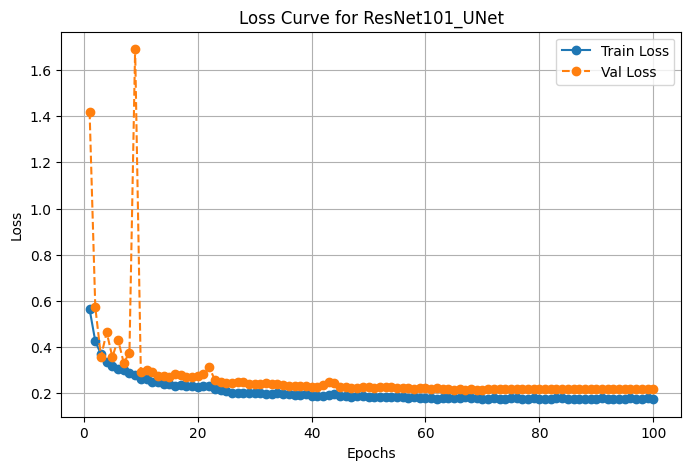

Checkpoint Loaded: /kaggle/working/model_storage/ResNet101_UNet.pth, Epoch: 67, Best Metric: 0.2144


Testing:  90%|█████████ | 9/10 [00:01<00:00,  5.89it/s, Loss=0.238]


Test Loss: 0.2300, Dice Score: 0.5955


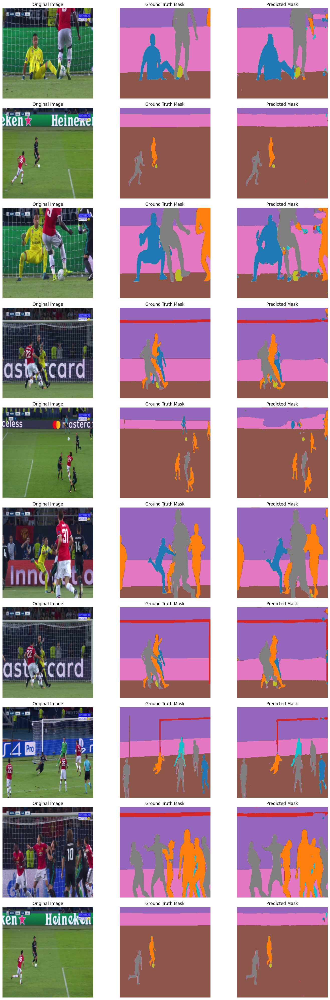

In [36]:
# Model training
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet101_model = resnet101_model.to(device)

# Only train learnable parameters
params = [p for p in resnet101_model.parameters() if p.requires_grad]

num_epochs = config.num_epochs
criterion = HybridLoss(alpha=0.5, num_classes=11)
optimizer = optim.Adam(params, lr=config.lr, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, threshold=1e-4, min_lr=1e-6)

train_model(resnet101_model, "ResNet101_UNet", train_transformed_loader, val_transformed_loader, criterion, optimizer, scheduler, num_epochs)
evaluate_model(resnet101_model, "ResNet101_UNet", test_transformed_loader, criterion)